In [1]:
import csv
from datetime import datetime
import json
import math
import os
import sys
import time
import numpy as np
import torch
import torch.nn as nn
from torch import Tensor
from torch.nn import (TransformerDecoder, TransformerDecoderLayer, TransformerEncoder, TransformerEncoderLayer)
from torch.utils.data import DataLoader
from tqdm import tqdm

In [2]:
try:
  from google.colab import drive
  IS_GOOGLE_COLAB = True
except ImportError:
  IS_GOOGLE_COLAB = False

if IS_GOOGLE_COLAB:
  mount_path='/content/drive'
  base_folder = "/Data/FX"
  data_folder = f'{mount_path}/My Drive{base_folder}'
  drive.mount(mount_path)
else:
  base_folder = '../../Data/'
  data_folder = os.path.join(base_folder, "FX", "OANDA-Japan MT5 Live")

In [3]:
if IS_GOOGLE_COLAB:
  drive.mount(mount_path)
  module_path = f"{mount_path}/My Drive/modules"
else:
  module_path = '../Models/modules'

sys.path.append(module_path)

import fprocess

In [ ]:
import os
import pandas as pd

ohlc_column = ['open','high','low','close']
file_name = f"mt5_USDJPY_min30.zip"

file_path = os.path.join(data_folder, file_name)
file_path = os.path.abspath(file_path)
df = pd.read_csv(file_path, parse_dates=True, index_col=0)
df

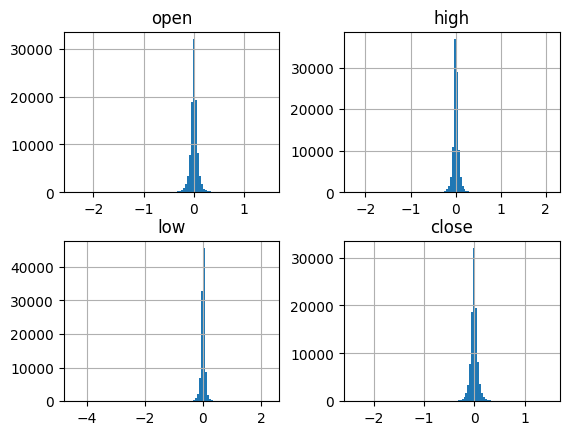

In [17]:
_ = df[ohlc_column].diff().hist(bins=100)

In [ ]:
split_ratio = 0.8
diff_df = df[ohlc_column].diff()

training_df = diff_df.iloc[:int(len(diff_df)*split_ratio)]
validation_df = diff_df.iloc[int(len(diff_df)*split_ratio):]

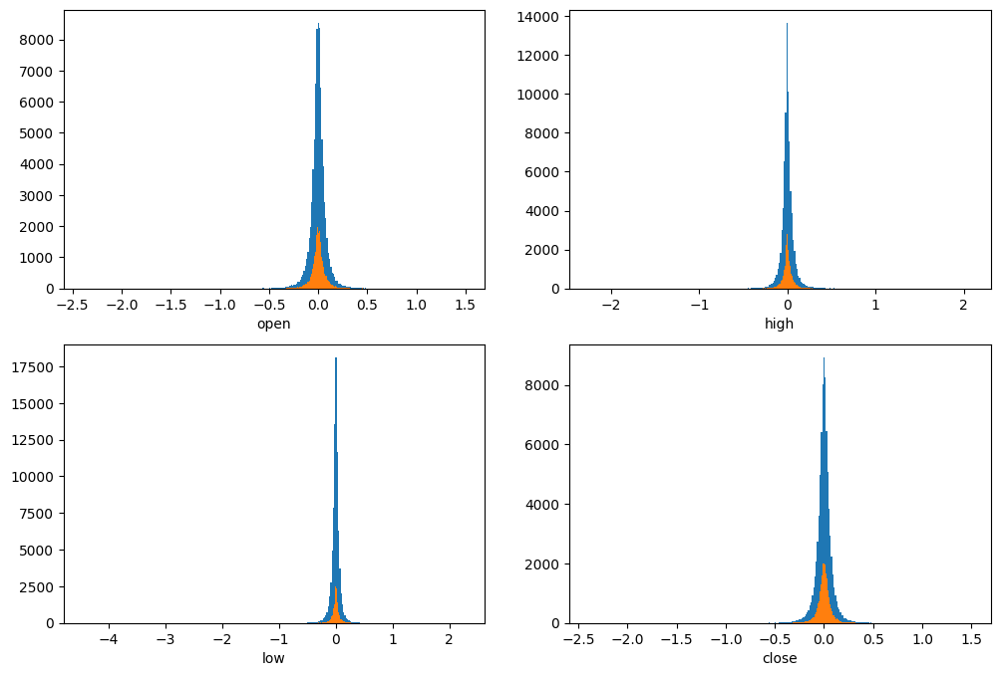

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
bins=300

axs[0][0].hist(training_df["open"], bins=bins)
axs[0][1].hist(training_df["high"], bins=bins)
axs[1][0].hist(training_df["low"], bins=bins)
axs[1][1].hist(training_df["close"], bins=bins)

axs[0][0].hist(validation_df["open"], bins=bins)
axs[0][1].hist(validation_df["high"], bins=bins)
axs[1][0].hist(validation_df["low"], bins=bins)
axs[1][1].hist(validation_df["close"], bins=bins)

axs[0][0].set_xlabel("open")
axs[0][1].set_xlabel("high")
axs[1][0].set_xlabel("low")
axs[1][1].set_xlabel("close")
fig.show()

In [ ]:
split_ratio = 0.8
clipped_df = diff_df.clip(-0.5, 0.5)

training_df = clipped_df.iloc[:int(len(diff_df)*split_ratio)]
validation_df = clipped_df.iloc[int(len(diff_df)*split_ratio):]

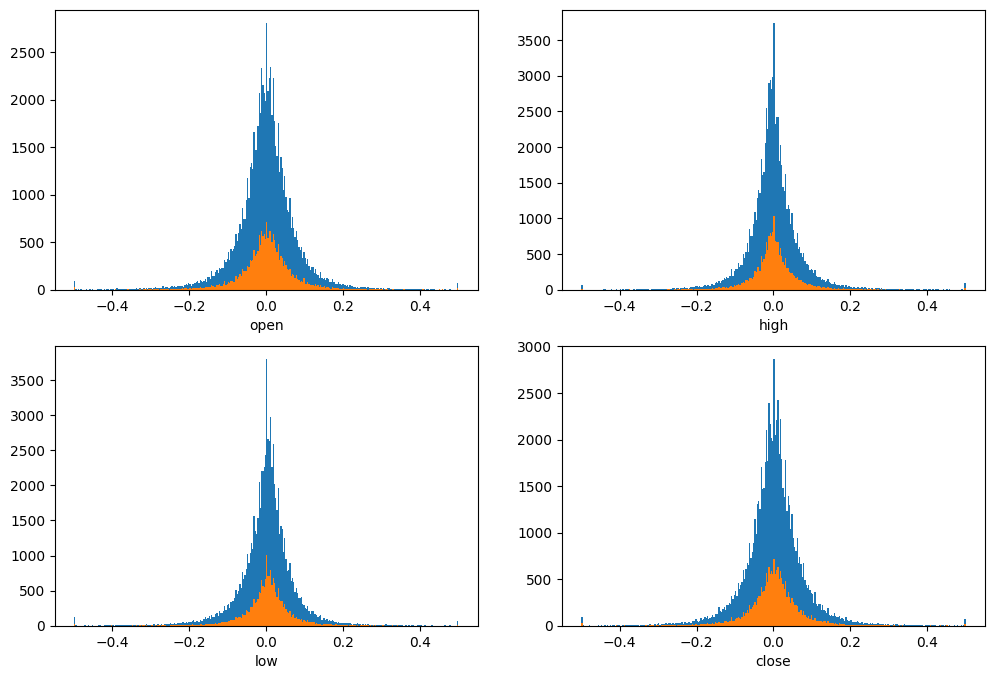

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
bins=300

axs[0][0].hist(training_df["open"], bins=bins)
axs[0][1].hist(training_df["high"], bins=bins)
axs[1][0].hist(training_df["low"], bins=bins)
axs[1][1].hist(training_df["close"], bins=bins)

axs[0][0].hist(validation_df["open"], bins=bins)
axs[0][1].hist(validation_df["high"], bins=bins)
axs[1][0].hist(validation_df["low"], bins=bins)
axs[1][1].hist(validation_df["close"], bins=bins)

axs[0][0].set_xlabel("open")
axs[0][1].set_xlabel("high")
axs[1][0].set_xlabel("low")
axs[1][1].set_xlabel("close")
fig.show()

<Axes: >

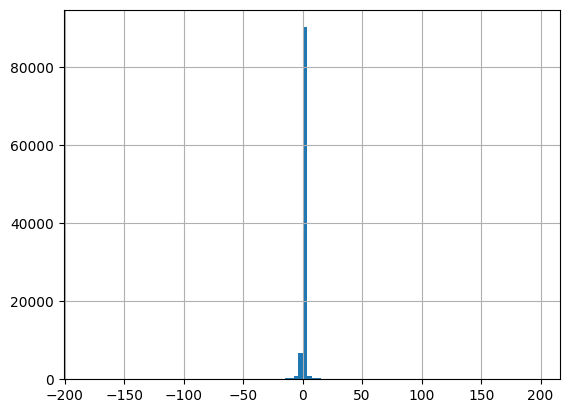

In [ ]:
df["spread"].diff().hist(bins=100)

# Token Variants

## Diff token with minmax

In [ ]:
columns = [*ohlc_column, "spread"]

diff_p = fprocess.DiffPreProcess(columns=columns)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.MinMaxPreProcess(columns=columns)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
src_df = df[columns].copy()

for process in processes:
  src_df = process(src_df)

In [ ]:
src_df.head()

,spread,low,open,close,high
time,,,,,
2014-07-07 08:30:00,NaN,NaN,NaN,NaN,NaN
2014-07-07 09:00:00,-0.039578,0.325819,0.237949,0.235701,0.050380
2014-07-07 09:30:00,-0.039578,0.304167,0.235385,0.194665,0.025075
2014-07-07 10:00:00,-0.039578,0.309803,0.195897,0.217235,0.010352
2014-07-07 10:30:00,-0.039578,0.294973,0.214359,0.190049,0.026915


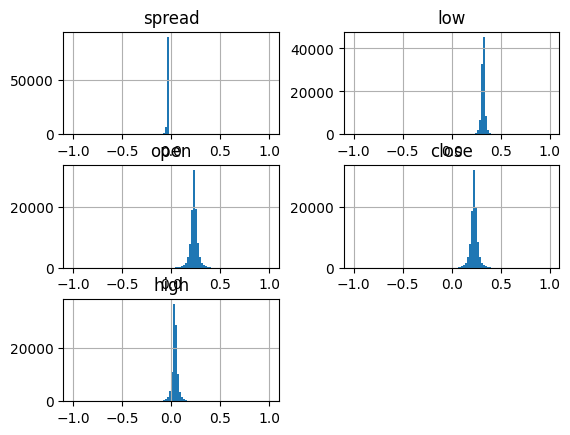

In [ ]:
_ = src_df.hist(bins=100)

In [ ]:
print('skew:', src_df.skew().values)
print('kurt:', src_df.kurtosis().values)

skew: [ 1.73560231 -4.76680581 -1.08251622 -1.10316985  0.1698781 ]
kurt: [404.68248054 212.82098174  41.72337237  41.8575681   46.36204226]


### Confirm similarity of ohlc

In [ ]:
import random

# pick up sample indices to reduce require memory
indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()
src_df_lim = src_df[ohlc_column].iloc[indices].copy()

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

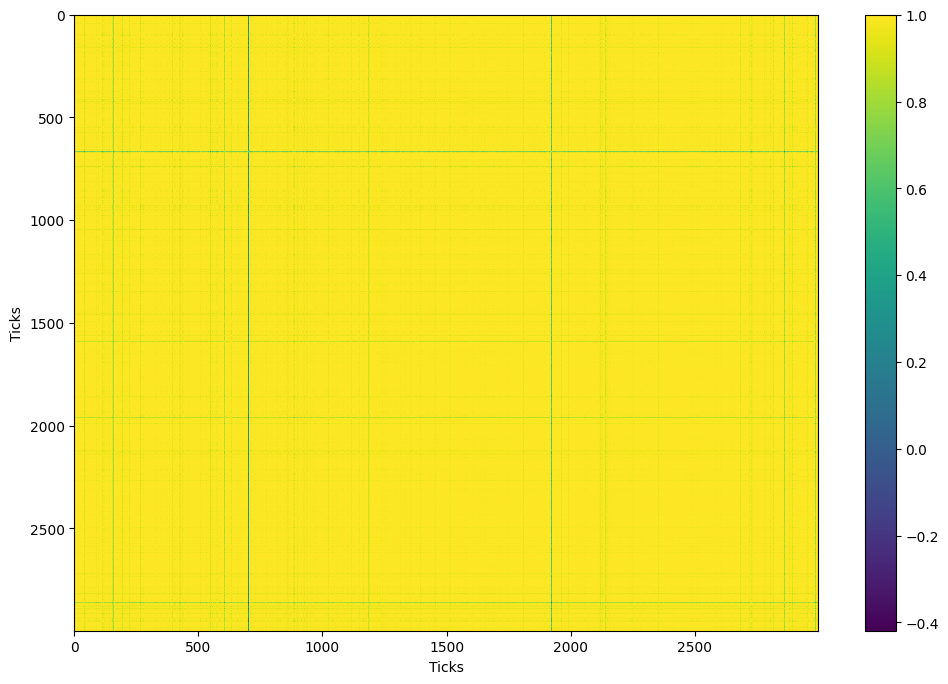

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

In [ ]:
import random

# Check it with clipping values
src_df_lim = src_df[ohlc_column].iloc[indices].clip(-0.5, 0.5).copy()

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

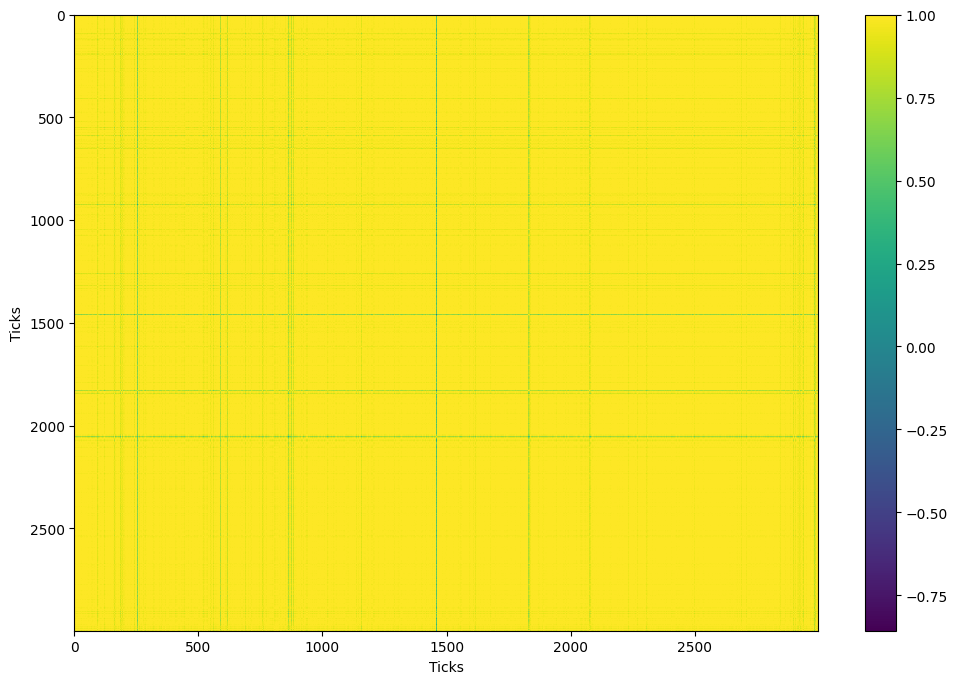

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

### Confirm Boxplot

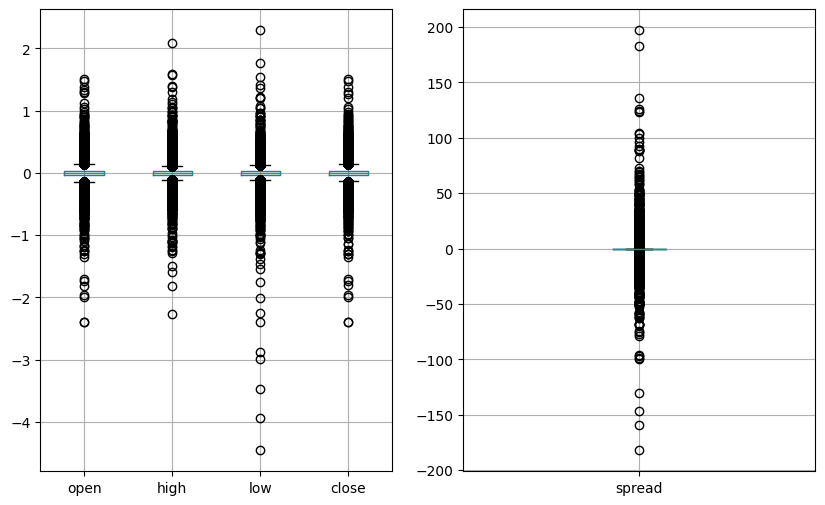

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1,2, figsize=(10, 6))
# box plot only with diff
_ = df[ohlc_column].diff().boxplot(ax=axs[0])
_ = df[["spread"]].diff().boxplot(ax=axs[1])

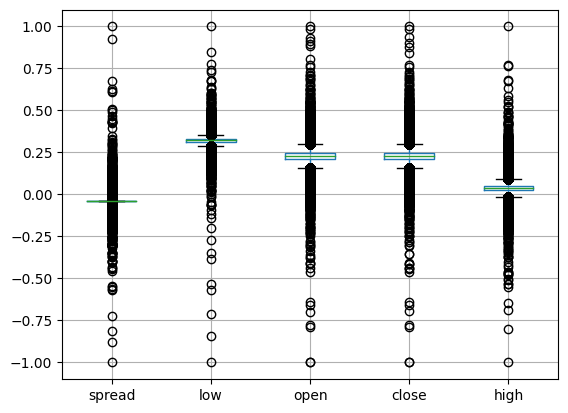

In [ ]:
# box plot with diff and minmax
_ = src_df.boxplot()

In [ ]:
# Confirm daily, monthly boxplot
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta

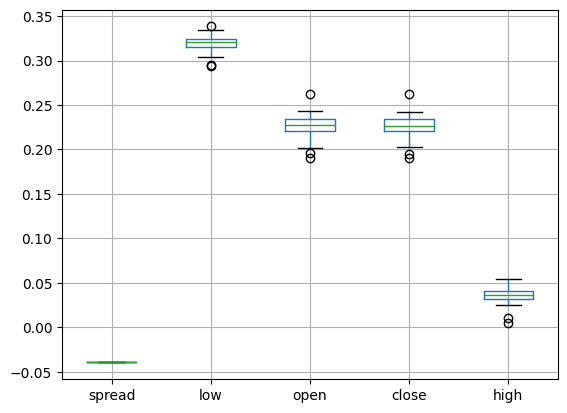

In [ ]:
# sample day
one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
_ = one_day_df.boxplot()

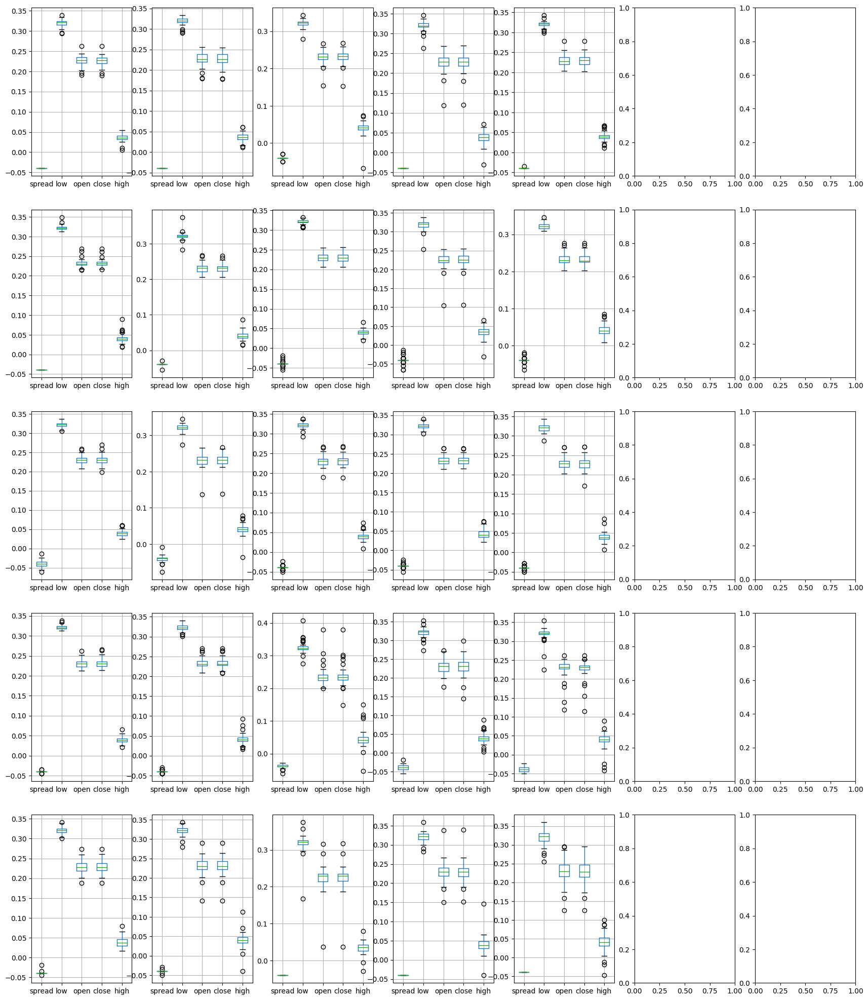

In [ ]:
import matplotlib.pyplot as plt

start_index = 1
delta_days = 30

start_date = src_df.index[start_index]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=delta_days)
end_date = start_date + delta

column_size = 7
row_size = delta_days // column_size + 1

fig, axs = plt.subplots(row_size, column_size, figsize=(column_size*3, 5*row_size))

internal_delta = datetime.timedelta(days=1)
current_date = start_date
for y_index in range(0, row_size):
  for x_index in range(0, column_size):
    next_date = current_date + internal_delta
    daily_df = src_df[(src_df.index >= current_date) & (src_df.index < next_date)]
    if len(daily_df) > 0:
      ax = axs[y_index][x_index]
      daily_df.boxplot(ax=ax)
    current_date = next_date

In [ ]:
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, 1)
if start_date.month < 12:
  year = start_date.year
  month = start_date.month + 1
else:
  year = start_date.year + 1
  month = 1

end_date = datetime.datetime(year, month, 1)
last_date = src_df.index[-1]

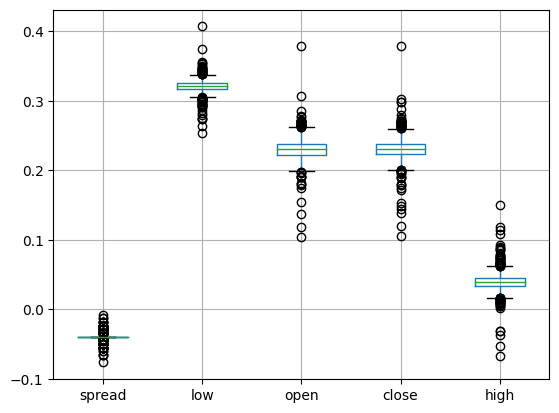

In [ ]:
one_month_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
_ = one_month_df.boxplot()

[]

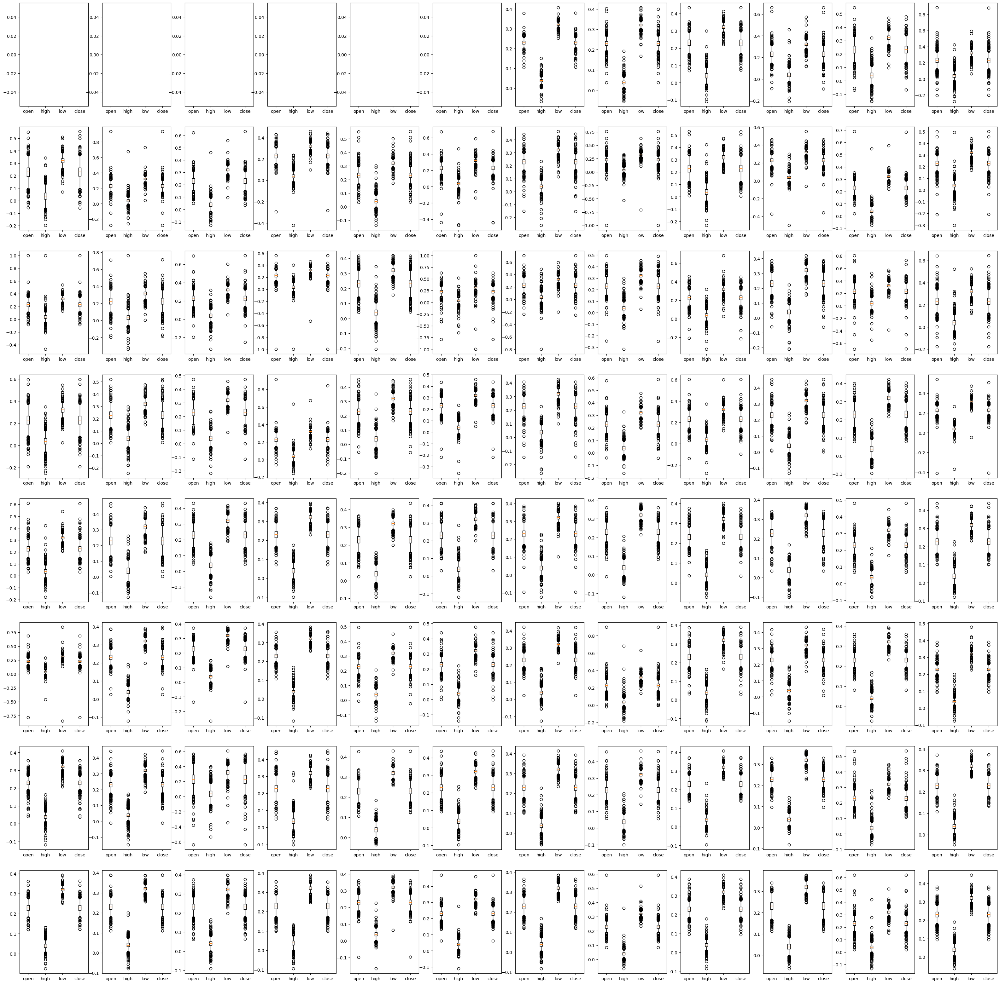

In [ ]:
import matplotlib.pyplot as plt

initial_year = start_date.year
num_of_years = last_date.year - start_date.year
fig, axs = plt.subplots(num_of_years, 12, figsize=(40, 5*num_of_years))

for y_index in range(0, num_of_years):
  year = initial_year + y_index
  for x_index in range(0, 12):
    month = x_index + 1
    start_date = datetime.datetime(year, month, day=1)
    if month < 12:
      month += 1
    else:
      year += 1
      month = 1

    end_date = datetime.datetime(year, month, 1)
    one_month_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
    for index, column in enumerate(ohlc_column):
      axs[y_index, x_index].boxplot(one_month_df[column].dropna(), positions=[index], labels=[column])
plt.plot()

In [ ]:
import datetime

start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, 1, 1)
end_date = datetime.datetime(start_date.year + 1, 1, 1)

<Axes: >

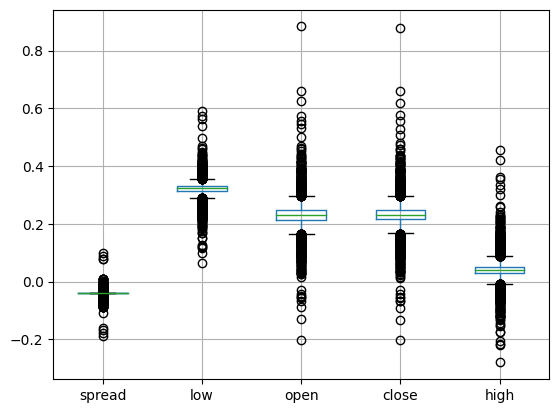

In [ ]:
one_year_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
one_year_df.boxplot()

### Categorize Diff Values

In [ ]:
src_df

,high,close,open,spread,low
time,,,,,
2014-07-07 08:30:00,NaN,NaN,NaN,-0.97,NaN
2014-07-07 09:00:00,0.050380,0.235701,0.237949,-0.97,0.325819
2014-07-07 09:30:00,0.025075,0.194665,0.235385,-0.97,0.304167
2014-07-07 10:00:00,0.010352,0.217235,0.195897,-0.97,0.309803
2014-07-07 10:30:00,0.026915,0.190049,0.214359,-0.97,0.294973
...,...,...,...,...,...
2022-08-12 21:30:00,0.037037,0.241857,0.217949,-0.97,0.321667
2022-08-12 22:00:00,0.050380,0.225442,0.241538,-0.97,0.320184
2022-08-12 22:30:00,0.019094,0.234163,0.225128,-0.97,0.319591


In [ ]:
import random

label_num_k = 40
max_iter = 10000
count = 0

tokens_df = src_df[ohlc_column].iloc[1:].copy()

labels = np.fromiter(random.choices(range(label_num_k), k=tokens_df.shape[0]), dtype = int)
labels_prev = np.zeros(tokens_df.shape[0])
cluster_centers = np.eye(label_num_k, tokens_df.shape[1])

while (not (labels == labels_prev).all()):
    for i in range(label_num_k):
        clusters = tokens_df.iloc[labels == i, :]
        if len(clusters) > 0:
          cluster_centers[i, :] = clusters.mean(axis = 0)
        else:
          cluster_centers[i, :] = np.ones(tokens_df.shape[1])
    dist = ((tokens_df.values[:, :, np.newaxis] - cluster_centers.T[np.newaxis, :, :]) ** 2).sum(axis = 1)
    # dist = np.sqrt(dist)
    labels_prev = labels
    labels = dist.argmin(axis = 1)
    count += 1
    if count > max_iter:
      print("iteration over the limit")
      break

In [ ]:
# number of tokens which belong to the class index
unique_values, counts = np.unique(labels, return_counts=True)
counts

array([13276,  2255,  1368,   165,    45,    10,   119,  2682,  1751,
          75,  3849,   854,   456,  8198,  1101,   522,  8986,  3321,
        8372,    16,  3563,   257,  3408,   607,  3095,   588,    40,
        4431,   278,  4693,  1402,  1616,   852,   665,  8098,    21,
        2012,   626,  6845,   201])

[]

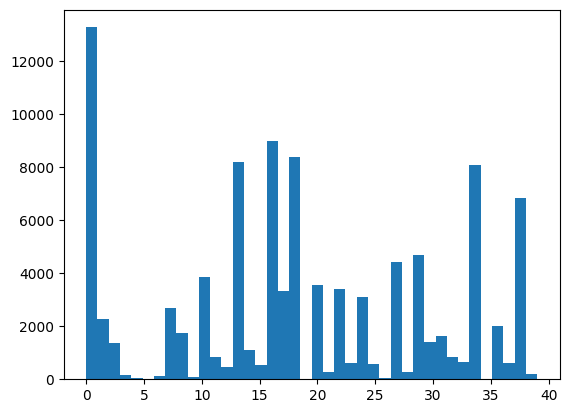

In [ ]:
import matplotlib.pyplot as plt

plt.hist(labels, bins=len(unique_values))
plt.plot()

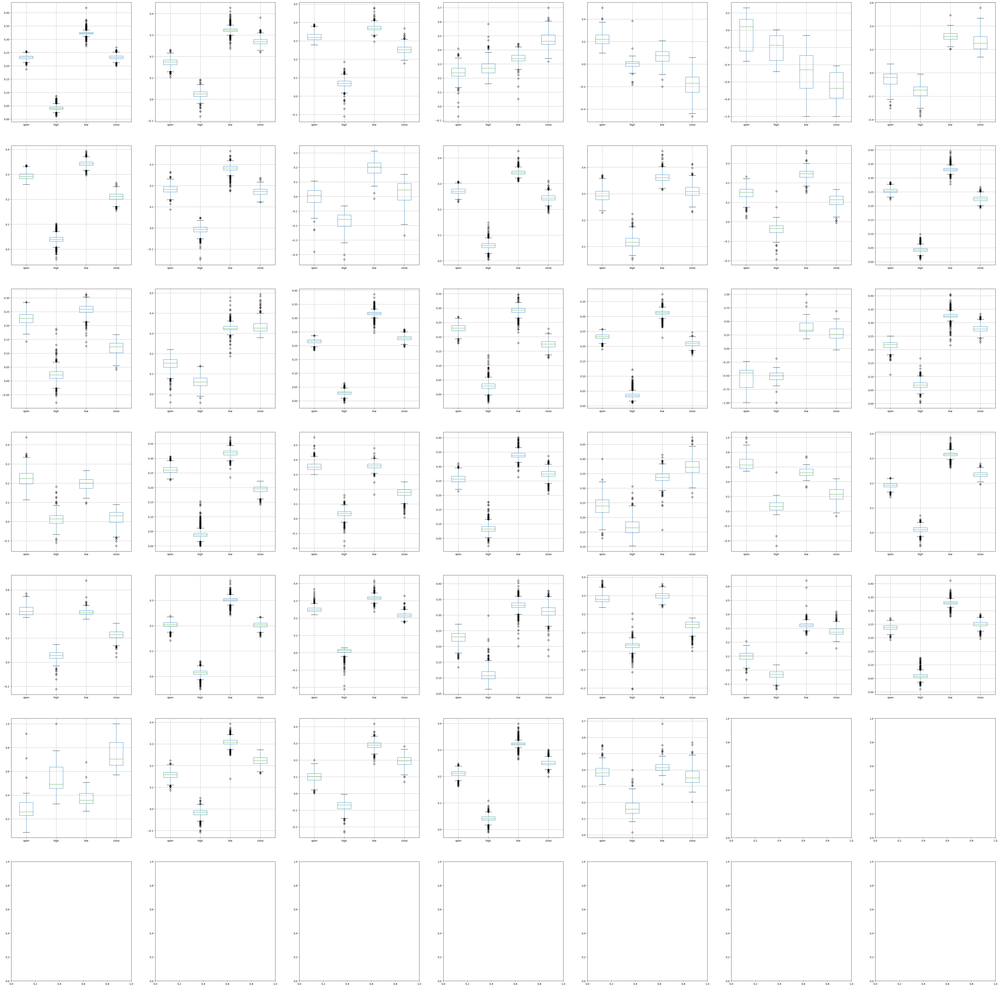

In [ ]:
# box plot for each class
unit = int(np.ceil(np.sqrt(label_num_k)))
fig, axs = plt.subplots(unit, unit, figsize=(10*unit, 10*unit))

for label in range(0, label_num_k):
  label_values = tokens_df.iloc[labels == label, :]
  x_index = label % unit
  y_index = label // unit

  label_values.boxplot(ax=axs[y_index, x_index])

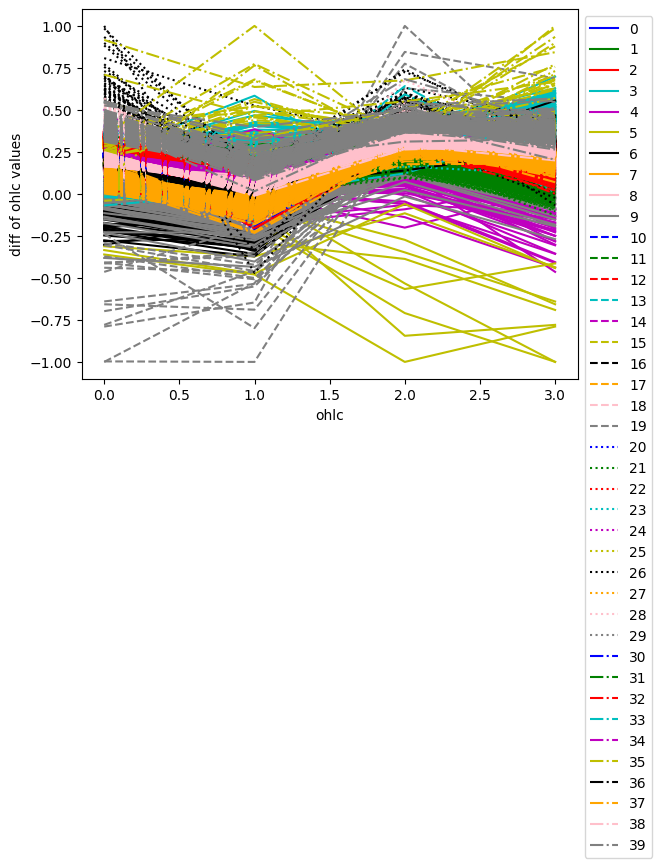

In [ ]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'pink', 'gray']
line_styles = ['-', '--', ':', '-.']

if label_num_k > len(colors) * len(line_styles):
  print('lack of line styles')
else:
  for label in range(0, label_num_k):
    label_values = tokens_df.iloc[labels == label, :]
    color_index = label % len(colors)
    style_index = label // len(colors)
    label_values = label_values.dropna().values
    if len(label_values) > 0:
      for value in label_values[:-1]:
        plt.plot(value, linestyle=line_styles[style_index], color=colors[color_index])
      # to show label, add label last values only
      plt.plot(label_values[-1], linestyle=line_styles[style_index], color=colors[color_index], label=label)
  plt.xlabel("ohlc")
  plt.ylabel("diff of ohlc values")
  legend = plt.legend(loc='upper left')
  legend.set_bbox_to_anchor((1, 1))
  plt.show()

In [ ]:
# minimum count may be not enough to use this categories for Deep Learning
ranking = pd.Series(labels).value_counts()
ranking

0     13276
16     8986
18     8372
13     8198
34     8098
38     6845
29     4693
27     4431
10     3849
20     3563
22     3408
17     3321
24     3095
7      2682
1      2255
36     2012
8      1751
31     1616
30     1402
2      1368
14     1101
11      854
32      852
33      665
37      626
23      607
25      588
15      522
12      456
28      278
21      257
39      201
3       165
6       119
9        75
4        45
26       40
35       21
19       16
5        10
dtype: int64

<Axes: >

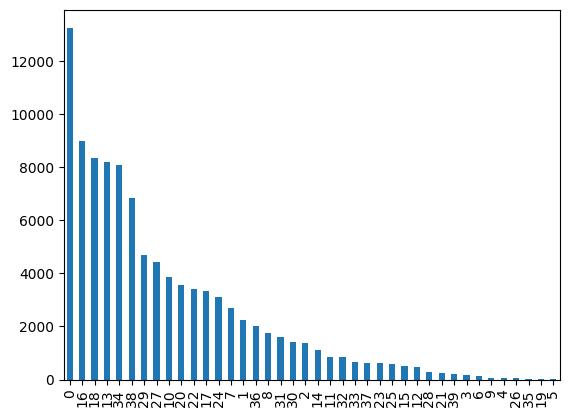

In [ ]:
# k-means shows different result every time.
ranking.plot.bar()

In [ ]:
tokens_df.iloc[labels == 1]

,open,high,low,close
time,,,,
2014-07-31 23:00:00,0.197949,0.028755,0.352217,0.298282
2014-08-04 02:30:00,0.188718,0.029216,0.323447,0.254681
2014-08-08 04:30:00,0.173846,0.008512,0.334421,0.258271
2014-08-08 16:30:00,0.158462,0.025535,0.321667,0.288023
2014-08-15 18:00:00,0.171795,0.003451,0.326116,0.263914
...,...,...,...,...
2022-08-10 15:00:00,0.143077,0.065102,0.285185,0.258271
2022-08-10 22:00:00,0.131282,0.019554,0.326413,0.276225
2022-08-12 01:30:00,0.169231,0.029676,0.322557,0.265453


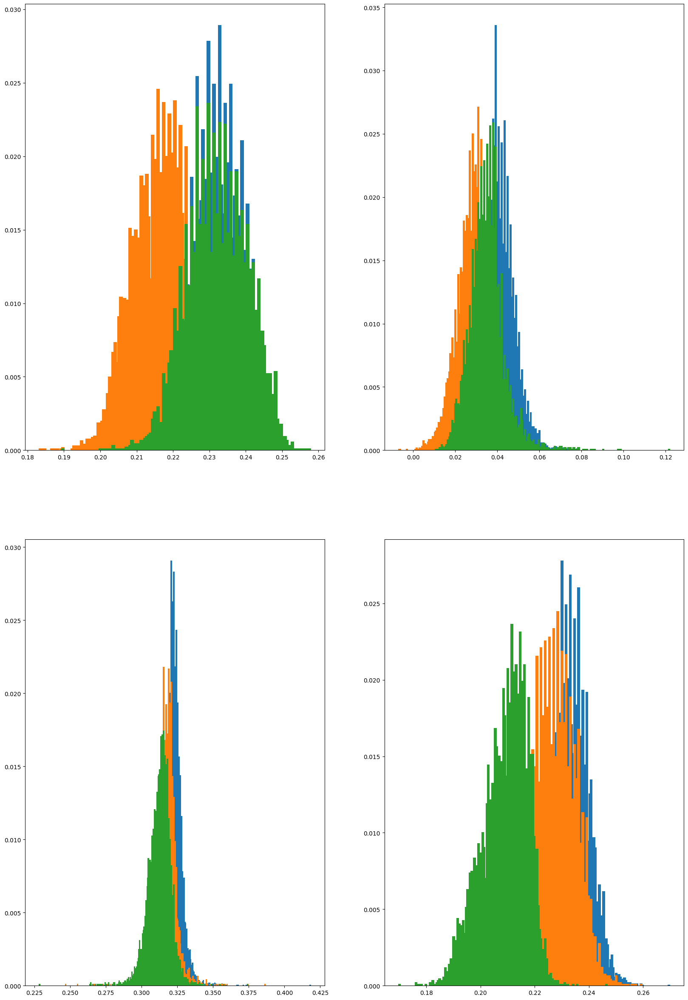

In [ ]:
# See distribution for targeted labels
#target_number = label_num_k
base_number = 0
target_number = 3
fig, axs = plt.subplots(2, 2, figsize=(20, 30))

for label_id in ranking.index[base_number: base_number + target_number]:
    label_df = tokens_df.iloc[labels == label_id]
    data = label_df["open"].value_counts()/len(label_df)
    axs[0, 0].bar(data.index, data.values, width=0.001)
    data = label_df["high"].value_counts()/len(label_df)
    axs[0, 1].bar(data.index, data.values, width=0.001)
    data = label_df["low"].value_counts()/len(label_df)
    axs[1, 0].bar(data.index, data.values, width=0.001)
    data = label_df["close"].value_counts()/len(label_df)
    axs[1, 1].bar(data.index, data.values, width=0.001)
fig.show()

In [ ]:
print('skew:', label_df.skew().values)
print('kurt:', label_df.kurtosis().values)

skew: [-0.16190248  1.31588501 -0.53153784 -0.47331813]
kurt: [-0.19336461  6.83891915  4.34587339 -0.1109122 ]


<BarContainer object of 40 artists>

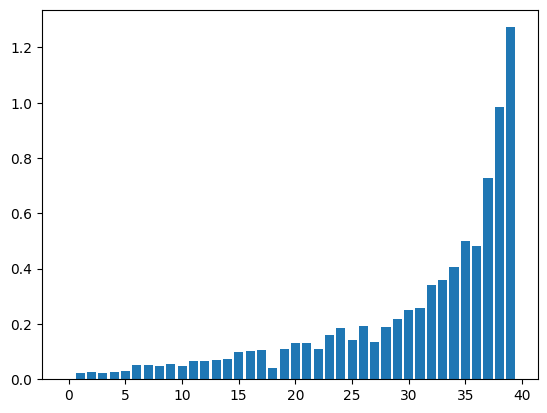

In [ ]:
# Confirm distance between label and most frequent label
distances_with_top = []

for label in ranking.index:
  distance = np.linalg.norm(cluster_centers[ranking.index[0]] - cluster_centers[label])
  distances_with_top.append(distance)
plt.bar(range(len(ranking)), distances_with_top)

In [ ]:
def cos_sim(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

<BarContainer object of 40 artists>

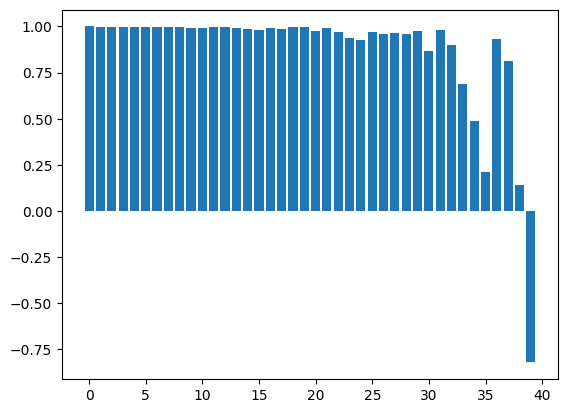

In [ ]:
# Confirm similarity between label and most frequent label
similarities_with_top = []

for label in ranking.index:
  distance = cos_sim(cluster_centers[ranking.index[0]], cluster_centers[label])
  similarities_with_top.append(distance)
plt.bar(range(len(ranking)), similarities_with_top)

In [ ]:
# Confirm if the distribution has bias based on class

In [ ]:
probability_df = ranking/ranking.sum()

In [ ]:
indices[labels == ranking.index[0]] + 1

array([     1,      8,      9, ..., 100711, 100714, 100716])

<Axes: >

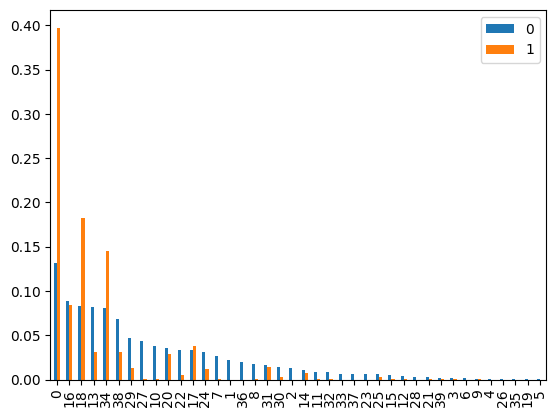

In [ ]:
indices = np.arange(tokens_df.shape[0])
# filter the indices of the most frequent class, then add 1 index.
next_label_indices = indices[labels == ranking.index[0]] + 1

# retrieve class number of next indices
next_rank_df = pd.Series(labels[next_label_indices]).value_counts()
next_prob_df = next_rank_df/next_rank_df.sum()

probability_df = pd.concat([probability_df, next_prob_df], axis=1)
probability_df.plot.bar()

<Axes: >

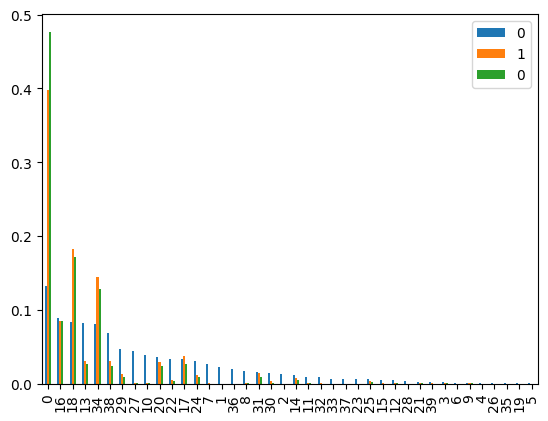

In [ ]:
next_label_indices = next_label_indices[labels[next_label_indices] == ranking.index[0]] + 1
next_rank_df = pd.Series(labels[next_label_indices]).value_counts()
next_prob_df = next_rank_df/next_rank_df.sum()
probability_df = pd.concat([probability_df, next_prob_df], axis=1)
probability_df.plot.bar()

In [ ]:
# try bpe to confirm bias
import re, collections

def get_stats(word):
    pairs = collections.defaultdict(int)
    symbols = word.split()
    for i in range(len(symbols)-1):
        pairs[symbols[i],symbols[i+1]] += 1
    return pairs

def merge_vocab(pair, w_in, new_label):
    v_out = {}
    bigram = re.escape(' '.join(pair))
    p = re.compile(r'(?<!\S)' + bigram + r'(?!\S)')
    w_out = p.sub(f"{new_label}", w_in)
    return w_out

word = ""
for label in labels:
  word += f" {str(label)}"
ids = {}

num_merges = len(labels)
min_pair_count = 100
next_label = max(labels) + 1

for i in range(num_merges):
    pairs = get_stats(word)
    if pairs:
      best = max(pairs, key=pairs.get)
      pair_count = pairs[best]

      if pair_count >= min_pair_count:
        word = merge_vocab(best, word, str(next_label))
        ids[next_label] = {"pair": best, "amount": pair_count}
        next_label += 1
      else:
        print(f"pair count is less than the limit: {pair_count}, {best}, {i}")
        break
    else:
      print("no more pairs")
      break

pair count is less than the limit: 98, ('10', '13'), 101


In [ ]:
# pair: 0 to max(label) means class.
list(ids.items())[:20]

[(40, {'pair': ('0', '0'), 'amount': 5279}),
 (41, {'pair': ('34', '13'), 'amount': 2702}),
 (42, {'pair': ('18', '16'), 'amount': 2549}),
 (43, {'pair': ('38', '13'), 'amount': 2194}),
 (44, {'pair': ('18', '38'), 'amount': 1352}),
 (45, {'pair': ('18', '29'), 'amount': 1293}),
 (46, {'pair': ('16', '0'), 'amount': 1106}),
 (47, {'pair': ('20', '10'), 'amount': 1016}),
 (48, {'pair': ('22', '27'), 'amount': 939}),
 (49, {'pair': ('18', '27'), 'amount': 888}),
 (50, {'pair': ('40', '40'), 'amount': 863}),
 (51, {'pair': ('17', '27'), 'amount': 833}),
 (52, {'pair': ('20', '7'), 'amount': 784}),
 (53, {'pair': ('17', '1'), 'amount': 783}),
 (54, {'pair': ('0', '34'), 'amount': 754}),
 (55, {'pair': ('17', '36'), 'amount': 709}),
 (56, {'pair': ('24', '10'), 'amount': 708}),
 (57, {'pair': ('16', '16'), 'amount': 699}),
 (58, {'pair': ('34', '34'), 'amount': 630}),
 (59, {'pair': ('18', '43'), 'amount': 626})]

In [ ]:
# Confirm bias by daily or weekly values
label_df = pd.DataFrame(labels, columns=["label"], index=tokens_df.index)
label_df

,label
time,
2014-07-07 09:00:00,20
2014-07-07 09:30:00,1
2014-07-07 10:00:00,17
2014-07-07 10:30:00,34
2014-07-07 11:00:00,17
...,...
2022-08-12 21:30:00,18
2022-08-12 22:00:00,20
2022-08-12 22:30:00,1


In [ ]:
label_nan_df = label_df.groupby(pd.Grouper(level=0, freq="30MIN")).first()
label_nan_df

,label
time,
2014-07-07 09:00:00,20.0
2014-07-07 09:30:00,1.0
2014-07-07 10:00:00,17.0
2014-07-07 10:30:00,34.0
2014-07-07 11:00:00,17.0
...,...
2022-08-12 21:30:00,18.0
2022-08-12 22:00:00,20.0
2022-08-12 22:30:00,1.0


In [ ]:
import datetime

delta = datetime.timedelta(minutes=30)
nan_indices = label_nan_df[label_nan_df.isnull().any(axis=1)].index
close_time_sample = nan_indices[0] - delta

In [ ]:
next_time = close_time_sample + delta
while next_time in nan_indices:
  next_time += delta
open_time_sample = next_time

In [ ]:
open_weekday = open_time_sample.weekday()
open_hour = open_time_sample.hour
open_minutes = open_time_sample.minute

close_weekday = close_time_sample.weekday()
close_hour = close_time_sample.hour
close_minutes = close_time_sample.minute

In [ ]:
import datetime

freq_mins = 30
delta = datetime.timedelta(days=1)

start_date = tokens_df.index[0]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day, open_hour, open_minutes) + delta
end_date = start_date + delta
last_date = tokens_df.index[-1]
hodilday_label = max(labels) + 1

expected_length = int(delta.total_seconds()/(60*freq_mins))
holiday_token = np.array([ hodilday_label for i in range(expected_length)])

In [ ]:
day_tokens = []

while end_date < last_date:
  one_day_df = label_nan_df[(label_nan_df.index >= start_date) & (label_nan_df.index < end_date)]
  if len(one_day_df) > 0:
    one_day_df = one_day_df.fillna(hodilday_label)
    if len(one_day_df) != expected_length:
      print(f"data would be missing on {start_date}")
      continue
    day_token = one_day_df.values.T[0]
    day_tokens.append(day_token)
  else: #if one_day_df.isnull().all().any():
    #market holiday
    day_tokens.append(holiday_token)
  start_date = end_date
  end_date += delta
day_tokens = np.array(day_tokens)

In [ ]:
len(day_tokens)

2957

In [ ]:
day_tokens[0]

array([ 1.,  1.,  1.,  1., 34., 18., 20., 20., 20.,  1.,  1., 20., 36.,
        1.,  1., 18., 20., 20.,  1., 18.,  1.,  1., 18.,  1., 18.,  1.,
       18.,  1.,  1.,  1.,  1., 34., 17.,  1.,  1., 18., 20., 20., 20.,
       20.,  1.,  1., 20.,  1., 20., 20.,  1.,  1.])

In [ ]:
def day_token_to_word(day_token):
  word = ""
  for label in day_token:
    word += f" {str(int(label))}"
  return word

In [ ]:
vocab = {}

for day_token in day_tokens:
  word = day_token_to_word(day_token)
  if word in vocab:
    vocab[word] += 1
  else:
    vocab[word] = 1

In [ ]:
for key, value in vocab.items():
  if value > 1:
    print(f"{key}: {value}")

 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40: 856
 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28: 18


In [ ]:
import re, collections

def get_stats(vocab):
    pairs = collections.defaultdict(int)
    for word, freq in vocab.items():
        symbols = word.split()
        for i in range(len(symbols)-1):
            pairs[symbols[i],symbols[i+1]] += freq
    return pairs

def merge_vocab(pair, v_in):
    v_out = {}
    bigram = re.escape(' '.join(pair))
    p = re.compile(r'(?<!\S)' + bigram + r'(?!\S)')
    for word in v_in:
        w_out = p.sub(''.join(pair), word)
        v_out[w_out] = v_in[word]
    return v_out


num_merges = 1000
min_pair_count = 100
additional_vocab = {}

for i in range(num_merges):
    pairs = get_stats(vocab)
    if pairs:
      best = max(pairs, key=pairs.get)
      pair_count = pairs[best]

      if pair_count >= min_pair_count:
        vocab = merge_vocab(best, vocab)
        additional_vocab[best] = pair_count
      else:
        print(f"pair count is less than the limit: {pair_count}, {best}, {i}")
        break
    else:
      print("no more pairs")
      break

pair count is less than the limit: 97, ('2828282828282828', '2828282828282828'), 110


In [ ]:
additional_vocab

{('40', '40'): 40385,
 ('4040', '4040'): 19738,
 ('40404040', '40404040'): 9432,
 ('7', '7'): 5310,
 ('20', '20'): 5031,
 ('4040404040404040', '4040404040404040'): 4282,
 ('1', '1'): 4137,
 ('1', '18'): 2703,
 ('29', '36'): 2644,
 ('16', '16'): 2206,
 ('40404040404040404040404040404040',
  '40404040404040404040404040404040'): 1712,
 ('3', '30'): 1620,
 ('34', '17'): 1371,
 ('7', '2'): 1304,
 ('16', '30'): 1297,
 ('8', '2'): 1258,
 ('10', '2'): 1140,
 ('28', '28'): 1130,
 ('20', '1'): 930,
 ('20', '11'): 909,
 ('77', '77'): 865,
 ('18', '36'): 858,
 ('4040404040404040404040404040404040404040404040404040404040404040',
  '40404040404040404040404040404040'): 856,
 ('16', '7'): 847,
 ('20', '118'): 779,
 ('10', '8'): 771,
 ('2020', '2020'): 664,
 ('1', '17'): 624,
 ('16', '77'): 592,
 ('14', '39'): 585,
 ('35', '27'): 537,
 ('3', '33'): 489,
 ('11', '18'): 485,
 ('20', '2936'): 484,
 ('2828', '2828'): 479,
 ('23', '23'): 453,
 ('20', '36'): 438,
 ('30', '2'): 398,
 ('8', '8'): 390,
 ('17', 

In [ ]:
len(additional_vocab)

110

In [ ]:
# Categorize ohlc with daily aspects

In [ ]:
import datetime
start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta
last_date = src_df.index[-1]

In [ ]:
tokens = []
while end_date < last_date:
  one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)].dropna()
  if len(one_day_df) > 0:
    day_token = one_day_df.mean().values
    tokens.append(day_token)
  else:
    #market holiday
    pass
  start_date = end_date
  end_date += delta
tokens = np.array(tokens)

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

input2 = torch.tensor(tokens)
for token in tokens:
  input1 = torch.tensor([token])
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

<ipython-input-10-6167f0185675>:6: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  input1 = torch.tensor([token])


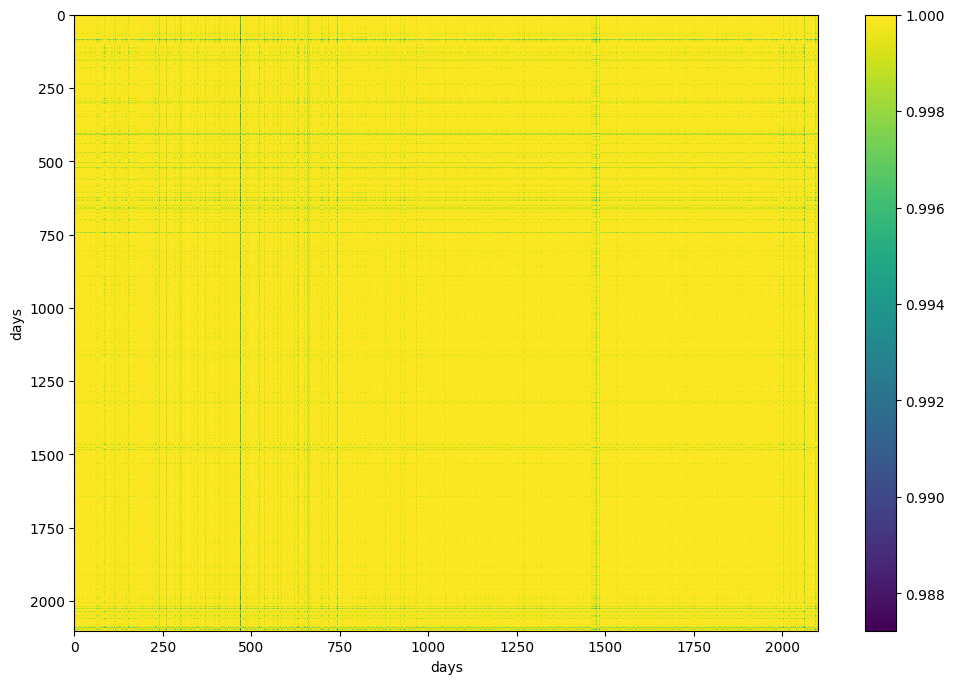

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('days')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('days')
plt.colorbar()
plt.show()

In [ ]:
import datetime
start_date = src_df.index[1]
start_date = datetime.datetime(start_date.year, start_date.month, start_date.day)
delta = datetime.timedelta(days=1)
end_date = start_date + delta
last_date = src_df.index[-1]

In [ ]:
tokens = []
days_of_tokens = []
while end_date < last_date:
  one_day_df = src_df[(src_df.index >= start_date) & (src_df.index < end_date)].dropna()
  if len(one_day_df) > 0:
    day_token = np.append(one_day_df.quantile(0.25).values, one_day_df.quantile(0.75).values)
    tokens.append(day_token)
    days_of_tokens.append(start_date)
  else:
    #market holiday
    pass
  start_date = end_date
  end_date += delta
tokens = np.array(tokens)

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

input2 = torch.tensor(tokens)
for token in tokens:
  input1 = torch.tensor([token])
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

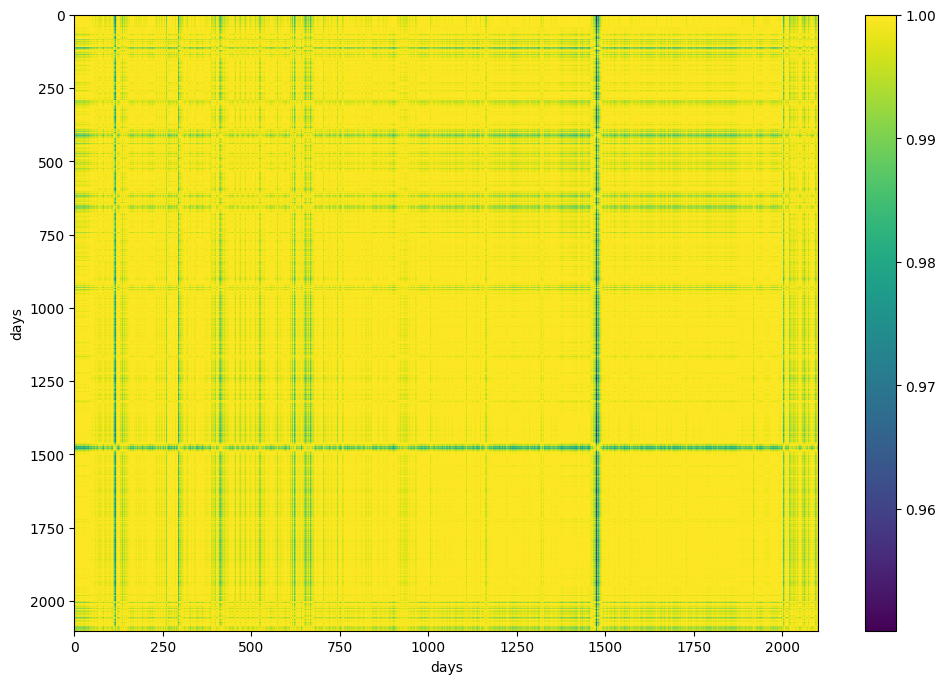

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('days')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('days')
plt.colorbar()
plt.show()

In [ ]:
import random

rand_index = random.randint(0, len(tokens))

np.dot(tokens[rand_index], tokens[0])

0.42896272113988915

In [ ]:
tokens.shape

(2102, 8)

In [ ]:
label_num_k = 10
max_iter = 10000
count = 0

labels = np.fromiter(random.choices(range(label_num_k), k=tokens.shape[0]), dtype = int)
labels_prev = np.zeros(tokens.shape[0])
cluster_centers = np.zeros((label_num_k, tokens.shape[1]))

while (not (labels == labels_prev).all() and count < max_iter):
    for i in range(label_num_k):
        clusters = tokens[labels == i, :]
        if len(clusters) > 0:
          cluster_centers[i, :] = clusters.mean(axis = 0)
        else:
          cluster_centers[i, :] = np.NaN
    dist = ((tokens[:, :, np.newaxis] - cluster_centers.T[np.newaxis, :, :]) ** 2).sum(axis = 1)
    labels_prev = labels
    labels = dist.argmin(axis = 1)
    count += 1

(array([318.,  18., 146., 521., 119.,  40.,  55., 185., 385., 315.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

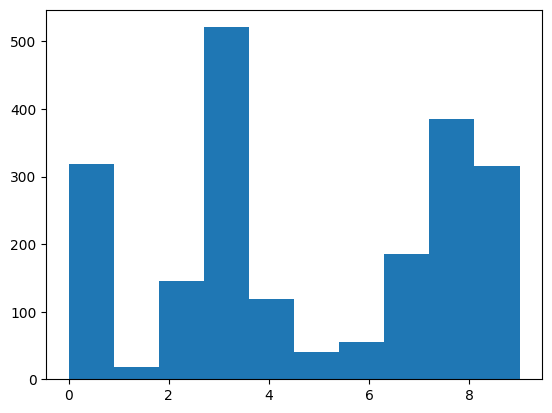

In [ ]:
import matplotlib.pyplot as plt

plt.hist(labels, bins=label_num_k)

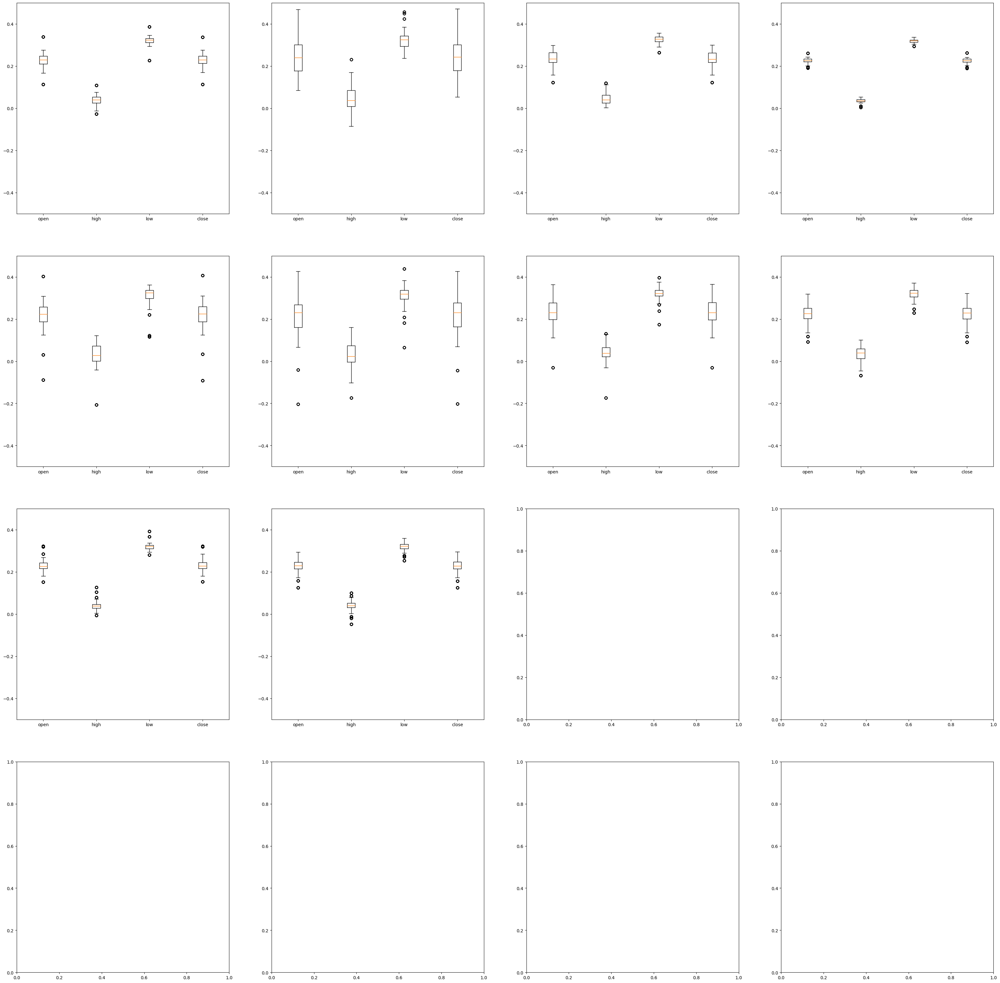

In [ ]:
days_of_tokens = np.array(days_of_tokens)
unit = int(np.ceil(np.sqrt(label_num_k)))
fig, axs = plt.subplots(unit, unit, figsize=(10*unit, 10*unit))

for label in range(0, label_num_k):
  label_days = days_of_tokens[labels == label]
  x_index = label % unit
  y_index = label // unit
  label_values = None

  for start_date in label_days:
    start_date = label_days[0]
    end_date = start_date + delta
    token = src_df[(src_df.index >= start_date) & (src_df.index < end_date)]
    if label_values is None:
      label_values = token
    else:
      label_values = pd.concat([label_values, token])

  for index, column in enumerate(ohlc_column):
      axs[y_index, x_index].boxplot(label_values[column].dropna(), positions=[index], labels=[column])
      axs[y_index, x_index].set_ylim(-0.5, 0.5)

### Filter outliers only

In [ ]:
target_columns = ["open","high", "low", "close"]

# function to remove values
def common_df(df, target_columns, alpha = 3):
    target_df = df[target_columns].diff()
    stats_df = target_df.describe()
    condition_df = pd.DataFrame()

    condition_df["upper"] = stats_df.loc["mean"] + stats_df.loc["std"] * alpha
    condition_df["lower"] = stats_df.loc["mean"] - stats_df.loc["std"] * alpha
    match_df = target_df[(target_df < condition_df["upper"]) & (target_df > condition_df["lower"])]
    return match_df

src_df = common_df(df, target_columns, 3)

In [ ]:
#volume_column = ["tick_volume"]
#columns = ohlc_column+volume_column
columns = ohlc_column

#log_p = fprocess.LogPreProcess(columns=ohlc_column)
diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.MinMaxPreProcess(columns=columns)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
for process in processes:
  src_df = process(src_df)

<Axes: >

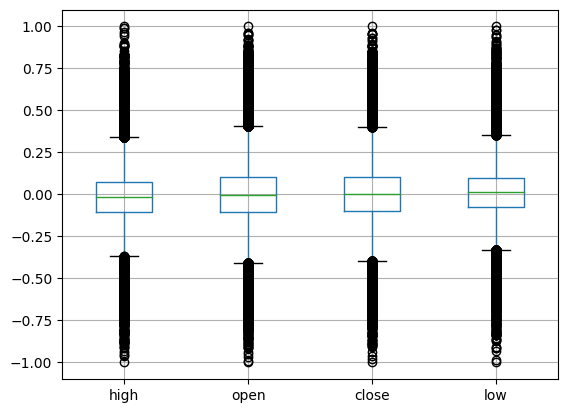

In [ ]:
# alpha=3
src_df.boxplot()

<Axes: >

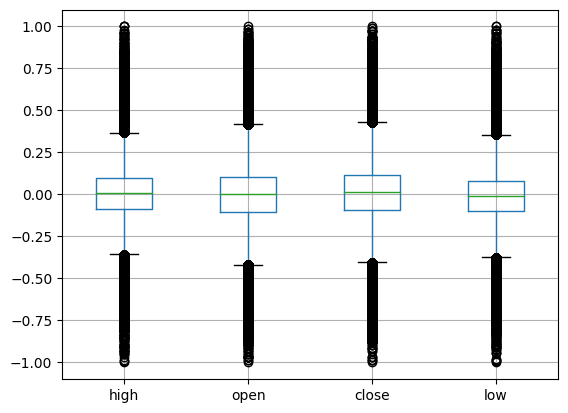

In [ ]:
# alpha=2
src_df.boxplot()

<Axes: >

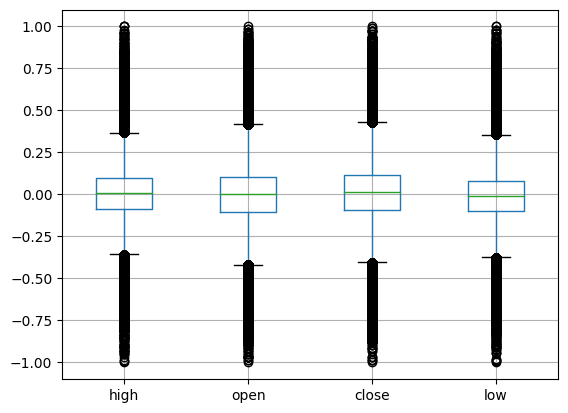

In [ ]:
# alpha=1
src_df.boxplot()

In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()

In [ ]:
src_df_lim = src_df.iloc[indices]

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

In [ ]:
src_df_lim.iloc[10:30]

,high,open,close,low
time,,,,
2014-07-17 12:00:00,-0.039728,-0.020284,-0.015106,0.051546
2014-07-18 04:30:00,-0.141884,0.123732,-0.127895,0.138144
2014-07-18 06:00:00,0.103292,0.054767,0.079557,0.045361
2014-07-18 19:00:00,-0.048808,-0.060852,-0.055388,-0.107216
2014-07-18 20:30:00,-0.014756,0.050710,-0.033233,0.006186
2014-07-21 07:30:00,0.026107,-0.024341,0.121853,0.041237
2014-07-22 11:00:00,-0.125993,0.146045,-0.075529,0.051546
2014-07-22 17:30:00,0.069240,0.115619,-0.005035,0.109278
2014-07-23 19:00:00,-0.041998,-0.018256,0.051360,0.032990


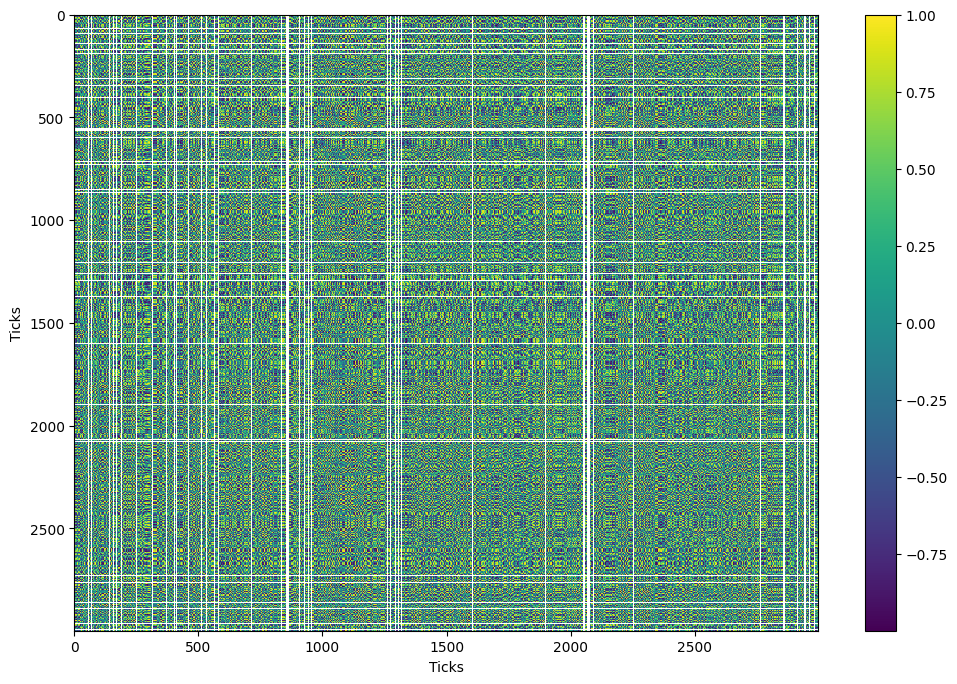

In [ ]:
import matplotlib.pyplot as plt

# alpha=3
plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

# Looks good, but long observation would have outliers

## Diff token with standalization

In [ ]:
diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
ohlc_pre_process = [diff_p]

standalization_p = fprocess.STDPreProcess(columns=ohlc_column, alpha=3)
processes = [*ohlc_pre_process, standalization_p]

In [ ]:
src_df = df[["open", "high", "low", "close"]].copy()

for process in processes:
  src_df = process(src_df)

array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

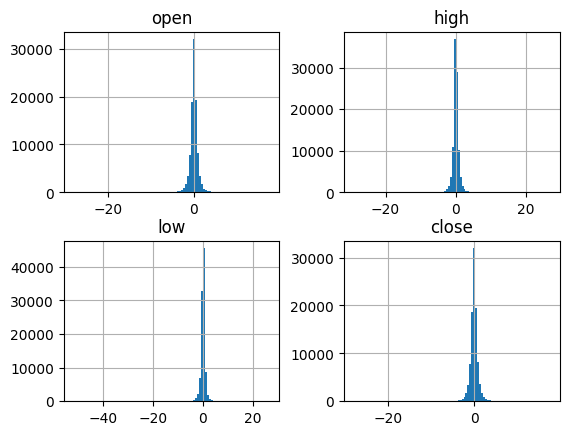

In [ ]:
# alpha=1
src_df.hist(bins=100)

array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

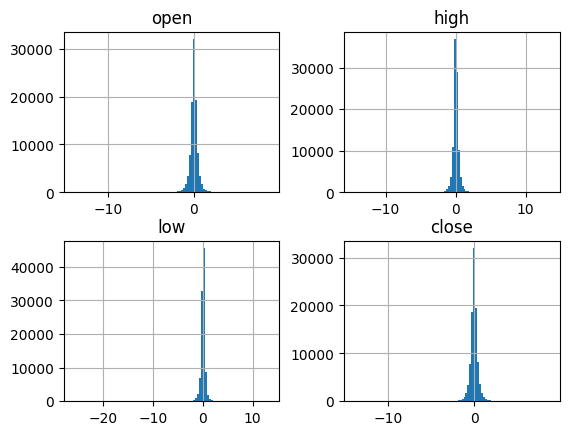

In [ ]:
# alpha=2
src_df.hist(bins=100)

In [ ]:
import random

indices = random.choices(range(1, len(src_df)), k=3000)
indices.sort()

src_df_lim = src_df.iloc[indices]
cos = nn.CosineSimilarity(dim=1)
similarities = []
input2 = torch.tensor(src_df_lim.values)

for index in range(1, len(src_df_lim)):
  input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
  output = cos(input1, input2)
  similarity = output.cpu().detach().numpy()
  similarities.append(similarity)

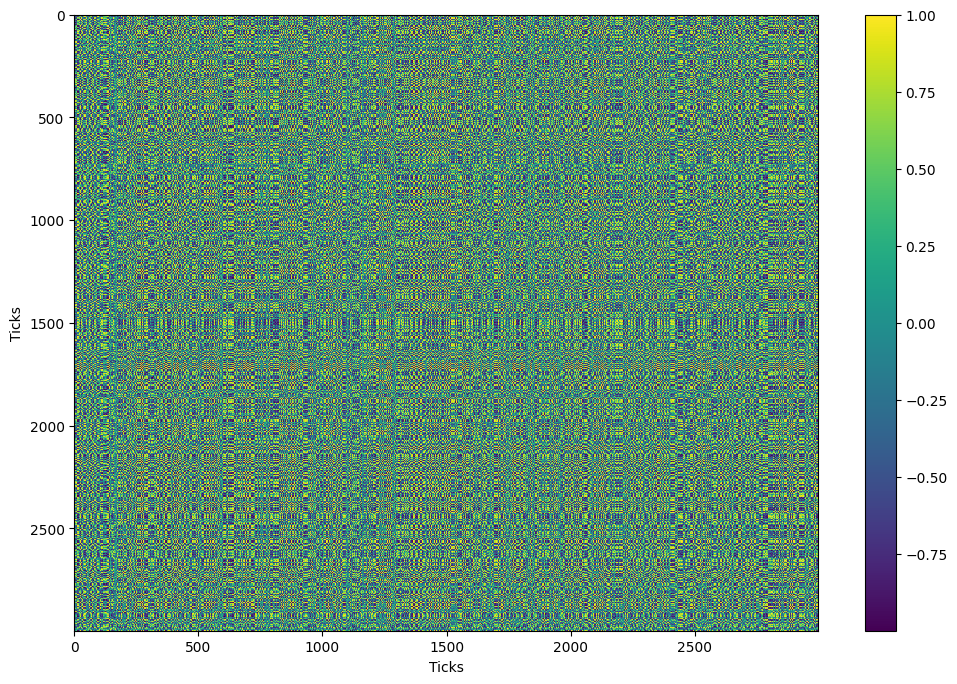

In [ ]:
import matplotlib.pyplot as plt


# alpha=3
plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

# Looks good, bud model would disturbed by outliers

## Token consists of tick data

In [4]:
import os
import pandas as pd

file_name = "OANDA_2021_tick.zip"

file_path = os.path.join(data_folder, file_name)
file_path = os.path.abspath(file_path)
df = pd.read_csv(file_path, parse_dates=True, index_col=0)
df.head()

,price,spread
2020-12-31 17:00:00.043,103.047,0.003
2020-12-31 17:00:00.166,103.047,0.003
2020-12-31 17:00:00.204,103.047,0.003
2020-12-31 17:00:00.231,103.047,0.003
2020-12-31 17:00:02.442,103.048,0.003


### Ticks token in a span

represents a token by aggregating values based on specific sampling time.

In [5]:
import datetime

def dropna_market_close(data_df: pd.DataFrame, delta_hour=10) -> pd.DataFrame:
    """
    drop NaN only if index is longer than delta_hour between non NaN values

    Args:
        data_df (pd.DataFrame): dataframe to drop
        delta_hour (int): threshold hour to drop

    Returns:
        pd.DataFrame: dropped data
    """
    if isinstance(data_df.index, pd.DatetimeIndex):
        nonnullindex = data_df.dropna().index
        long_delta_cond = (nonnullindex[1:] - nonnullindex[:-1]) >= datetime.timedelta(hours=delta_hour)
        market_close_start = nonnullindex[:-1][long_delta_cond]
        market_close_end = nonnullindex[1:][long_delta_cond]
        dfs = []

        index = 0
        from_index = data_df.index[0]
        to_index = market_close_start[0]

        while True:
            market_open_df = data_df.loc[from_index:to_index]
            dfs.append(market_open_df)
            index += 1
            if index >= len(market_close_start):
                break
            from_index = market_close_end[index - 1]
            to_index = market_close_start[index]
        from_index = market_close_end[index - 1]
        to_index = data_df.index[-1]
        market_open_df = data_df.loc[from_index:to_index]
        dfs.append(market_open_df)
        return pd.concat(dfs, axis=0)
    else:
        raise ValueError("Index support DatetimeIndex only.")

In [39]:
class TickDiffDataset:

  def __init__(self, df, target_frame_mins=1, tick_span="100ms", observation_length=60, prediction_length=10, split_ratio=0.8, is_train=True, device=None, batch_first=True):
    self.target_frame = f"{target_frame_mins}MIN"
    self.span_delta = datetime.timedelta(minutes=target_frame_mins)
    self.obs_delta = self.span_delta * (observation_length + prediction_length)
    # diff_df = dropna_market_close(df).diff()
    diff_df = df.diff()
    # resample data to know length
    indices = diff_df.resample(self.target_frame).first().index
    self.diff_df = diff_df
    data_length = int(len(indices) * split_ratio)
    self.training_indices = indices[:data_length]
    self.validation_indices = indices[data_length:]
    self.is_train = is_train
    if is_train:
      self.indices = self.training_indices
    else:
      self.indices = self.validation_indices
    self.device = device
    self.batch_first = batch_first
    self.observation_length = int(observation_length)
    self.prediction_length = int(prediction_length)
    self.tick_span = tick_span


  def __getitem__(self, ndx):
    batch_indices = self.indices[ndx]
    batch_data = []
    for index in batch_indices:
      end_tick_index = index + self.obs_delta
      tick_data = self.diff_df[(self.diff_df.index >= index) & (self.diff_df.index < end_tick_index)]
      tick_data = tick_data.resample(self.tick_span).sum()
      time_range = pd.date_range(index, end_tick_index, freq=self.tick_span)[:-1]
      token = pd.Series(0, index=time_range)
      token.loc[tick_data.index] = tick_data.values
      batch_data.append(token.values.tolist())
    batch_data = torch.tensor(batch_data, device=self.device)

    total_length = self.observation_length + self.prediction_length
    length_unit = batch_data.shape[1] // total_length
    src_length = length_unit * self.observation_length
    if self.batch_first:
        return batch_data[:, :src_length], batch_data[:, src_length:]
    else:
        batch_data = batch_data.transpose(0, 1)
        return batch_data[:src_length], batch_data[src_length:]

  def train(self):
    self.is_train = True
    self.indices = self.training_indices

  def eval(self):
    self.is_train = False
    self.indices = self.validation_indices

In [40]:
ds = TickDiffDataset(df["price"])

In [44]:
# too long to use it for training
src,  tgt = ds[0:16]

In [45]:
src.shape, tgt.shape

(torch.Size([16, 36000]), torch.Size([16, 6000]))

### Volume token in a span

In [188]:
span_mins = 30
target_column = "price"
span_delta = datetime.timedelta(minutes=span_mins)

rolled_df = df["price"].resample("30MIN").ohlc().dropna()
# drop first and last since it may not have much data
target_indices = rolled_df.index[1:-1]
last_price = df[target_column][df.index < target_indices[0]].iloc[-1]

In [195]:
max_count = 0
hist_series_array = []

# it takes time, so limite the execution
for current_date in tqdm(target_indices[:50]):
  next_date = current_date + span_delta
  span_ticks_df = df[target_column][(df.index >= current_date) & (df.index < next_date)]
  if len(span_ticks_df) > 0:
    span_diff_df = span_ticks_df - last_price
    value_counts = span_diff_df.value_counts()
    hist_series_array.append((last_price, value_counts))
    current_max_count = value_counts.max()
    if max_count < current_max_count:
      max_count = current_max_count

    last_price = span_ticks_df.iloc[-1]

100%|██████████| 50/50 [00:38<00:00,  1.30it/s]


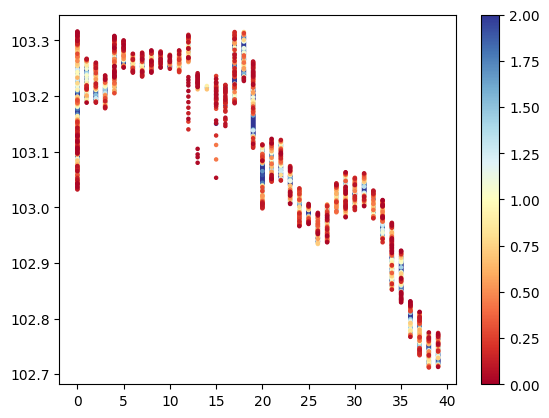

In [196]:
import matplotlib.pyplot as plt
from matplotlib import colormaps

cm = colormaps['RdYlBu']
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
count_baseline = 100
index = 0
max_count_array =  []

for base_price, value_counts in hist_series_array[:40]:
  temp_mean_value = value_counts.mean()
  # drop 1st item, then append new one to caliculate moving average
  max_count_array = max_count_array[-4:]
  max_count_array.append(temp_mean_value)
  mean_count_ma = np.mean(max_count_array)
  mappable = ax.scatter([index for _ in range(len(value_counts))], base_price + value_counts.index, c=value_counts/mean_count_ma, vmin=0, vmax=2, s=5, cmap=cm)
  index += 1
fig.colorbar(mappable, ax=ax)
fig.show()

In [197]:
tokens = []
token_df_base = pd.Series(0, index=np.arange(-1000, 1001))

for base_price, value_counts in hist_series_array[:32]:
  token_df = token_df_base.copy()
  temp_mean_value = value_counts.mean()
  # drop 1st item, then append new one to caliculate moving average
  max_count_array = max_count_array[-4:]
  max_count_array.append(temp_mean_value)
  mean_count_ma = np.mean(max_count_array)
  indices = (value_counts.index // 0.001).astype('int')
  token_df.loc[indices] += value_counts.values / mean_count_ma
  tokens.append(token_df)

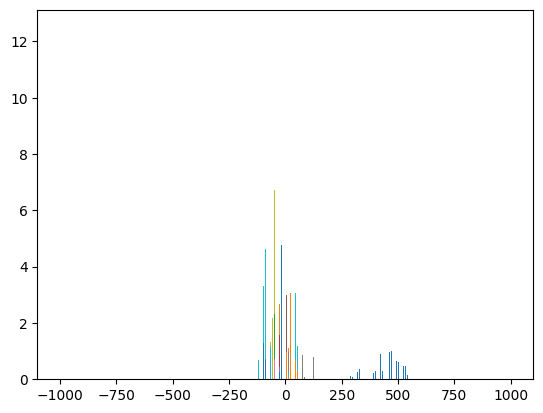

In [198]:
for token in tokens:
  plt.bar(token.index, token.values, 0.3, 0)

A token typically has zero in the same indices. Confirm if we can improve it by using mean value of it's span.

In [161]:
window = 8

stds = rolled_df.rolling(window).std(ddof=0).dropna()
mas = rolled_df.rolling(window).mean().dropna()

stds.head()

,open,high,low,close
2020-12-31 20:30:00,0.088396,0.073605,0.088177,0.073392
2020-12-31 21:00:00,0.073746,0.024793,0.064991,0.033067
2020-12-31 21:30:00,0.032938,0.020911,0.027547,0.034146
2020-12-31 22:00:00,0.033948,0.020651,0.027386,0.031405
2020-12-31 22:30:00,0.031089,0.019621,0.024657,0.023377


In [181]:
max_count = 0
hist_series_array = []
current_date = stds.index[0]
alpha = 3

for current_date in tqdm(stds.index[:100]):
  next_date = current_date + span_delta
  span_ticks_df = df["price"][(df.index >= current_date) & (df.index < next_date)]
  if len(span_ticks_df) > 0:
    mean_value = mas["close"].loc[current_date]
    std_value = stds["close"].loc[current_date]
    span_diff_df = (span_ticks_df - mean_value)/std_value
    span_diff_df = span_diff_df.round(3)

    value_counts = span_diff_df.clip(-alpha, alpha).value_counts()
    hist_series_array.append(value_counts)
    current_max_count = value_counts.max()
    if max_count < current_max_count:
      max_count = current_max_count

100%|██████████| 100/100 [01:29<00:00,  1.11it/s]


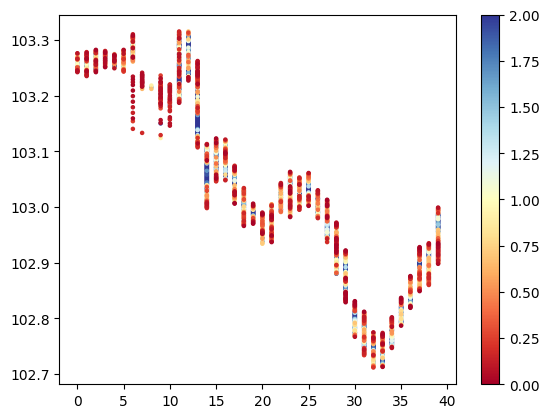

In [182]:
import matplotlib.pyplot as plt
from matplotlib import colormaps

cm = colormaps['RdYlBu']
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
count_baseline = 100
index = 0
max_count_array =  []

for index, value_counts in enumerate(hist_series_array[:40]):
  time_index = stds.index[index]
  mean_value = mas["close"].loc[time_index]
  std_value = stds["close"].loc[time_index]

  temp_mean_value = value_counts.mean()
  # drop 1st item, then append new one to caliculate moving average
  max_count_array = max_count_array[-4:]
  max_count_array.append(temp_mean_value)
  mean_count_ma = np.mean(max_count_array)
  mappable = ax.scatter([index for _ in range(len(value_counts))], (value_counts.index * std_value + mean_value ), c=value_counts/mean_count_ma, vmin=0, vmax=2, s=5, cmap=cm)
  index += 1
fig.colorbar(mappable, ax=ax)
fig.show()

In [183]:
alpha = 3

tokens = []
token_df_base = pd.Series(0, index=np.arange(-1000, 1001))

for value_counts in hist_series_array[:32]:
  token_df = token_df_base.copy()
  temp_mean_value = value_counts.mean()
  # drop 1st item, then append new one to caliculate moving average
  max_count_array = max_count_array[-4:]
  max_count_array.append(temp_mean_value)
  mean_count_ma = np.mean(max_count_array)
  indices = (value_counts.index // (0.001 * alpha)).astype('int')
  token_df.loc[indices] += value_counts.values / mean_count_ma
  tokens.append(token_df)

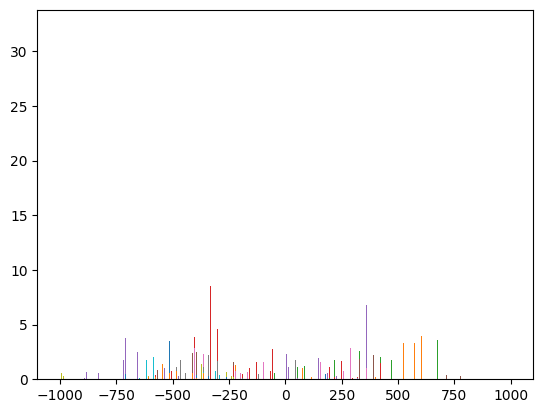

In [187]:
for token in tokens:
  plt.bar(token.index, token.values, 0.3, 0)

### Statistic token in a span

create alternate representation of a span like [mean, std]

## Token with Auto Encoder

In [ ]:
class AELinearModel(nn.Module):

  def __init__(self, input_dim, middle_layer_dim, device):
    super().__init__()
    self.layer_to = nn.Linear(input_dim, middle_layer_dim).to(device)
    self.layer_from = nn.Linear(middle_layer_dim, input_dim).to(device)
    self.activation = nn.Tanh()

  def forward(self, x):
    memory = self.activation(self.layer_to(x))
    out = self.layer_from(memory)
    return memory, out

### OHLC Observation

linear model compress feature_size (4) * observation_length to middle_layer_dim

In [ ]:
import random

class Dataset:

    def __init__(self, df, ohlc_columns, observation_length=60, device="cuda", seed=1017, is_training = True, batch_first=True, clip_range=None):
        self.seed(seed)
        self.columns = ohlc_columns
        self.ohlc_idf = self.__init_ohlc(df, ohlc_columns, clip_range=clip_range)

        self.observation_length = observation_length
        self.output_dim = observation_length * len(ohlc_columns)
        self.device = device
        self.is_training = is_training
        self.__init_indicies(self.ohlc_idf)
        self.batch_first = batch_first

    def __init_indicies(self, data, split_ratio=0.8):
        length = len(data) - self.observation_length
        if length < 0:
            raise Exception(f"date length {length} is less than observation_length {self.observation_length}")

        to_index = int(length * split_ratio)
        from_index = 1
        train_indices = list(range(from_index, to_index))
        self.train_indices = random.sample(train_indices, k=to_index - from_index)

        from_index = int(length * split_ratio) + self.observation_length
        to_index = length
        eval_indices = list(range(from_index, to_index))
        self.eval_indices = random.sample(eval_indices, k=to_index - from_index)

        if self.is_training:
            self._indices = self.train_indices
        else:
            self._indices = self.eval_indices

    def min_max(self, df: pd.DataFrame, scale=(-1, 1)):
        _min = min
        if min is None:
            _min = df.min()
        _max = max
        if max is None:
            _max = df.max()
        std = (df - _min) / (_max - _min)
        scaled = std * (scale[1] - scale[0]) + scale[0]
        return scaled

    def standalize(self, df, alpha=2):
        mean_values = df.mean()
        std_values = df.std()
        target_df = df - mean_values
        target_df = target_df / (std_values *alpha)
        return target_df

    def __init_ohlc(self, df, ohlc_columns, clip_range=None):
        ohlc_diff_df = df[ohlc_columns].diff().dropna()
        if clip_range is not None:
            ohlc_diff_df = ohlc_diff_df.clip(lower=clip_range[0], upper=clip_range[1])
        return self.standalize(ohlc_diff_df)

    def __len__(self):
        return len(self._indices)

    def __getitem__(self, ndx):
        ohlc_chunk_data = []

        for index in self._indices[ndx]:
            idx = slice(index, index + self.observation_length)
            ohlc_ids = self.ohlc_idf.iloc[idx].values.tolist()
            ohlc_chunk_data.append(ohlc_ids)

        ohlc_ids = torch.tensor(ohlc_chunk_data, device=self.device)
        batch_size, data_length, feature_size = ohlc_ids.shape
        ohlc_ids = ohlc_ids.view(batch_size, self.output_dim)
        if self.batch_first:
            return ohlc_ids
        else:
            return ohlc_ids.transpose(0, 1)

    def seed(self, seed=None):
        '''
        '''
        if seed is None:
            seed = 1192
        else:
            torch.backends.cudnn.benchmark = False
            torch.backends.cudnn.deterministic = True
        torch.manual_seed(seed)
        random.seed(seed)
        np.random.seed(seed)
        self.seed_value = seed

    def eval(self):
        self._indices = self.eval_indices
        self.is_training = False

    def train(self):
        self._indices = self.train_indices
        self.is_training = False

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
ds = Dataset(df, ["open", "high", "low", "close"], observation_length=60, device=device)

In [ ]:
d_model = 120
best_loss = None
model = AELinearModel(ds.output_dim, d_model, device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1.0, gamma = 0.9)

In [ ]:
def train(model, ds, optimizer, criterion, batch_size):

    model.train()
    ds.train()
    losses = 0

    length = 0.0
    end_index = len(ds)
    for index in tqdm(range(0, end_index - batch_size, batch_size)):
        length+=1.0
        src = ds[index:index+batch_size]
        _, out = model(src)

        optimizer.zero_grad()

        loss = criterion(src, out)
        loss.backward()

        optimizer.step()
        losses += loss.item()

    return losses / length

In [ ]:
def evaluate(model, ds, criterion, batch_size):

    model.eval()
    ds.eval()
    losses = 0

    length = 0.0
    end_index = len(ds)
    for index in range(0, end_index - batch_size, batch_size):
        length+=1.0
        src = ds[index:index+batch_size]
        _, out = model(src)

        optimizer.zero_grad()

        loss = criterion(src, out)
        loss.backward()

        optimizer.step()
        losses += loss.item()

    return losses / length

In [ ]:
model_path = f"{data_folder}/ae_ohlc_30min_v2.torch"
if os.path.exists(model_path):
  check_point = torch.load(model_path, map_location=torch.device("cpu"))
  model.load_state_dict(check_point)

In [ ]:
epoch = 3000
model.train()
ds.train()
if best_loss is None:
  best_loss = float('Inf')
patience = 3
counter = 0
batch_size = 64

for loop in range(1, epoch + 1):

    start_time = time.time()

    loss_train = train(
        model=model, ds=ds, optimizer=optimizer, criterion=criterion, batch_size=batch_size
    )

    loss_valid = evaluate(
        model=model, ds=ds, criterion=criterion,batch_size=batch_size
    )
    elapsed_time = time.time() - start_time

    print(f'{loop}/{epoch} train loss: {loss_train}, valid loss: {loss_valid}, {str(int(math.floor(elapsed_time / 60))) + "m" if math.floor(elapsed_time / 60) > 0 else ""}{elapsed_time % 60}s count: {counter}, \
        {"**" if best_loss > loss_valid else ""}')

    if best_loss > loss_valid:
        best_loss = loss_valid
        best_model = model
        counter = 0
    else:
        counter += 1
        scheduler.step()

    if counter > patience:
        break

100%|██████████| 1258/1258 [00:24<00:00, 50.97it/s]


1/3000 train loss: 0.01166151586730501, valid loss: 0.007666846560225034, 29.533366203308105s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.72it/s]


2/3000 train loss: 0.011661499119785708, valid loss: 0.007666836088053144, 25.759015798568726s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.81it/s]


3/3000 train loss: 0.011661482302306164, valid loss: 0.007666825818213316, 25.228463411331177s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.55it/s]


4/3000 train loss: 0.011661465802053744, valid loss: 0.007666815643588575, 26.58525586128235s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.32it/s]


5/3000 train loss: 0.011661449212962924, valid loss: 0.0076668055180591135, 26.58048915863037s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 66.74it/s]


6/3000 train loss: 0.011661432905563868, valid loss: 0.007666795579984355, 24.189815998077393s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.15it/s]


7/3000 train loss: 0.011661416622965532, valid loss: 0.007666785659762427, 24.39804172515869s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.18it/s]


8/3000 train loss: 0.01166140052766816, valid loss: 0.007666775738052762, 26.062772274017334s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.79it/s]


9/3000 train loss: 0.011661384498999589, valid loss: 0.007666765929411013, 26.549484729766846s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.30it/s]


10/3000 train loss: 0.01166136870797374, valid loss: 0.007666756198131524, 25.875420570373535s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.26it/s]


11/3000 train loss: 0.011661353011708855, valid loss: 0.0076667465338001424, 25.3174045085907s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.26it/s]


12/3000 train loss: 0.011661337303228688, valid loss: 0.00766673687690744, 25.286973237991333s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.93it/s]


13/3000 train loss: 0.011661321913086126, valid loss: 0.0076667274952458495, 26.045400619506836s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.35it/s]


14/3000 train loss: 0.011661306457055085, valid loss: 0.007666718137388031, 26.801631927490234s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.06it/s]


15/3000 train loss: 0.011661291177590365, valid loss: 0.0076667088435028495, 25.710249423980713s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 66.28it/s]


16/3000 train loss: 0.011661275966975406, valid loss: 0.007666699560031819, 24.71663475036621s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.45it/s]


17/3000 train loss: 0.011661260872960849, valid loss: 0.00766669035243531, 24.862279176712036s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.51it/s]


18/3000 train loss: 0.011661245984755255, valid loss: 0.007666681202860496, 23.323369026184082s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 59.95it/s]


19/3000 train loss: 0.011661231125792301, valid loss: 0.007666672127672468, 25.171757698059082s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.55it/s]


20/3000 train loss: 0.01166121638120879, valid loss: 0.007666663037607083, 25.81870412826538s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.14it/s]


21/3000 train loss: 0.011661201775065121, valid loss: 0.007666654169214324, 25.336477756500244s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.12it/s]


22/3000 train loss: 0.011661187315504815, valid loss: 0.0076666453647942015, 25.04540729522705s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.60it/s]


23/3000 train loss: 0.011661172874452508, valid loss: 0.007666636602030681, 24.97713565826416s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.49it/s]


24/3000 train loss: 0.011661158644391404, valid loss: 0.007666627977626583, 25.557268619537354s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.96it/s]


25/3000 train loss: 0.011661144419882702, valid loss: 0.007666619284786641, 25.176830053329468s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.49it/s]


26/3000 train loss: 0.011661130468552083, valid loss: 0.007666610737744802, 24.71767544746399s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.77it/s]


27/3000 train loss: 0.011661116466509542, valid loss: 0.007666602221945414, 24.348541021347046s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.57it/s]


28/3000 train loss: 0.011661102565520684, valid loss: 0.0076665938117752635, 25.66004776954651s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.86it/s]


29/3000 train loss: 0.011661088845540069, valid loss: 0.007666585400117377, 25.661490440368652s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.09it/s]


30/3000 train loss: 0.011661075229204256, valid loss: 0.007666577050944392, 24.668312072753906s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.58it/s]


31/3000 train loss: 0.011661061587697561, valid loss: 0.007666568924931768, 25.684937715530396s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.10it/s]


32/3000 train loss: 0.011661048039101028, valid loss: 0.0076665606144399115, 25.02028465270996s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 66.51it/s]


33/3000 train loss: 0.011661034598961378, valid loss: 0.007666552509255588, 24.29680824279785s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.98it/s]


34/3000 train loss: 0.011661021456800532, valid loss: 0.007666544456142016, 24.05040740966797s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.64it/s]


35/3000 train loss: 0.011661008317230805, valid loss: 0.0076665364074916505, 24.452499628067017s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.58it/s]


36/3000 train loss: 0.011660995237627, valid loss: 0.007666528498688445, 23.974897623062134s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.69it/s]


37/3000 train loss: 0.011660982110642714, valid loss: 0.007666520717830513, 24.761658668518066s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 62.98it/s]


38/3000 train loss: 0.011660969289410593, valid loss: 0.007666512941435789, 25.393094301223755s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.59it/s]


39/3000 train loss: 0.01166095633418055, valid loss: 0.00766650525728068, 25.691423654556274s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.40it/s]


40/3000 train loss: 0.011660943741707312, valid loss: 0.007666497547834064, 25.52884340286255s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.38it/s]


41/3000 train loss: 0.011660931179587195, valid loss: 0.007666489976746872, 24.00292706489563s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.54it/s]


42/3000 train loss: 0.011660918503827956, valid loss: 0.007666482303005914, 24.579519271850586s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.44it/s]


43/3000 train loss: 0.011660906078296882, valid loss: 0.007666474822670602, 25.53662610054016s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.34it/s]


44/3000 train loss: 0.011660893749377567, valid loss: 0.007666467312580576, 24.452423572540283s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.16it/s]


45/3000 train loss: 0.011660881586660097, valid loss: 0.007666459917046201, 25.535852670669556s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 67.50it/s]


46/3000 train loss: 0.011660869394699985, valid loss: 0.007666452531925977, 24.2537202835083s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 66.20it/s]


47/3000 train loss: 0.011660857345991796, valid loss: 0.007666445249459519, 23.877863883972168s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 66.14it/s]


48/3000 train loss: 0.01166084546015401, valid loss: 0.0076664380339411696, 23.07545781135559s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.41it/s]


49/3000 train loss: 0.011660833324828378, valid loss: 0.007666430931490736, 24.56050419807434s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.02it/s]


50/3000 train loss: 0.011660821633694756, valid loss: 0.007666423900451618, 24.741450309753418s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.74it/s]


51/3000 train loss: 0.011660809909987052, valid loss: 0.00766641673700402, 24.490095853805542s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.44it/s]


52/3000 train loss: 0.011660798131495667, valid loss: 0.007666409644967736, 25.526751279830933s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 66.26it/s]


53/3000 train loss: 0.011660786686148287, valid loss: 0.007666402683852199, 23.74471402168274s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.62it/s]


54/3000 train loss: 0.011660775169360026, valid loss: 0.007666395795635712, 24.11250114440918s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.30it/s]


55/3000 train loss: 0.011660763734377126, valid loss: 0.007666389032389028, 23.71589469909668s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.47it/s]


56/3000 train loss: 0.011660752364912548, valid loss: 0.007666382228973479, 24.690672874450684s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 64.57it/s]


57/3000 train loss: 0.011660741163130452, valid loss: 0.007666375473165474, 24.80720543861389s count: 0,         **


100%|██████████| 1258/1258 [00:18<00:00, 67.56it/s]


58/3000 train loss: 0.011660729983928118, valid loss: 0.007666368735210298, 23.413942337036133s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.80it/s]


59/3000 train loss: 0.011660719024970985, valid loss: 0.0076663620746173795, 23.899643182754517s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.36it/s]


60/3000 train loss: 0.01166070787130969, valid loss: 0.007666355428901819, 24.38969373703003s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.44it/s]


61/3000 train loss: 0.01166069701969896, valid loss: 0.0076663487742598445, 25.62102460861206s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.87it/s]


62/3000 train loss: 0.011660686045195108, valid loss: 0.007666342442456526, 24.485626220703125s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.05it/s]


63/3000 train loss: 0.011660675307223499, valid loss: 0.007666335884517374, 25.22216796875s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.24it/s]


64/3000 train loss: 0.011660664692515173, valid loss: 0.007666329575030092, 24.751930713653564s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.53it/s]


65/3000 train loss: 0.011660654108530127, valid loss: 0.007666323292322052, 23.675193071365356s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.46it/s]


66/3000 train loss: 0.011660643420900278, valid loss: 0.007666316976883827, 24.61062002182007s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.58it/s]


67/3000 train loss: 0.011660633001636436, valid loss: 0.007666310575156928, 24.785420417785645s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.93it/s]


68/3000 train loss: 0.011660622607543473, valid loss: 0.00766630437576209, 26.501394271850586s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.75it/s]


69/3000 train loss: 0.011660612206047308, valid loss: 0.00766629828199649, 25.86980938911438s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.23it/s]


70/3000 train loss: 0.011660601930775708, valid loss: 0.007666292029043165, 25.88806676864624s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.68it/s]


71/3000 train loss: 0.011660591731386907, valid loss: 0.007666285956105866, 25.502253770828247s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.43it/s]


72/3000 train loss: 0.01166058165155979, valid loss: 0.007666279936727053, 25.27822494506836s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.89it/s]


73/3000 train loss: 0.011660571631698593, valid loss: 0.007666273964955784, 25.409467220306396s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.58it/s]


74/3000 train loss: 0.011660561570749635, valid loss: 0.007666267969380743, 24.17781925201416s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.34it/s]


75/3000 train loss: 0.011660551815552842, valid loss: 0.007666262098775504, 24.70447015762329s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.11it/s]


76/3000 train loss: 0.011660541939313726, valid loss: 0.007666256305532524, 25.100836515426636s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.51it/s]


77/3000 train loss: 0.011660532274065815, valid loss: 0.007666250485510301, 25.911028623580933s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.55it/s]


78/3000 train loss: 0.011660522480002222, valid loss: 0.007666244793433351, 26.160815000534058s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.58it/s]


79/3000 train loss: 0.011660512741092468, valid loss: 0.007666239021018671, 26.01289439201355s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.15it/s]


80/3000 train loss: 0.011660503387149121, valid loss: 0.007666233436058695, 25.10712695121765s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.55it/s]


81/3000 train loss: 0.01166049376113817, valid loss: 0.007666227812417589, 25.259610414505005s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.01it/s]


82/3000 train loss: 0.011660484342046662, valid loss: 0.007666222164972712, 26.122525453567505s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.17it/s]


83/3000 train loss: 0.011660475025859636, valid loss: 0.007666216556208964, 25.808955907821655s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.19it/s]


84/3000 train loss: 0.011660465610469729, valid loss: 0.0076662111006819975, 26.109729528427124s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.41it/s]


85/3000 train loss: 0.011660456417916144, valid loss: 0.007666205636228616, 25.72422695159912s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.61it/s]


86/3000 train loss: 0.01166044725534552, valid loss: 0.007666200109290334, 24.731371641159058s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.97it/s]


87/3000 train loss: 0.011660438250463059, valid loss: 0.007666194693932232, 24.74930429458618s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.38it/s]


88/3000 train loss: 0.011660429310358598, valid loss: 0.007666189333620353, 25.75665545463562s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.10it/s]


89/3000 train loss: 0.011660420199610376, valid loss: 0.007666184034305639, 25.08201766014099s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.80it/s]


90/3000 train loss: 0.011660411217677835, valid loss: 0.007666178834669221, 25.456069231033325s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.04it/s]


91/3000 train loss: 0.011660402425267218, valid loss: 0.007666173523452621, 25.77457308769226s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.93it/s]


92/3000 train loss: 0.011660393729838521, valid loss: 0.007666168365472802, 26.20140242576599s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.23it/s]


93/3000 train loss: 0.011660384929654542, valid loss: 0.007666163292293922, 25.68354344367981s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.90it/s]


94/3000 train loss: 0.011660376309368328, valid loss: 0.007666158101583918, 25.629136323928833s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.61it/s]


95/3000 train loss: 0.011660367516587548, valid loss: 0.007666153147423896, 26.114371299743652s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.74it/s]


96/3000 train loss: 0.011660359038442775, valid loss: 0.00766614805490445, 25.635969638824463s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.67it/s]


97/3000 train loss: 0.011660350631738883, valid loss: 0.007666143192984045, 25.097336053848267s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.55it/s]


98/3000 train loss: 0.011660342282409792, valid loss: 0.00766613820163063, 23.98333477973938s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.15it/s]


99/3000 train loss: 0.01166033380130374, valid loss: 0.007666133323345131, 25.374935388565063s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.50it/s]


100/3000 train loss: 0.01166032547011249, valid loss: 0.007666128500105855, 26.426178216934204s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.87it/s]


101/3000 train loss: 0.011660317340288282, valid loss: 0.007666123542970362, 26.300055742263794s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.98it/s]


102/3000 train loss: 0.011660309095344313, valid loss: 0.007666118747998065, 25.788836002349854s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.28it/s]


103/3000 train loss: 0.011660300978105545, valid loss: 0.007666114063118213, 25.49320101737976s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.48it/s]


104/3000 train loss: 0.011660292887888458, valid loss: 0.007666109400554397, 25.472230195999146s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.97it/s]


105/3000 train loss: 0.01166028479915201, valid loss: 0.007666104605582099, 25.140393495559692s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 65.26it/s]


106/3000 train loss: 0.011660276896606047, valid loss: 0.007666099843339989, 23.953426599502563s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.29it/s]


107/3000 train loss: 0.011660268915216002, valid loss: 0.00766609519565353, 24.313283443450928s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.48it/s]


108/3000 train loss: 0.011660261024144998, valid loss: 0.007666090643182159, 25.189685106277466s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.53it/s]


109/3000 train loss: 0.011660253279657357, valid loss: 0.0076660860743456944, 25.583128452301025s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.39it/s]


110/3000 train loss: 0.011660245433375713, valid loss: 0.0076660814817054584, 25.523858547210693s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.75it/s]


111/3000 train loss: 0.011660237793643353, valid loss: 0.00766607700510861, 26.27383303642273s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.96it/s]


112/3000 train loss: 0.011660230167236753, valid loss: 0.007666072565705156, 26.031914710998535s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.52it/s]


113/3000 train loss: 0.011660222586359835, valid loss: 0.0076660681813479235, 25.25184941291809s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 63.07it/s]


114/3000 train loss: 0.011660214878147874, valid loss: 0.00766606370623881, 25.671124696731567s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.03it/s]


115/3000 train loss: 0.011660207493455758, valid loss: 0.007666059417096666, 26.09184241294861s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.46it/s]


116/3000 train loss: 0.011660200023997001, valid loss: 0.007666055211267723, 27.314191818237305s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.56it/s]


117/3000 train loss: 0.011660192564902723, valid loss: 0.007666050858152941, 26.77348017692566s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.65it/s]


118/3000 train loss: 0.011660185253502289, valid loss: 0.007666046606204189, 26.32372283935547s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.33it/s]


119/3000 train loss: 0.011660178024647536, valid loss: 0.007666042419715811, 26.07091212272644s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.23it/s]


120/3000 train loss: 0.011660170811709662, valid loss: 0.00766603823769064, 26.37409806251526s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.95it/s]


121/3000 train loss: 0.011660163485872987, valid loss: 0.007666034094346598, 27.072391033172607s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.21it/s]


122/3000 train loss: 0.011660156329939756, valid loss: 0.007666029976294063, 27.681777954101562s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.80it/s]


123/3000 train loss: 0.011660149232861964, valid loss: 0.0076660258061707785, 26.893916845321655s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.72it/s]


124/3000 train loss: 0.011660142183164654, valid loss: 0.007666021850281439, 27.607739686965942s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.03it/s]


125/3000 train loss: 0.011660135113848861, valid loss: 0.007666017781324185, 28.161038398742676s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.03it/s]


126/3000 train loss: 0.011660128111161872, valid loss: 0.00766601380311881, 26.79588007926941s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.29it/s]


127/3000 train loss: 0.011660121213230163, valid loss: 0.007666009814499285, 26.789565801620483s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.91it/s]


128/3000 train loss: 0.011660114362308776, valid loss: 0.007666005913656169, 27.196491956710815s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.03it/s]


129/3000 train loss: 0.011660107487326989, valid loss: 0.007666001883380044, 26.665271520614624s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.97it/s]


130/3000 train loss: 0.011660100768922883, valid loss: 0.007665997955757684, 26.915642261505127s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.49it/s]


131/3000 train loss: 0.011660094030530137, valid loss: 0.007665993990941931, 27.30278444290161s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.39it/s]


132/3000 train loss: 0.011660087332854991, valid loss: 0.007665990104976173, 27.904765605926514s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.71it/s]


133/3000 train loss: 0.011660080719576329, valid loss: 0.0076659862963726726, 26.177637100219727s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.93it/s]


134/3000 train loss: 0.011660074168114385, valid loss: 0.007665982514548416, 28.14399766921997s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.11it/s]


135/3000 train loss: 0.011660067474511, valid loss: 0.007665978805623211, 26.288551807403564s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.55it/s]


136/3000 train loss: 0.011660061052975219, valid loss: 0.007665974997019711, 26.978416442871094s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 52.84it/s]


137/3000 train loss: 0.011660054484856077, valid loss: 0.007665971401162422, 28.48021626472473s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.01it/s]


138/3000 train loss: 0.011660048071463817, valid loss: 0.0076659677562098535, 26.667785167694092s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.07it/s]


139/3000 train loss: 0.011660041719518116, valid loss: 0.007665964016042198, 26.92597723007202s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.49it/s]


140/3000 train loss: 0.011660035337219297, valid loss: 0.007665960436550001, 26.25352454185486s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.91it/s]


141/3000 train loss: 0.011660029078924078, valid loss: 0.007665956825815355, 26.931976079940796s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.31it/s]


142/3000 train loss: 0.01166002286134646, valid loss: 0.007665953232933538, 27.208648920059204s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.70it/s]


143/3000 train loss: 0.011660016615266522, valid loss: 0.007665949809653595, 27.271681785583496s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.04it/s]


144/3000 train loss: 0.011660010428042026, valid loss: 0.0076659464562972325, 27.55302119255066s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.13it/s]


145/3000 train loss: 0.011660004170857287, valid loss: 0.007665943030041818, 27.604630708694458s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.70it/s]


146/3000 train loss: 0.01165999804544951, valid loss: 0.0076659395665930104, 27.85281777381897s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.53it/s]


147/3000 train loss: 0.011659992135845018, valid loss: 0.007665936076364959, 28.68644642829895s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.82it/s]


148/3000 train loss: 0.011659986020801722, valid loss: 0.00766593259208785, 26.49239993095398s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.02it/s]


149/3000 train loss: 0.01165998009231907, valid loss: 0.007665929161369229, 28.336241006851196s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.72it/s]


150/3000 train loss: 0.011659974163096096, valid loss: 0.007665925749991172, 27.807166576385498s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.45it/s]


151/3000 train loss: 0.011659968292728563, valid loss: 0.007665922485898954, 26.68877387046814s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.03it/s]


152/3000 train loss: 0.011659962444940792, valid loss: 0.007665919248585979, 26.068885803222656s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.54it/s]


153/3000 train loss: 0.01165995657087166, valid loss: 0.0076659159205211234, 27.169220447540283s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.17it/s]


154/3000 train loss: 0.01165995084412621, valid loss: 0.007665912677257206, 27.147903203964233s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.31it/s]


155/3000 train loss: 0.01165994501854804, valid loss: 0.007665909472674417, 26.079771757125854s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.62it/s]


156/3000 train loss: 0.011659939272924429, valid loss: 0.007665906265116157, 27.260831832885742s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.17it/s]


157/3000 train loss: 0.0116599336413101, valid loss: 0.00766590297275696, 27.600217819213867s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.40it/s]


158/3000 train loss: 0.011659928010065932, valid loss: 0.0076658998812420874, 26.273581743240356s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.01it/s]


159/3000 train loss: 0.011659922452483604, valid loss: 0.007665896715340428, 27.673144817352295s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.81it/s]


160/3000 train loss: 0.011659917010021038, valid loss: 0.00766589375177083, 26.442405462265015s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.98it/s]


161/3000 train loss: 0.011659911390251831, valid loss: 0.00766589061711162, 27.491522312164307s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.41it/s]


162/3000 train loss: 0.011659905811200223, valid loss: 0.007665887698174095, 26.61959743499756s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.91it/s]


163/3000 train loss: 0.011659900395019018, valid loss: 0.007665884669144123, 26.431037187576294s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.82it/s]


164/3000 train loss: 0.011659894902584853, valid loss: 0.007665881586555665, 25.75942587852478s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.23it/s]


165/3000 train loss: 0.011659889518977729, valid loss: 0.0076658785396728655, 27.666947603225708s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.89it/s]


166/3000 train loss: 0.011659884105387644, valid loss: 0.007665875657928732, 27.20995545387268s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.48it/s]


167/3000 train loss: 0.011659878933512042, valid loss: 0.007665872683944984, 28.024847507476807s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.66it/s]


168/3000 train loss: 0.011659873594694278, valid loss: 0.007665869800713115, 26.369555473327637s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.16it/s]


169/3000 train loss: 0.011659868379880116, valid loss: 0.00766586674192843, 26.036755561828613s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.34it/s]


170/3000 train loss: 0.011659863032178513, valid loss: 0.007665863875061654, 27.066723823547363s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.25it/s]


171/3000 train loss: 0.01165985781292243, valid loss: 0.0076658610528269515, 27.577711582183838s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.19it/s]


172/3000 train loss: 0.01165985278800035, valid loss: 0.007665858182984705, 27.234668254852295s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.54it/s]


173/3000 train loss: 0.01165984755097659, valid loss: 0.007665855369676416, 26.824214696884155s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.74it/s]


174/3000 train loss: 0.011659842600086512, valid loss: 0.0076658526218285, 26.473940134048462s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.52it/s]


175/3000 train loss: 0.011659837573313632, valid loss: 0.007665849902247564, 26.83754324913025s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.86it/s]


176/3000 train loss: 0.011659832488795792, valid loss: 0.007665847166301534, 26.88729476928711s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.03it/s]


177/3000 train loss: 0.011659827588617637, valid loss: 0.007665844370846074, 26.996216297149658s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.67it/s]


178/3000 train loss: 0.011659822561844757, valid loss: 0.007665841664654759, 27.140532970428467s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.97it/s]


179/3000 train loss: 0.01165981771496964, valid loss: 0.007665838958463444, 27.234489917755127s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.62it/s]


180/3000 train loss: 0.011659812799244764, valid loss: 0.007665836256735337, 26.064196348190308s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.17it/s]


181/3000 train loss: 0.011659807999379969, valid loss: 0.007665833660636466, 27.120872735977173s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.47it/s]


182/3000 train loss: 0.011659803209139332, valid loss: 0.007665830987175337, 26.599164485931396s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.95it/s]


183/3000 train loss: 0.011659798357452136, valid loss: 0.007665828312226473, 27.30815052986145s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 62.95it/s]


184/3000 train loss: 0.011659793538709181, valid loss: 0.007665825684885152, 25.392980098724365s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.18it/s]


185/3000 train loss: 0.01165978898870239, valid loss: 0.00766582308581081, 26.631914615631104s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.64it/s]


186/3000 train loss: 0.011659784204754475, valid loss: 0.007665820504589298, 27.024834632873535s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.86it/s]


187/3000 train loss: 0.011659779484474081, valid loss: 0.007665818020070609, 26.592655181884766s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.44it/s]


188/3000 train loss: 0.01165977504070321, valid loss: 0.007665815484968904, 26.546742916107178s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.09it/s]


189/3000 train loss: 0.011659770339300978, valid loss: 0.007665812994499271, 26.326778650283813s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.57it/s]


190/3000 train loss: 0.011659765768565226, valid loss: 0.0076658105873428405, 26.956279039382935s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.21it/s]


191/3000 train loss: 0.011659761262237315, valid loss: 0.00766580812067698, 27.426698446273804s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.44it/s]


192/3000 train loss: 0.011659756607475242, valid loss: 0.007665805536479995, 25.877094984054565s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.86it/s]


193/3000 train loss: 0.011659752271791094, valid loss: 0.007665803127835829, 26.384077787399292s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.51it/s]


194/3000 train loss: 0.011659747642570061, valid loss: 0.007665800737044491, 26.878821849822998s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.85it/s]


195/3000 train loss: 0.011659743258024793, valid loss: 0.007665798453370127, 26.303346872329712s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.34it/s]


196/3000 train loss: 0.011659738817215203, valid loss: 0.00766579608340709, 27.452196836471558s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.25it/s]


197/3000 train loss: 0.011659734502260015, valid loss: 0.00766579367922613, 26.069185733795166s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.02it/s]


198/3000 train loss: 0.011659730187674987, valid loss: 0.007665791336042336, 27.057621002197266s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.15it/s]


199/3000 train loss: 0.011659725852360999, valid loss: 0.007665788943763263, 27.201348304748535s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.94it/s]


200/3000 train loss: 0.011659721563317012, valid loss: 0.007665786737451157, 27.431833028793335s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.24it/s]


201/3000 train loss: 0.011659717190987023, valid loss: 0.007665784355586234, 26.71914839744568s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.72it/s]


202/3000 train loss: 0.011659713052598159, valid loss: 0.0076657822370505375, 27.22735571861267s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.21it/s]


203/3000 train loss: 0.011659708854613532, valid loss: 0.007665779966765794, 26.472437858581543s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.43it/s]


204/3000 train loss: 0.011659704609248426, valid loss: 0.007665777729211239, 28.07425355911255s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.60it/s]


205/3000 train loss: 0.01165970047900308, valid loss: 0.0076657756002613915, 27.49455189704895s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.96it/s]


206/3000 train loss: 0.011659696342465015, valid loss: 0.00766577348321343, 27.167622089385986s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.74it/s]


207/3000 train loss: 0.01165969215114327, valid loss: 0.007665771248634345, 27.08800721168518s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.73it/s]


208/3000 train loss: 0.011659688205607768, valid loss: 0.0076657690482731826, 27.493714570999146s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.01it/s]


209/3000 train loss: 0.011659684210840985, valid loss: 0.007665766846424284, 27.600831985473633s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.39it/s]


210/3000 train loss: 0.01165968002470148, valid loss: 0.007665764748716887, 26.74926996231079s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.56it/s]


211/3000 train loss: 0.011659676107668299, valid loss: 0.007665762686715149, 27.811283349990845s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.82it/s]


212/3000 train loss: 0.011659672108459597, valid loss: 0.007665760532473794, 28.49307942390442s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.25it/s]


213/3000 train loss: 0.011659668231773855, valid loss: 0.007665758410962626, 27.04151678085327s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.29it/s]


214/3000 train loss: 0.011659664184074192, valid loss: 0.007665756319206172, 27.028193712234497s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.21it/s]


215/3000 train loss: 0.011659660325896451, valid loss: 0.007665754257204433, 26.246482610702515s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.57it/s]


216/3000 train loss: 0.011659656536938632, valid loss: 0.0076657521580093015, 27.03351616859436s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.90it/s]


217/3000 train loss: 0.011659652518851768, valid loss: 0.007665750189734914, 26.171984434127808s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.27it/s]


218/3000 train loss: 0.011659648665115948, valid loss: 0.00766574819616902, 26.414353847503662s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.79it/s]


219/3000 train loss: 0.01165964502348181, valid loss: 0.007665746177311618, 26.8429753780365s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.46it/s]


220/3000 train loss: 0.011659641089051109, valid loss: 0.007665744284911753, 27.48742961883545s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.72it/s]


221/3000 train loss: 0.01165963732600449, valid loss: 0.007665742289858123, 27.127050399780273s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.76it/s]


222/3000 train loss: 0.011659633646984193, valid loss: 0.007665740329022415, 25.631803512573242s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.90it/s]


223/3000 train loss: 0.011659629919472933, valid loss: 0.007665738408355572, 26.93853259086609s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.21it/s]


224/3000 train loss: 0.011659626271546077, valid loss: 0.007665736524882122, 25.8806734085083s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.06it/s]


225/3000 train loss: 0.011659622614735379, valid loss: 0.007665734599752072, 26.944175720214844s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.54it/s]


226/3000 train loss: 0.011659619050834843, valid loss: 0.007665732629989949, 27.666422605514526s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.58it/s]


227/3000 train loss: 0.011659615409570867, valid loss: 0.007665730819415551, 27.01435351371765s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.48it/s]


228/3000 train loss: 0.011659611769417369, valid loss: 0.007665729063887375, 26.680546760559082s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.10it/s]


229/3000 train loss: 0.011659608088546271, valid loss: 0.007665727198266754, 26.72503089904785s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.67it/s]


230/3000 train loss: 0.011659604481707175, valid loss: 0.007665725405545185, 26.89953923225403s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.85it/s]


231/3000 train loss: 0.011659601071423041, valid loss: 0.007665723667869839, 26.511106491088867s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.13it/s]


232/3000 train loss: 0.011659597628564828, valid loss: 0.00766572185729544, 26.58884024620056s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.90it/s]


233/3000 train loss: 0.011659593859225489, valid loss: 0.0076657201062304715, 25.696457624435425s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.10it/s]


234/3000 train loss: 0.01165959073063312, valid loss: 0.007665718371530596, 26.489590644836426s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.62it/s]


235/3000 train loss: 0.011659587189682503, valid loss: 0.007665716516324125, 27.18842649459839s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.77it/s]


236/3000 train loss: 0.01165958377643709, valid loss: 0.007665714863449716, 26.669443368911743s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.48it/s]


237/3000 train loss: 0.011659580352827196, valid loss: 0.007665713218013985, 26.525696754455566s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.26it/s]


238/3000 train loss: 0.011659577047298345, valid loss: 0.007665711544311275, 27.02314305305481s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.83it/s]


239/3000 train loss: 0.011659573649599651, valid loss: 0.007665709767954799, 25.92368984222412s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.91it/s]


240/3000 train loss: 0.011659570332965998, valid loss: 0.007665707969282286, 26.131864070892334s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.55it/s]


241/3000 train loss: 0.011659567032619387, valid loss: 0.007665706450304094, 26.36486029624939s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.73it/s]


242/3000 train loss: 0.011659563746338855, valid loss: 0.007665704731969311, 26.86324715614319s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.09it/s]


243/3000 train loss: 0.011659560471903445, valid loss: 0.0076657031668713104, 26.259114742279053s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.04it/s]


244/3000 train loss: 0.011659557153789153, valid loss: 0.0076657015601167095, 27.483490228652954s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.19it/s]


245/3000 train loss: 0.0116595538982319, valid loss: 0.00766569982690457, 28.177104473114014s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.89it/s]


246/3000 train loss: 0.011659550824793372, valid loss: 0.007665698255855626, 27.14283585548401s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.75it/s]


247/3000 train loss: 0.011659547551468441, valid loss: 0.0076656967071227185, 26.56966233253479s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.10it/s]


248/3000 train loss: 0.01165954427777335, valid loss: 0.007665695152438867, 27.024367809295654s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.23it/s]


249/3000 train loss: 0.011659541229505702, valid loss: 0.007665693640899354, 26.635483026504517s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.26it/s]


250/3000 train loss: 0.011659538075372292, valid loss: 0.007665692145724933, 27.279608011245728s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.14it/s]


251/3000 train loss: 0.011659534979354003, valid loss: 0.007665690595504289, 25.764796257019043s count: 0,         **


100%|██████████| 1258/1258 [00:19<00:00, 62.93it/s]


252/3000 train loss: 0.011659531732680592, valid loss: 0.007665689061648739, 25.809147834777832s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.55it/s]


253/3000 train loss: 0.011659528669606544, valid loss: 0.00766568741918848, 27.154218435287476s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.60it/s]


254/3000 train loss: 0.01165952580308746, valid loss: 0.007665686043032918, 26.63553786277771s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.47it/s]


255/3000 train loss: 0.01165952266413061, valid loss: 0.007665684567199062, 27.205414056777954s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.47it/s]


256/3000 train loss: 0.01165951951999152, valid loss: 0.007665683153850107, 27.336214303970337s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.01it/s]


257/3000 train loss: 0.011659516486530274, valid loss: 0.007665681695869079, 26.460370540618896s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.83it/s]


258/3000 train loss: 0.011659513496377746, valid loss: 0.007665680197719187, 26.71946382522583s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.01it/s]


259/3000 train loss: 0.0116595105147389, valid loss: 0.00766567868022873, 25.655835151672363s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.33it/s]


260/3000 train loss: 0.011659507610093335, valid loss: 0.007665677263904303, 26.266628980636597s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.32it/s]


261/3000 train loss: 0.011659504622161768, valid loss: 0.007665675834190255, 27.423617362976074s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.78it/s]


262/3000 train loss: 0.011659501751570923, valid loss: 0.007665674349429985, 26.516566276550293s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.98it/s]


263/3000 train loss: 0.011659498772523195, valid loss: 0.00766567300600461, 27.2889986038208s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.30it/s]


264/3000 train loss: 0.011659495978555472, valid loss: 0.007665671531658489, 26.776095390319824s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.05it/s]


265/3000 train loss: 0.011659493176814388, valid loss: 0.007665670137650098, 27.26777172088623s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.82it/s]


266/3000 train loss: 0.011659490343239544, valid loss: 0.007665668910268111, 26.898024320602417s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.39it/s]


267/3000 train loss: 0.011659487480051899, valid loss: 0.007665667523698399, 26.87430214881897s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.97it/s]


268/3000 train loss: 0.011659484562450733, valid loss: 0.0076656660210853, 26.105372428894043s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.81it/s]


269/3000 train loss: 0.011659481908773651, valid loss: 0.007665664691049546, 27.32629108428955s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.07it/s]


270/3000 train loss: 0.011659478994874085, valid loss: 0.0076656633833298285, 27.114254474639893s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.86it/s]


271/3000 train loss: 0.011659476388947645, valid loss: 0.0076656620637082255, 27.209798097610474s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.17it/s]


272/3000 train loss: 0.01165947355019056, valid loss: 0.00766566082888756, 26.3138108253479s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.86it/s]


273/3000 train loss: 0.011659470846912037, valid loss: 0.007665659512241427, 27.33950424194336s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.58it/s]


274/3000 train loss: 0.011659468196196236, valid loss: 0.0076656582432028395, 26.920250177383423s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.05it/s]


275/3000 train loss: 0.011659465481812913, valid loss: 0.007665656938458594, 26.29321002960205s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 59.94it/s]


276/3000 train loss: 0.01165946272152975, valid loss: 0.007665655663469062, 26.421879291534424s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.80it/s]


277/3000 train loss: 0.011659460050825307, valid loss: 0.007665654419721982, 27.511897087097168s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.97it/s]


278/3000 train loss: 0.011659457419727987, valid loss: 0.007665653137293772, 27.047996759414673s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.63it/s]


279/3000 train loss: 0.011659454824906346, valid loss: 0.007665651878669334, 26.929014205932617s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.20it/s]


280/3000 train loss: 0.011659452273023266, valid loss: 0.007665650681042062, 27.33740735054016s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.32it/s]


281/3000 train loss: 0.011659449589733384, valid loss: 0.0076656494224176235, 26.880838871002197s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.17it/s]


282/3000 train loss: 0.011659447057098624, valid loss: 0.007665648345296946, 27.11269474029541s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.51it/s]


283/3000 train loss: 0.011659444502994583, valid loss: 0.007665647068819679, 27.581939458847046s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.39it/s]


284/3000 train loss: 0.011659442042911186, valid loss: 0.007665646012527303, 27.47480535507202s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 52.95it/s]


285/3000 train loss: 0.011659439466967705, valid loss: 0.007665644887799082, 28.53012704849243s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.93it/s]


286/3000 train loss: 0.011659436863262224, valid loss: 0.007665643831506704, 27.551002502441406s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.24it/s]


287/3000 train loss: 0.011659434383560345, valid loss: 0.007665642464277558, 26.865171909332275s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.11it/s]


288/3000 train loss: 0.011659431869433586, valid loss: 0.007665641363353109, 26.89893412590027s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.52it/s]


289/3000 train loss: 0.011659429487083789, valid loss: 0.007665640199943758, 26.114269971847534s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.96it/s]


290/3000 train loss: 0.011659426921504788, valid loss: 0.007665639058850444, 27.38173484802246s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.86it/s]


291/3000 train loss: 0.011659424559883952, valid loss: 0.007665637908830715, 26.584659337997437s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.05it/s]


292/3000 train loss: 0.011659422135706072, valid loss: 0.007665636965606255, 25.89234447479248s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.11it/s]


293/3000 train loss: 0.011659419734107956, valid loss: 0.007665635776905396, 26.905962705612183s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.92it/s]


294/3000 train loss: 0.011659417300676078, valid loss: 0.00766563474144132, 25.933815479278564s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.03it/s]


295/3000 train loss: 0.011659414965706761, valid loss: 0.007665633591421591, 28.155251026153564s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.48it/s]


296/3000 train loss: 0.011659412660350244, valid loss: 0.007665632566371665, 27.015732288360596s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.34it/s]


297/3000 train loss: 0.011659410309834207, valid loss: 0.007665631490738723, 26.176642894744873s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.36it/s]


298/3000 train loss: 0.01165940787381121, valid loss: 0.007665630598097278, 28.31475329399109s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.59it/s]


299/3000 train loss: 0.01165940544334061, valid loss: 0.007665629586436973, 27.209975004196167s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.85it/s]


300/3000 train loss: 0.011659403261987698, valid loss: 0.007665628484024788, 27.08273482322693s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.61it/s]


301/3000 train loss: 0.01165940095996262, valid loss: 0.007665627339956002, 27.446136951446533s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.07it/s]


302/3000 train loss: 0.011659398773427466, valid loss: 0.00766562630300419, 26.620189666748047s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.23it/s]


303/3000 train loss: 0.01165939643549687, valid loss: 0.0076656253493655796, 25.710282564163208s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.70it/s]


304/3000 train loss: 0.011659394252663316, valid loss: 0.007665624346631689, 25.74519371986389s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.53it/s]


305/3000 train loss: 0.01165939194804712, valid loss: 0.007665623446551566, 28.343397617340088s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.41it/s]


306/3000 train loss: 0.011659389698214603, valid loss: 0.007665622391746924, 26.99823832511902s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.52it/s]


307/3000 train loss: 0.011659387472812649, valid loss: 0.007665621360746055, 28.29054355621338s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.84it/s]


308/3000 train loss: 0.011659385353646615, valid loss: 0.007665620465129138, 27.077620267868042s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.18it/s]


309/3000 train loss: 0.01165938306161586, valid loss: 0.007665619489174491, 26.564049243927002s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.12it/s]


310/3000 train loss: 0.011659380980576306, valid loss: 0.007665618499830222, 27.031309843063354s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.77it/s]


311/3000 train loss: 0.011659378735185712, valid loss: 0.007665617604213306, 27.196610689163208s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.69it/s]


312/3000 train loss: 0.011659376574561758, valid loss: 0.007665616730912425, 26.76908254623413s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.99it/s]


313/3000 train loss: 0.011659374478715805, valid loss: 0.007665615796614378, 26.976481676101685s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.49it/s]


314/3000 train loss: 0.01165937225146305, valid loss: 0.007665615021504057, 26.340020656585693s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.31it/s]


315/3000 train loss: 0.011659370228908778, valid loss: 0.007665614103571104, 27.049448013305664s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 52.73it/s]


316/3000 train loss: 0.011659368173410267, valid loss: 0.007665613196052301, 28.33342218399048s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.85it/s]


317/3000 train loss: 0.011659366077194153, valid loss: 0.007665612239438219, 26.38779067993164s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.77it/s]


318/3000 train loss: 0.011659363991342521, valid loss: 0.0076656113036524375, 26.53829836845398s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.37it/s]


319/3000 train loss: 0.011659361880690167, valid loss: 0.007665610652024183, 27.685892581939697s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.02it/s]


320/3000 train loss: 0.011659359968813737, valid loss: 0.007665609783186509, 28.02755045890808s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.15it/s]


321/3000 train loss: 0.011659357765991543, valid loss: 0.007665608945591286, 27.29891562461853s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.46it/s]


322/3000 train loss: 0.011659355808215272, valid loss: 0.007665608052949841, 27.42586922645569s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.28it/s]


323/3000 train loss: 0.01165935381786492, valid loss: 0.007665607285278197, 28.347490072250366s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.86it/s]


324/3000 train loss: 0.011659351629478967, valid loss: 0.007665606343541473, 27.19672465324402s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.94it/s]


325/3000 train loss: 0.011659349832722299, valid loss: 0.007665605619014166, 27.52465796470642s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.12it/s]


326/3000 train loss: 0.011659347695788585, valid loss: 0.007665604812661394, 27.38442611694336s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.28it/s]


327/3000 train loss: 0.011659345865717517, valid loss: 0.007665604010771829, 27.560431480407715s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.50it/s]


328/3000 train loss: 0.011659343874256685, valid loss: 0.007665603134495477, 26.95189094543457s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.31it/s]


329/3000 train loss: 0.011659342064544416, valid loss: 0.007665602362360626, 26.95095705986023s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.90it/s]


330/3000 train loss: 0.011659340042730464, valid loss: 0.007665601533691818, 27.70684289932251s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.52it/s]


331/3000 train loss: 0.011659338205996515, valid loss: 0.007665600752630554, 27.045840740203857s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.67it/s]


332/3000 train loss: 0.011659336215646165, valid loss: 0.00766559987337873, 26.593714952468872s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.92it/s]


333/3000 train loss: 0.011659334330421255, valid loss: 0.0076655990833910505, 26.146268367767334s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.00it/s]


334/3000 train loss: 0.011659332479251066, valid loss: 0.007665598382667517, 27.02493953704834s count: 0,         **


100%|██████████| 1258/1258 [00:24<00:00, 51.61it/s]


335/3000 train loss: 0.011659330522215116, valid loss: 0.007665597625410024, 28.764621257781982s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.53it/s]


336/3000 train loss: 0.011659328711022206, valid loss: 0.007665596938076111, 25.993152856826782s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.94it/s]


337/3000 train loss: 0.011659326883172097, valid loss: 0.007665596182306353, 25.918728828430176s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.59it/s]


338/3000 train loss: 0.011659324994245589, valid loss: 0.0076655955024111195, 27.494877099990845s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.33it/s]


339/3000 train loss: 0.011659323305945803, valid loss: 0.007665594776396077, 27.283626556396484s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.30it/s]


340/3000 train loss: 0.011659321437007932, valid loss: 0.007665594029552735, 27.254820823669434s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.95it/s]


341/3000 train loss: 0.011659319763144386, valid loss: 0.007665593340731086, 27.078783988952637s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.17it/s]


342/3000 train loss: 0.011659317869035637, valid loss: 0.0076655926861273595, 27.409245252609253s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.93it/s]


343/3000 train loss: 0.011659315990103447, valid loss: 0.007665591964575525, 26.587812185287476s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.00it/s]


344/3000 train loss: 0.01165931427404166, valid loss: 0.007665591259388782, 27.12195348739624s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.29it/s]


345/3000 train loss: 0.011659312578708834, valid loss: 0.00766559056164072, 27.716907739639282s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.22it/s]


346/3000 train loss: 0.011659310786023926, valid loss: 0.0076655899472058584, 26.827176570892334s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.92it/s]


347/3000 train loss: 0.011659308936334377, valid loss: 0.0076655893297955255, 27.11853861808777s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.63it/s]


348/3000 train loss: 0.01165930732539803, valid loss: 0.007665588524930489, 27.7591769695282s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.54it/s]


349/3000 train loss: 0.011659305527160723, valid loss: 0.007665587901569212, 27.21624755859375s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.62it/s]


350/3000 train loss: 0.011659303931771097, valid loss: 0.007665587220186242, 26.872215509414673s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.78it/s]


351/3000 train loss: 0.011659302109843549, valid loss: 0.007665586525413651, 26.851375102996826s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.96it/s]


352/3000 train loss: 0.011659300405997042, valid loss: 0.007665585918417468, 28.037610292434692s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.11it/s]


353/3000 train loss: 0.011659298812458217, valid loss: 0.007665585391759016, 26.90361189842224s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.92it/s]


354/3000 train loss: 0.01165929705826995, valid loss: 0.007665584763934532, 27.396003484725952s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.48it/s]


355/3000 train loss: 0.011659295400323283, valid loss: 0.0076655841956194785, 26.965491771697998s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.20it/s]


356/3000 train loss: 0.011659293764216058, valid loss: 0.007665583560356317, 26.95905590057373s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.58it/s]


357/3000 train loss: 0.011659292067402592, valid loss: 0.007665583030722393, 26.78794574737549s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.77it/s]


358/3000 train loss: 0.011659290424632486, valid loss: 0.00766558242372621, 26.679715871810913s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.16it/s]


359/3000 train loss: 0.01165928873226094, valid loss: 0.007665581864337571, 26.892763376235962s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.50it/s]


360/3000 train loss: 0.011659287141313235, valid loss: 0.007665581269243274, 27.169350147247314s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.59it/s]


361/3000 train loss: 0.01165928557960817, valid loss: 0.007665580584884832, 26.907822847366333s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.20it/s]


362/3000 train loss: 0.011659283835784382, valid loss: 0.007665580010618836, 26.726747274398804s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.55it/s]


363/3000 train loss: 0.01165928235625484, valid loss: 0.007665579540494342, 26.97320818901062s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.85it/s]


364/3000 train loss: 0.011659280702750094, valid loss: 0.007665579000446267, 27.834432125091553s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.83it/s]


365/3000 train loss: 0.011659279087741989, valid loss: 0.007665578372621783, 27.70642328262329s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.62it/s]


366/3000 train loss: 0.011659277532699804, valid loss: 0.007665577764137866, 28.05739116668701s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.37it/s]


367/3000 train loss: 0.011659275915840898, valid loss: 0.007665577294013371, 27.46106505393982s count: 0,         **


100%|██████████| 1258/1258 [00:24<00:00, 50.48it/s]


368/3000 train loss: 0.011659274483691836, valid loss: 0.00766557674206341, 29.937703609466553s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.46it/s]


369/3000 train loss: 0.01165927286387165, valid loss: 0.007665576197552129, 27.022258043289185s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.76it/s]


370/3000 train loss: 0.011659271344364827, valid loss: 0.007665575722964427, 27.566834688186646s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.04it/s]


371/3000 train loss: 0.011659269795245203, valid loss: 0.007665575112992772, 28.260685920715332s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.75it/s]


372/3000 train loss: 0.011659268236131257, valid loss: 0.007665574699402236, 25.37141728401184s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.71it/s]


373/3000 train loss: 0.011659266900964117, valid loss: 0.007665574201010762, 26.95192241668701s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.22it/s]


374/3000 train loss: 0.011659265254122251, valid loss: 0.0076655736193060875, 27.25455927848816s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.90it/s]


375/3000 train loss: 0.011659263962633991, valid loss: 0.007665573248859888, 26.766725301742554s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.90it/s]


376/3000 train loss: 0.011659262241760124, valid loss: 0.007665572659716534, 27.30010485649109s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.26it/s]


377/3000 train loss: 0.011659260704855779, valid loss: 0.007665572216371283, 28.1336567401886s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.32it/s]


378/3000 train loss: 0.01165925942336184, valid loss: 0.007665571659958115, 27.686660051345825s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.03it/s]


379/3000 train loss: 0.011659257943832296, valid loss: 0.007665571170493056, 26.81455636024475s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.17it/s]


380/3000 train loss: 0.011659256411740032, valid loss: 0.007665570678052525, 26.743733644485474s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.47it/s]


381/3000 train loss: 0.011659254920365368, valid loss: 0.007665570273388403, 26.884535312652588s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.53it/s]


382/3000 train loss: 0.011659253569281347, valid loss: 0.00766556981665353, 27.346499919891357s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.46it/s]


383/3000 train loss: 0.011659252153789485, valid loss: 0.007665569428354502, 27.155710458755493s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.07it/s]


384/3000 train loss: 0.011659250646127781, valid loss: 0.007665568941864914, 27.002023935317993s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.67it/s]


385/3000 train loss: 0.01165924929356312, valid loss: 0.007665568526786642, 26.58386492729187s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.21it/s]


386/3000 train loss: 0.011659247888065579, valid loss: 0.0076655680507112045, 26.43650984764099s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.03it/s]


387/3000 train loss: 0.011659246391878835, valid loss: 0.007665567605878217, 26.10508108139038s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.47it/s]


388/3000 train loss: 0.011659245000817534, valid loss: 0.00766556719972636, 26.782952785491943s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.33it/s]


389/3000 train loss: 0.011659243650843991, valid loss: 0.0076655666953839435, 27.358924627304077s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.26it/s]


390/3000 train loss: 0.01165924221425301, valid loss: 0.007665566324937744, 27.277230501174927s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.66it/s]


391/3000 train loss: 0.01165924093164859, valid loss: 0.007665565878617021, 26.949848651885986s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.25it/s]


392/3000 train loss: 0.011659239551692088, valid loss: 0.007665565518584971, 26.42633843421936s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.72it/s]


393/3000 train loss: 0.011659238097703585, valid loss: 0.007665565103506699, 27.785733699798584s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.63it/s]


394/3000 train loss: 0.011659236796591164, valid loss: 0.007665564666112391, 27.773700714111328s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.48it/s]


395/3000 train loss: 0.011659235430330582, valid loss: 0.007665564224254876, 26.926109075546265s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.85it/s]


396/3000 train loss: 0.011659234053705522, valid loss: 0.007665563853808676, 27.594892501831055s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.51it/s]


397/3000 train loss: 0.01165923275851566, valid loss: 0.0076655635279945485, 27.58654499053955s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.43it/s]


398/3000 train loss: 0.011659231462585481, valid loss: 0.007665563083161561, 27.218173265457153s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.54it/s]


399/3000 train loss: 0.011659230088551539, valid loss: 0.007665562703788947, 25.68651294708252s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.90it/s]


400/3000 train loss: 0.011659228782627038, valid loss: 0.007665562324416333, 27.16666316986084s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.39it/s]


401/3000 train loss: 0.011659227475221898, valid loss: 0.007665561974798433, 26.07401466369629s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.39it/s]


402/3000 train loss: 0.0116592262544342, valid loss: 0.007665561553769218, 25.944887161254883s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.27it/s]


403/3000 train loss: 0.011659225014028019, valid loss: 0.00766556118629849, 26.87074303627014s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.78it/s]


404/3000 train loss: 0.011659223614823197, valid loss: 0.007665560845607005, 26.908324241638184s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.40it/s]


405/3000 train loss: 0.011659222419576539, valid loss: 0.007665560545084385, 27.22619366645813s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.11it/s]


406/3000 train loss: 0.011659221151038198, valid loss: 0.007665560112153284, 26.910645723342896s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.62it/s]


407/3000 train loss: 0.0116592199246981, valid loss: 0.007665559766998592, 26.598092079162598s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.22it/s]


408/3000 train loss: 0.01165921870428056, valid loss: 0.007665559520034459, 26.877411365509033s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.65it/s]


409/3000 train loss: 0.011659217381328699, valid loss: 0.007665559200171274, 27.060222148895264s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 62.28it/s]


410/3000 train loss: 0.011659216203479561, valid loss: 0.007665558939817519, 25.890381813049316s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.41it/s]


411/3000 train loss: 0.011659214964554021, valid loss: 0.00766555853069019, 26.574317932128906s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.77it/s]


412/3000 train loss: 0.011659213727849442, valid loss: 0.007665558331333601, 27.062586545944214s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.39it/s]


413/3000 train loss: 0.011659212521497984, valid loss: 0.007665557969813815, 26.736245155334473s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.76it/s]


414/3000 train loss: 0.011659211218904923, valid loss: 0.0076655577198742105, 26.370429754257202s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.99it/s]


415/3000 train loss: 0.011659210004409944, valid loss: 0.007665557414888383, 27.005881309509277s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.30it/s]


416/3000 train loss: 0.011659208845068806, valid loss: 0.00766555712626765, 27.386435508728027s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.57it/s]


417/3000 train loss: 0.011659207631314146, valid loss: 0.007665556760284657, 26.975963354110718s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.64it/s]


418/3000 train loss: 0.01165920654637517, valid loss: 0.007665556583244104, 26.843992233276367s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.47it/s]


419/3000 train loss: 0.011659205313002031, valid loss: 0.0076655562946233696, 26.772945165634155s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.96it/s]


420/3000 train loss: 0.011659204168097133, valid loss: 0.00766555608485263, 28.19801950454712s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.40it/s]


421/3000 train loss: 0.011659203022451914, valid loss: 0.0076655557188696375, 26.911997318267822s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.75it/s]


422/3000 train loss: 0.011659201793890855, valid loss: 0.00766555533354608, 26.34378695487976s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.57it/s]


423/3000 train loss: 0.011659200668234277, valid loss: 0.0076655551074102475, 26.70800280570984s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.45it/s]


424/3000 train loss: 0.011659199468545699, valid loss: 0.007665554774157441, 27.461710453033447s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.33it/s]


425/3000 train loss: 0.0116591982588628, valid loss: 0.0076655545242178364, 26.793035745620728s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.43it/s]


426/3000 train loss: 0.011659197259800944, valid loss: 0.007665554198403709, 27.252220392227173s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.49it/s]


427/3000 train loss: 0.011659196122669406, valid loss: 0.007665554016899948, 27.42784333229065s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.02it/s]


428/3000 train loss: 0.011659194852280267, valid loss: 0.007665553786300908, 28.269712448120117s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.99it/s]


429/3000 train loss: 0.011659193878019131, valid loss: 0.007665553475364138, 26.405832052230835s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.18it/s]


430/3000 train loss: 0.011659192822322794, valid loss: 0.00766555319864529, 28.117588758468628s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.34it/s]


431/3000 train loss: 0.011659191714804057, valid loss: 0.007665553005239643, 27.195266246795654s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.23it/s]


432/3000 train loss: 0.01165919056656772, valid loss: 0.007665552707692495, 27.116084814071655s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.22it/s]


433/3000 train loss: 0.011659189598969463, valid loss: 0.007665552547017035, 26.72236442565918s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.32it/s]


434/3000 train loss: 0.011659188431854966, valid loss: 0.007665552307491581, 26.819904088974s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.34it/s]


435/3000 train loss: 0.011659187295093588, valid loss: 0.007665552082843484, 26.94599151611328s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.73it/s]


436/3000 train loss: 0.011659186249021411, valid loss: 0.007665551904315194, 27.196826457977295s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.53it/s]


437/3000 train loss: 0.011659185135580114, valid loss: 0.00766555175554162, 27.147348165512085s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.68it/s]


438/3000 train loss: 0.011659184105424818, valid loss: 0.007665551608255781, 26.54689621925354s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.44it/s]


439/3000 train loss: 0.0116591829579288, valid loss: 0.007665551437166171, 26.180131196975708s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.61it/s]


440/3000 train loss: 0.011659181915188064, valid loss: 0.007665551246735997, 26.768431901931763s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.51it/s]


441/3000 train loss: 0.011659180817293486, valid loss: 0.0076655510131614845, 26.321050882339478s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.14it/s]


442/3000 train loss: 0.011659179927798993, valid loss: 0.007665550790001124, 26.532445192337036s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.77it/s]


443/3000 train loss: 0.011659178770678813, valid loss: 0.007665550502868125, 26.02736496925354s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.88it/s]


444/3000 train loss: 0.011659177761992798, valid loss: 0.00766555038236153, 26.88165020942688s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.25it/s]


445/3000 train loss: 0.011659176778107502, valid loss: 0.00766555016217664, 26.93075180053711s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.19it/s]


446/3000 train loss: 0.011659175670958925, valid loss: 0.007665549971746465, 25.940255641937256s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.62it/s]


447/3000 train loss: 0.01165917461563275, valid loss: 0.00766554990033515, 25.725250720977783s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.03it/s]


448/3000 train loss: 0.011659173643222413, valid loss: 0.007665549656346488, 26.45098376274109s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.65it/s]


449/3000 train loss: 0.011659172731148158, valid loss: 0.007665549492695556, 26.65631341934204s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.72it/s]


450/3000 train loss: 0.011659171646949502, valid loss: 0.007665549293338967, 27.901365518569946s count: 0,         **


100%|██████████| 1258/1258 [00:20<00:00, 59.92it/s]


451/3000 train loss: 0.011659170637153006, valid loss: 0.00766554923978048, 26.28053045272827s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.00it/s]


452/3000 train loss: 0.011659169718786031, valid loss: 0.007665548964549368, 26.302515745162964s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.59it/s]


453/3000 train loss: 0.011659168587206893, valid loss: 0.007665548827677679, 26.563440799713135s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.27it/s]


454/3000 train loss: 0.011659167573708797, valid loss: 0.00766554872948712, 27.343295335769653s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.25it/s]


455/3000 train loss: 0.011659166575017102, valid loss: 0.007665548466157894, 27.712525367736816s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.39it/s]


456/3000 train loss: 0.011659165695516928, valid loss: 0.007665548315896584, 26.86888360977173s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.73it/s]


457/3000 train loss: 0.011659164650185072, valid loss: 0.0076655482534116835, 28.44076657295227s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.64it/s]


458/3000 train loss: 0.011659163506760814, valid loss: 0.007665548062981508, 27.95700216293335s count: 0,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.58it/s]


459/3000 train loss: 0.011659162712027282, valid loss: 0.007665547897842841, 27.79664945602417s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.37it/s]


460/3000 train loss: 0.011659161835118228, valid loss: 0.00766554768509663, 27.123010873794556s count: 0,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.77it/s]


461/3000 train loss: 0.01165916076313485, valid loss: 0.007665547540786262, 27.251187562942505s count: 0,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.37it/s]


462/3000 train loss: 0.011659159780360036, valid loss: 0.007665547552688149, 27.89775037765503s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.15it/s]


463/3000 train loss: 0.011561599879530043, valid loss: 0.007647842045325917, 28.27494478225708s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.43it/s]


464/3000 train loss: 0.011570525967881723, valid loss: 0.007648915934641235, 27.11735486984253s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.48it/s]


465/3000 train loss: 0.011488283700820515, valid loss: 0.007633207690196868, 26.20570731163025s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.01it/s]


466/3000 train loss: 0.01149428729967337, valid loss: 0.007634069217136874, 27.759122848510742s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.16it/s]


467/3000 train loss: 0.011423394851318438, valid loss: 0.007619992295762126, 27.296449661254883s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.90it/s]


468/3000 train loss: 0.011427269030335717, valid loss: 0.0076206747707300865, 27.398131132125854s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.40it/s]


469/3000 train loss: 0.011365752261863439, valid loss: 0.0076080564924250966, 27.528947591781616s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.99it/s]


470/3000 train loss: 0.011368123385448169, valid loss: 0.007608608199884526, 27.73658537864685s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.06it/s]


471/3000 train loss: 0.01131445129138428, valid loss: 0.0075972955569791525, 27.767105102539062s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.44it/s]


472/3000 train loss: 0.011315766969600927, valid loss: 0.007597753004477428, 27.71063494682312s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.05it/s]


473/3000 train loss: 0.011268721242318307, valid loss: 0.0075876032234357, 27.00866436958313s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.46it/s]


474/3000 train loss: 0.011269303198625439, valid loss: 0.007587991687603081, 27.157229900360107s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.57it/s]


475/3000 train loss: 0.011227902209324042, valid loss: 0.007578876048040847, 27.20578670501709s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.28it/s]


476/3000 train loss: 0.0112279823452637, valid loss: 0.007579213038039284, 26.677199840545654s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.78it/s]


477/3000 train loss: 0.01119143025622376, valid loss: 0.0075710218774672515, 26.412949800491333s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.27it/s]


478/3000 train loss: 0.011191173694622133, valid loss: 0.007571318688186499, 27.518082857131958s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.99it/s]


479/3000 train loss: 0.011158819163783746, valid loss: 0.007563959290913214, 27.049116373062134s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.85it/s]


480/3000 train loss: 0.01115834283818667, valid loss: 0.007564223719576296, 27.523432731628418s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.20it/s]


481/3000 train loss: 0.011129646698999055, valid loss: 0.007557615331305673, 27.954927921295166s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.00it/s]


482/3000 train loss: 0.011129031940963006, valid loss: 0.007557852616230139, 27.728668928146362s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.21it/s]


483/3000 train loss: 0.011103541905649706, valid loss: 0.007551921415514649, 28.395605087280273s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.32it/s]


484/3000 train loss: 0.011102845008738208, valid loss: 0.007552135563172852, 27.028398275375366s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.41it/s]


485/3000 train loss: 0.011080176198621101, valid loss: 0.007546813392374938, 27.08562421798706s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.57it/s]


486/3000 train loss: 0.011079436178809248, valid loss: 0.007547007183344981, 28.08047103881836s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.05it/s]


487/3000 train loss: 0.011059257874801305, valid loss: 0.007542231271918208, 27.328664302825928s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.52it/s]


488/3000 train loss: 0.011058502050637844, valid loss: 0.007542407321639526, 27.549436569213867s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 52.55it/s]


489/3000 train loss: 0.011040527105186318, valid loss: 0.007538121351347373, 28.552408695220947s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.60it/s]


490/3000 train loss: 0.011039774262661704, valid loss: 0.007538281018122698, 28.159682989120483s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.36it/s]


491/3000 train loss: 0.011023751668045697, valid loss: 0.007534435255447039, 26.264399766921997s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.38it/s]


492/3000 train loss: 0.011023014629502531, valid loss: 0.007534580440602649, 28.3881938457489s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.17it/s]


493/3000 train loss: 0.011008723612300257, valid loss: 0.00753113056440799, 28.87243676185608s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.77it/s]


494/3000 train loss: 0.011008010897711393, valid loss: 0.007531262589053224, 28.66978406906128s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.14it/s]


495/3000 train loss: 0.01099525674709692, valid loss: 0.007528169715878205, 27.404000759124756s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.26it/s]


496/3000 train loss: 0.010994573600889318, valid loss: 0.007528289788054487, 26.531181812286377s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 60.79it/s]


497/3000 train loss: 0.010983183734201854, valid loss: 0.007525519149514814, 26.379085540771484s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.06it/s]


498/3000 train loss: 0.010982533185024686, valid loss: 0.007525628371634327, 28.001385927200317s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 60.48it/s]


499/3000 train loss: 0.010972354913112634, valid loss: 0.007523148328053971, 26.817233324050903s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.95it/s]


500/3000 train loss: 0.010971738569311123, valid loss: 0.007523247493079866, 26.279042959213257s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 60.73it/s]


501/3000 train loss: 0.01096263702067477, valid loss: 0.007521029390668431, 26.045548677444458s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.05it/s]


502/3000 train loss: 0.010962055056224117, valid loss: 0.007521119876244008, 27.736604928970337s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.27it/s]


503/3000 train loss: 0.010953910743213585, valid loss: 0.007519137112798687, 27.137784004211426s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.45it/s]


504/3000 train loss: 0.010953362715402426, valid loss: 0.007519219774371995, 26.701549530029297s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 61.11it/s]


505/3000 train loss: 0.010946070363031425, valid loss: 0.0075174475701662675, 26.370261669158936s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.38it/s]


506/3000 train loss: 0.010945555319067901, valid loss: 0.007517523440225913, 27.287232160568237s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 59.03it/s]


507/3000 train loss: 0.010939021709572009, valid loss: 0.007515938980832172, 26.793879985809326s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 59.97it/s]


508/3000 train loss: 0.010938538365371063, valid loss: 0.007516008858292247, 26.6613609790802s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 61.69it/s]


509/3000 train loss: 0.010932681130375625, valid loss: 0.007514591245486523, 26.277525424957275s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.07it/s]


510/3000 train loss: 0.010932227983457794, valid loss: 0.00751465611522809, 27.098814010620117s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.84it/s]


511/3000 train loss: 0.0109269739549151, valid loss: 0.007513385709410849, 27.138797760009766s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.17it/s]


512/3000 train loss: 0.010926549358068357, valid loss: 0.007513446243890463, 27.224082231521606s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.26it/s]


513/3000 train loss: 0.010921833868285075, valid loss: 0.007512305486804476, 27.168350219726562s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.62it/s]


514/3000 train loss: 0.010921436311626757, valid loss: 0.007512362501301323, 26.893919706344604s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 59.19it/s]


515/3000 train loss: 0.010917201209576455, valid loss: 0.007511335863960912, 27.4206702709198s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 52.93it/s]


516/3000 train loss: 0.010916829219499576, valid loss: 0.0075113902555796475, 28.23638129234314s count: 0,         


100%|██████████| 1258/1258 [00:24<00:00, 51.06it/s]


517/3000 train loss: 0.010913023159917688, valid loss: 0.00751046332926415, 29.106226682662964s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.27it/s]


518/3000 train loss: 0.010912675074033665, valid loss: 0.007510515408941542, 27.15511679649353s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.72it/s]


519/3000 train loss: 0.010909252082307147, valid loss: 0.007509675977852778, 26.22083878517151s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.01it/s]


520/3000 train loss: 0.010908926631337319, valid loss: 0.00750972631390388, 26.987930297851562s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.55it/s]


521/3000 train loss: 0.01090584578923881, valid loss: 0.00750896387165204, 27.07534122467041s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.37it/s]


522/3000 train loss: 0.010905541670590118, valid loss: 0.0075090130621466205, 26.93609118461609s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.00it/s]


523/3000 train loss: 0.010902766461094726, valid loss: 0.007508318405598402, 27.608103275299072s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.93it/s]


524/3000 train loss: 0.010902482690511712, valid loss: 0.007508366545751548, 26.964074850082397s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.89it/s]


525/3000 train loss: 0.010899980614311246, valid loss: 0.007507732191596168, 27.069519519805908s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 57.13it/s]


526/3000 train loss: 0.010899716130545176, valid loss: 0.007507779754507846, 26.986663341522217s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 57.04it/s]


527/3000 train loss: 0.010897458227801422, valid loss: 0.0075071989365231495, 26.77955675125122s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.97it/s]


528/3000 train loss: 0.01089721210952404, valid loss: 0.00750724595343581, 27.264126777648926s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.47it/s]


529/3000 train loss: 0.010895172836235317, valid loss: 0.007506713591004237, 26.861099243164062s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.48it/s]


530/3000 train loss: 0.010894944373109571, valid loss: 0.0075067602270565475, 26.835635662078857s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.17it/s]


531/3000 train loss: 0.010893100975910484, valid loss: 0.007506271479085992, 27.229368209838867s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.10it/s]


532/3000 train loss: 0.010892889362468202, valid loss: 0.00750631749772797, 26.86624550819397s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.43it/s]


533/3000 train loss: 0.010891221774244512, valid loss: 0.007505868659756435, 27.594603300094604s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.86it/s]


534/3000 train loss: 0.010891026364926646, valid loss: 0.0075059141071078875, 27.187797784805298s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.38it/s]


535/3000 train loss: 0.010889516783203036, valid loss: 0.007505501736514865, 27.01053810119629s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.17it/s]


536/3000 train loss: 0.01088933665334989, valid loss: 0.007505546633404093, 26.55968141555786s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.48it/s]


537/3000 train loss: 0.010887969438125792, valid loss: 0.007505167781497343, 27.768402576446533s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.72it/s]


538/3000 train loss: 0.010887803765982152, valid loss: 0.007505211796159276, 27.580230712890625s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.27it/s]


539/3000 train loss: 0.010886565078825754, valid loss: 0.0075048636407040945, 26.627452850341797s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.60it/s]


540/3000 train loss: 0.01088641324104217, valid loss: 0.007504906533613277, 27.162058353424072s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.81it/s]


541/3000 train loss: 0.010885290567954153, valid loss: 0.0075045864204891, 27.019599199295044s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.48it/s]


542/3000 train loss: 0.010885151415183808, valid loss: 0.0075046281827191195, 27.033804893493652s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 54.88it/s]


543/3000 train loss: 0.010884133559564316, valid loss: 0.007504333828251583, 27.462222814559937s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.72it/s]


544/3000 train loss: 0.010884006161595116, valid loss: 0.00750437436458735, 27.214459657669067s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 59.59it/s]


545/3000 train loss: 0.010883083081373349, valid loss: 0.007504103151849284, 26.507204294204712s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.62it/s]


546/3000 train loss: 0.010882966372884799, valid loss: 0.007504142081430449, 26.349103450775146s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 59.13it/s]


547/3000 train loss: 0.010882129113149898, valid loss: 0.007503891514001278, 26.788029432296753s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 59.94it/s]


548/3000 train loss: 0.010882022112477659, valid loss: 0.0075039288383155775, 26.807843685150146s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 59.51it/s]


549/3000 train loss: 0.010881262393120457, valid loss: 0.007503697065452036, 27.19708251953125s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 60.68it/s]


550/3000 train loss: 0.01088116378434571, valid loss: 0.007503732821692865, 26.564847707748413s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.92it/s]


551/3000 train loss: 0.010880473910109843, valid loss: 0.007503517787344159, 26.896799564361572s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.52it/s]


552/3000 train loss: 0.010880382884803134, valid loss: 0.007503552049898302, 27.50013303756714s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.31it/s]


553/3000 train loss: 0.010879755904083695, valid loss: 0.007503352055070214, 27.338584184646606s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.66it/s]


554/3000 train loss: 0.01087967141617285, valid loss: 0.007503385006929168, 26.035863161087036s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.84it/s]


555/3000 train loss: 0.010879101259826381, valid loss: 0.007503198416600117, 27.269315242767334s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.41it/s]


556/3000 train loss: 0.010879022423148345, valid loss: 0.007503230014619546, 27.15042734146118s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.58it/s]


557/3000 train loss: 0.010878503259674117, valid loss: 0.007503055607358488, 27.036178827285767s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.24it/s]


558/3000 train loss: 0.010878429679638323, valid loss: 0.007503085922949707, 28.35016179084778s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.24it/s]


559/3000 train loss: 0.010877956223891773, valid loss: 0.0075029228046274606, 27.66286301612854s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.00it/s]


560/3000 train loss: 0.010877887343037252, valid loss: 0.007502952148727239, 27.46228289604187s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.12it/s]


561/3000 train loss: 0.010877455016509267, valid loss: 0.007502799453481603, 27.06418800354004s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.51it/s]


562/3000 train loss: 0.010877390527233055, valid loss: 0.007502827788896549, 27.474798917770386s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 55.48it/s]


563/3000 train loss: 0.01087699511121005, valid loss: 0.007502684893366247, 27.422520399093628s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.74it/s]


564/3000 train loss: 0.010876934947623665, valid loss: 0.007502712316799183, 26.528553009033203s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.61it/s]


565/3000 train loss: 0.010876572848962462, valid loss: 0.007502578480091815, 26.514750957489014s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.35it/s]


566/3000 train loss: 0.010876516931851666, valid loss: 0.007502605009395569, 26.519796133041382s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.67it/s]


567/3000 train loss: 0.010876185128936138, valid loss: 0.00750248007976209, 27.822800397872925s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.30it/s]


568/3000 train loss: 0.010876133342070686, valid loss: 0.0075025058860262745, 26.866525650024414s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.66it/s]


569/3000 train loss: 0.010875828928774629, valid loss: 0.007502389138939376, 27.323095321655273s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.90it/s]


570/3000 train loss: 0.010875781351738922, valid loss: 0.007502413935030992, 26.8391273021698s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 57.45it/s]


571/3000 train loss: 0.010875501885006297, valid loss: 0.007502305389831241, 26.665332794189453s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.89it/s]


572/3000 train loss: 0.010875458451911854, valid loss: 0.007502329568512524, 27.255752563476562s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.71it/s]


573/3000 train loss: 0.010875201837377347, valid loss: 0.007502228439675448, 27.269738912582397s count: 1,         **


100%|██████████| 1258/1258 [00:20<00:00, 61.52it/s]


574/3000 train loss: 0.010875162467899449, valid loss: 0.007502251504042659, 25.81833839416504s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 60.07it/s]


575/3000 train loss: 0.010874926935457913, valid loss: 0.007502157764789015, 26.702130556106567s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.27it/s]


576/3000 train loss: 0.010874891381959515, valid loss: 0.007502179731207248, 26.928266763687134s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 61.12it/s]


577/3000 train loss: 0.010874675280327165, valid loss: 0.007502093173254031, 26.312702894210815s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 58.97it/s]


578/3000 train loss: 0.010874643443605385, valid loss: 0.007502114113134603, 27.322545289993286s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 59.97it/s]


579/3000 train loss: 0.010874445263269715, valid loss: 0.0075020341904827965, 26.790355682373047s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 59.49it/s]


580/3000 train loss: 0.010874416748363827, valid loss: 0.007502054062169105, 27.051475048065186s count: 0,         


100%|██████████| 1258/1258 [00:20<00:00, 60.46it/s]


581/3000 train loss: 0.010874235180068897, valid loss: 0.007501980420737602, 26.53398323059082s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.75it/s]


582/3000 train loss: 0.010874209762291778, valid loss: 0.007501999194474932, 27.6434268951416s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.72it/s]


583/3000 train loss: 0.01087404349345021, valid loss: 0.007501931557544885, 27.67499279975891s count: 1,         **


100%|██████████| 1258/1258 [00:21<00:00, 57.45it/s]


584/3000 train loss: 0.010874021071007857, valid loss: 0.00750194898785684, 27.204298973083496s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.28it/s]


585/3000 train loss: 0.010873869057028111, valid loss: 0.007501887142682038, 27.807990312576294s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.43it/s]


586/3000 train loss: 0.010873849081713557, valid loss: 0.007501903632745004, 27.368271350860596s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.48it/s]


587/3000 train loss: 0.010873710144746498, valid loss: 0.00750184710920095, 27.872401475906372s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.35it/s]


588/3000 train loss: 0.0108736924947771, valid loss: 0.00750186260248097, 27.272229433059692s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.48it/s]


589/3000 train loss: 0.010873565655009191, valid loss: 0.007501811040535617, 27.661625385284424s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.74it/s]


590/3000 train loss: 0.010873549956893503, valid loss: 0.00750182548049873, 26.83591890335083s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.32it/s]


591/3000 train loss: 0.010873434255980488, valid loss: 0.007501778679307752, 27.411379098892212s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.76it/s]


592/3000 train loss: 0.01087342038275363, valid loss: 0.0075017922846511145, 27.743016481399536s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.16it/s]


593/3000 train loss: 0.010873314890853575, valid loss: 0.0075017499169126485, 28.307535648345947s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.45it/s]


594/3000 train loss: 0.01087330249604578, valid loss: 0.007501762849799455, 27.174250602722168s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.15it/s]


595/3000 train loss: 0.010873206367713231, valid loss: 0.007501724835175771, 27.635985851287842s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.76it/s]


596/3000 train loss: 0.010873195133357055, valid loss: 0.007501737289011669, 27.267289400100708s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.41it/s]


597/3000 train loss: 0.010873107614205922, valid loss: 0.007501703207961286, 26.743371725082397s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.23it/s]


598/3000 train loss: 0.010873097472562083, valid loss: 0.007501715215476462, 27.584203481674194s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.40it/s]


599/3000 train loss: 0.010873017753422592, valid loss: 0.0075016849638578804, 27.39897894859314s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.01it/s]


600/3000 train loss: 0.010873008467588686, valid loss: 0.007501696724408922, 27.227333784103394s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 54.82it/s]


601/3000 train loss: 0.010872935874399466, valid loss: 0.00750167013113253, 27.0987651348114s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.09it/s]


602/3000 train loss: 0.010872927251151972, valid loss: 0.007501681855977915, 27.653823137283325s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.42it/s]


603/3000 train loss: 0.010872861013980212, valid loss: 0.007501658648788072, 28.146995306015015s count: 1,         **


100%|██████████| 1258/1258 [00:23<00:00, 53.85it/s]


604/3000 train loss: 0.010872853067015048, valid loss: 0.007501670336440063, 28.107415199279785s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.91it/s]


605/3000 train loss: 0.010872792569914498, valid loss: 0.0075016504826065835, 26.334426403045654s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.89it/s]


606/3000 train loss: 0.01087278500865606, valid loss: 0.0075016624068085565, 26.854191303253174s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 53.88it/s]


607/3000 train loss: 0.010872729823721753, valid loss: 0.007501645653416364, 27.804172039031982s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 56.77it/s]


608/3000 train loss: 0.01087272265372244, valid loss: 0.0075016578424353, 26.551236629486084s count: 0,         


100%|██████████| 1258/1258 [00:21<00:00, 58.07it/s]


609/3000 train loss: 0.01087267225865861, valid loss: 0.007501643948471203, 25.89680814743042s count: 1,         **


100%|██████████| 1258/1258 [00:22<00:00, 55.51it/s]


610/3000 train loss: 0.010872665441051622, valid loss: 0.007501656299653335, 26.550816535949707s count: 0,         


100%|██████████| 1258/1258 [00:23<00:00, 54.10it/s]


611/3000 train loss: 0.01087261936205346, valid loss: 0.007501644915499436, 27.355420112609863s count: 1,         


100%|██████████| 1258/1258 [00:22<00:00, 56.13it/s]


612/3000 train loss: 0.010872577011306875, valid loss: 0.007501636680882103, 27.04236674308777s count: 2,         **


100%|██████████| 1258/1258 [00:22<00:00, 54.94it/s]


613/3000 train loss: 0.010872570648626536, valid loss: 0.007501649488799107, 27.04401206970215s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.61it/s]


614/3000 train loss: 0.010872532150875452, valid loss: 0.007501642674969408, 26.785999298095703s count: 1,         


100%|██████████| 1258/1258 [00:22<00:00, 55.74it/s]


615/3000 train loss: 0.01087249702195058, valid loss: 0.007501637801147117, 26.85360598564148s count: 2,         


100%|██████████| 1258/1258 [00:22<00:00, 55.84it/s]


616/3000 train loss: 0.010872465076771918, valid loss: 0.00750163428860303, 26.937476634979248s count: 3,         **


100%|██████████| 1258/1258 [00:23<00:00, 54.56it/s]


617/3000 train loss: 0.010872459963381598, valid loss: 0.0075016460997370865, 27.327373027801514s count: 0,         


100%|██████████| 1258/1258 [00:22<00:00, 56.65it/s]


618/3000 train loss: 0.010872431141242906, valid loss: 0.007501643072194851, 26.572786569595337s count: 1,         


100%|██████████| 1258/1258 [00:21<00:00, 59.40it/s]


619/3000 train loss: 0.010872405113071937, valid loss: 0.007501640822738409, 26.543236017227173s count: 2,         


100%|██████████| 1258/1258 [00:22<00:00, 56.29it/s]


620/3000 train loss: 0.010872381584221328, valid loss: 0.007501639180278149, 27.163278579711914s count: 3,         


In [ ]:
torch.save(best_model.state_dict(), f"{data_folder}/ae_ohlc_30min_v2.torch")

## Observation diff token based on last close

In [ ]:
src_df = df[ohlc_column]

observation_length = 60

In [ ]:
# last_close
batch_obs = []

indices = random.choices(range(1, len(src_df) - observation_length), k=3000)
for index in indices:
  last_close = src_df["close"].iloc[index-1]
  obs_df = src_df.iloc[index:index+observation_length] - last_close
  if len(obs_df) !=  observation_length:
    print(f"invalid length in {index}")
  batch_obs.append(obs_df.values.tolist())

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

obs = torch.tensor(batch_obs)
shifted_obs = obs

for index in range(1, len(src_df_lim)):
  shifted_obs = torch.cat((shifted_obs[1:, :, :], shifted_obs[0:1, :, :]), dim=0)
  output = cos(obs, shifted_obs)
  similarity = output.cpu().detach().numpy().mean(axis=1)
  similarities.append(similarity)

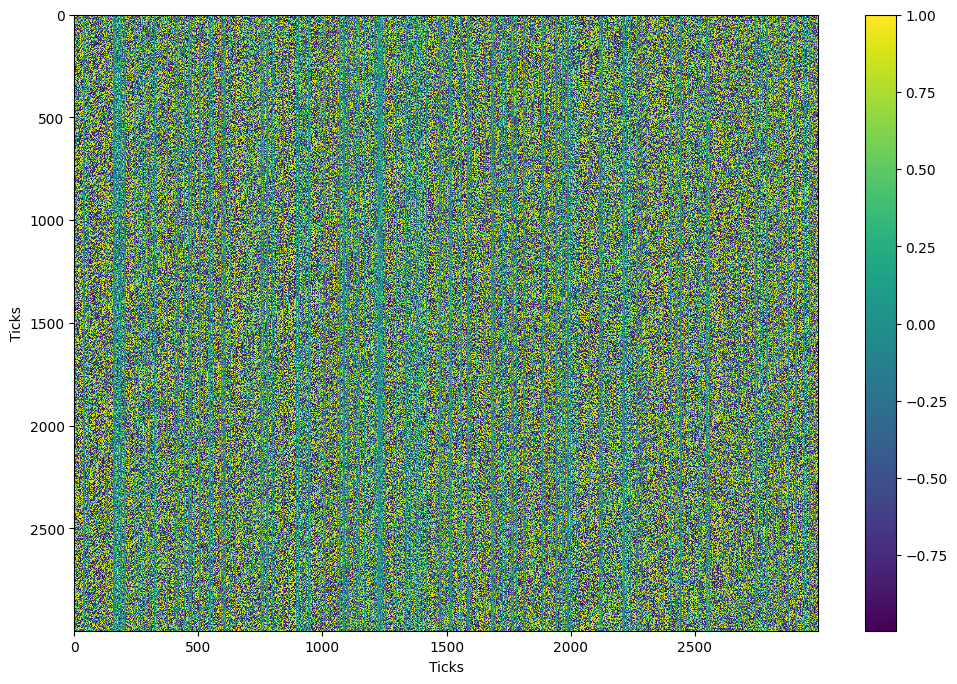

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

[]

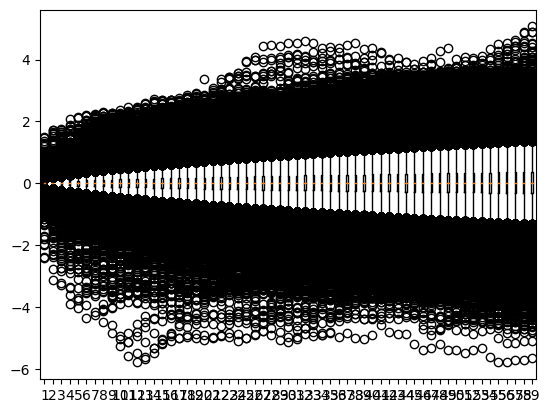

In [ ]:
import matplotlib.pyplot as plt

target_column = "close"

for period in range(1, observation_length):
  plt.boxplot(src_df[target_column].diff(period).dropna(), positions=[period], labels=[str(period)])
plt.plot()

represents value of each step by standalize it based on std of diff of periods

In [ ]:
src_df = df[ohlc_column]
observation_length = 60

In [ ]:
avgs = []
stds = []

for period in range(1, observation_length+1):
  mean = src_df.diff(period).mean()
  std = src_df.diff(period).std()

  avgs.append(mean)
  stds.append(std)

avgs = pd.concat(avgs, axis=1).T
stds = pd.concat(stds, axis=1).T

In [ ]:
batch_obs = []
alpha = 4

indices = random.choices(range(1, len(src_df) - observation_length), k=3000)
for index in indices:
  last_close = src_df["close"].iloc[index-1]
  obs = src_df.iloc[index:index+observation_length].values - last_close
  obs = obs - avgs.values
  obs = obs/(stds.values * alpha)

  if len(obs) !=  observation_length:
    print(f"invalid length in {index}")
  batch_obs.append(obs.tolist())

In [ ]:
cos = nn.CosineSimilarity(dim=1)
similarities = []

obs = torch.tensor(batch_obs)
shifted_obs = obs

for index in range(1, len(indices)):
  shifted_obs = torch.cat((shifted_obs[1:, :, :], shifted_obs[0:1, :, :]), dim=0)
  output = cos(obs, shifted_obs)
  similarity = output.cpu().detach().numpy().mean(axis=1)
  similarities.append(similarity)

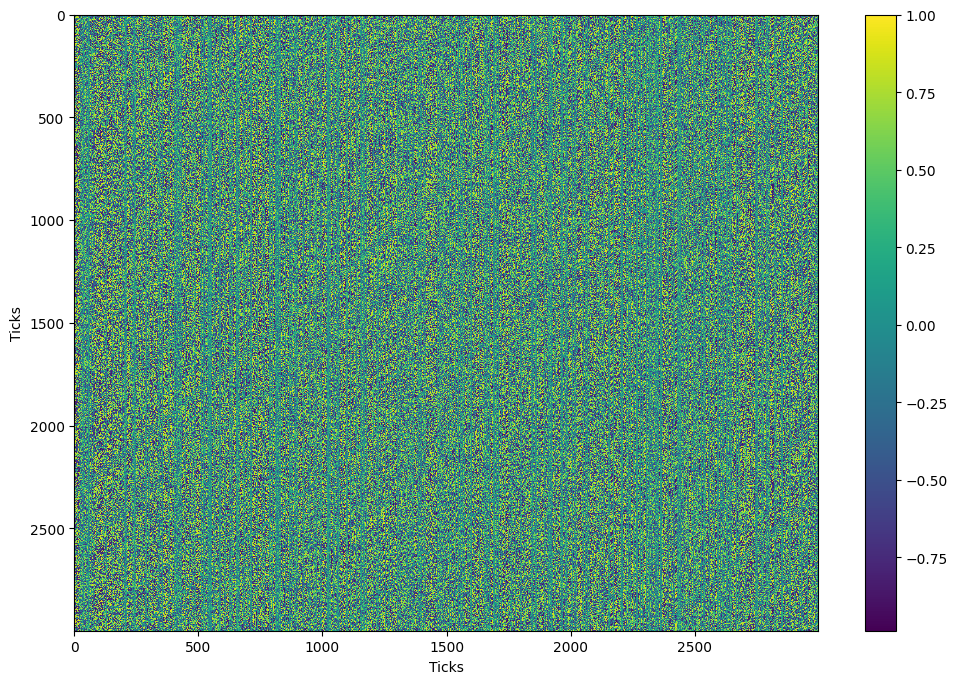

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.pcolormesh(similarities, cmap='viridis')
plt.xlabel('Ticks')
plt.xlim((0, len(similarities)))
plt.ylim((len(similarities),0))
plt.ylabel('Ticks')
plt.colorbar()
plt.show()

<Axes: >

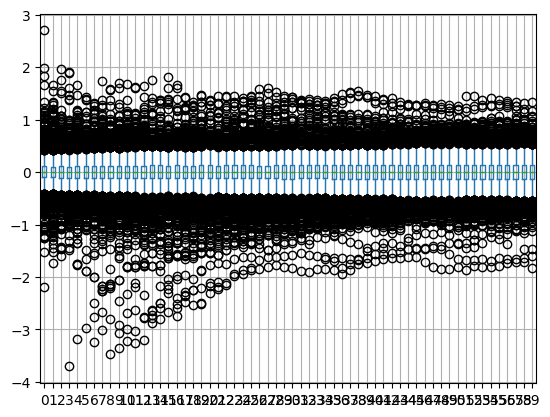

In [ ]:
close_df = pd.DataFrame(obs[:, :, 3].cpu().detach().numpy())
close_df.boxplot()

categorize close observation


In [ ]:
avgs = []
stds = []
close_column = "close"

for period in range(1, observation_length+1):
  mean = src_df[close_column].diff(period).mean()
  std = src_df[close_column].diff(period).std()

  avgs.append(mean)
  stds.append(std)

avgs = pd.Series(avgs)
stds = pd.Series(stds)

In [ ]:
DFS = []
alpha = 4
for index in range(len(src_df) - observation_length - 1):
  token_index = index + 1
  last_close = src_df[close_column].iloc[index]
  token_srs = src_df[close_column].iloc[token_index:token_index+observation_length].values - last_close
  token_src = (token_srs - avgs.values)/(stds.values * alpha)
  DFS.append(pd.Series(token_srs))
tokens_df = pd.concat(DFS, axis=1).T

In [ ]:
tokens_df.shape

(100659, 60)

In [ ]:
import random

label_num_k = 40
max_iter = 10000
count = 0


labels = np.fromiter(random.choices(range(label_num_k), k=tokens_df.shape[0]), dtype = int)
labels_prev = np.zeros(tokens_df.shape[0])
cluster_centers = np.eye(label_num_k, tokens_df.shape[1])

while (not (labels == labels_prev).all()):
    for i in range(label_num_k):
        clusters = tokens_df.iloc[labels == i, :]
        if len(clusters) > 0:
          cluster_centers[i, :] = clusters.mean(axis = 0)
        else:
          cluster_centers[i, :] = np.ones(tokens_df.shape[1])
    dist = ((tokens_df.values[:, :, np.newaxis] - cluster_centers.T[np.newaxis, :, :]) ** 2).sum(axis = 1)
    # dist = np.sqrt(dist)
    labels_prev = labels
    labels = dist.argmin(axis = 1)
    count += 1
    if count > max_iter:
      print("iteration over the limit")
      break

In [ ]:
unique_values, counts = np.unique(labels, return_counts=True)
print(unique_values)
print("----------------")
print(counts)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
----------------
[1269 5292 2305 5720 1193 1560  935  904 4173 4688 3280 1764 4285 7321
  880 4127 4681 1099 2443 7428  106  529  324 1814 2411 2939  404  309
 5499 2653  246  178 1550 3808 2813 1772  530 5178  425 1824]


[]

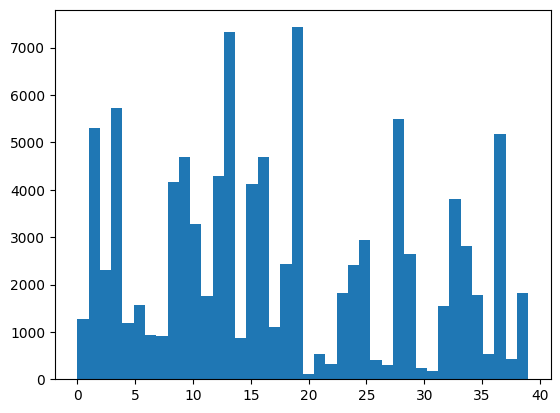

In [ ]:
import matplotlib.pyplot as plt

plt.hist(labels, bins=len(unique_values))
plt.plot()

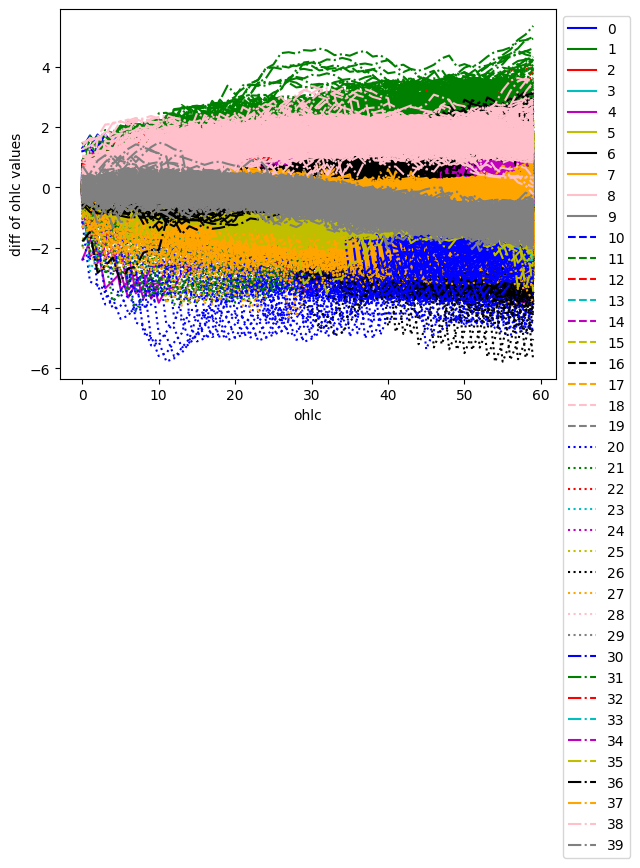

In [ ]:
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'pink', 'gray']
line_styles = ['-', '--', ':', '-.']

if label_num_k > len(colors) * len(line_styles):
  print('lack of line styles')
else:
  for label in range(0, label_num_k):
    label_values = tokens_df.iloc[labels == label, :]
    color_index = label % len(colors)
    style_index = label // len(colors)
    label_values = label_values.dropna().values
    if len(label_values) > 0:
      for value in label_values[:-1]:
        plt.plot(value, linestyle=line_styles[style_index], color=colors[color_index])
      # to show label, add label last values only
      plt.plot(label_values[-1], linestyle=line_styles[style_index], color=colors[color_index], label=label)
  plt.xlabel("ohlc")
  plt.ylabel("diff of ohlc values")
  legend = plt.legend(loc='upper left')
  legend.set_bbox_to_anchor((1, 1))
  plt.show()

# Data argument

Check if argumented data shows different aspects

### Combine multiple symbols

In [ ]:
import pandas as pd
import glob

files = glob.glob(f"{data_folder}/mt5_*_min30.zip")
files

['/content/drive/My Drive/Data/FX/mt5_USDJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_CHFJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_AUDJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_AUDUSD_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_EURJPY_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_USDCHF_min30.zip',
 '/content/drive/My Drive/Data/FX/mt5_EURUSD_min30.zip']

In [ ]:
DFS = []
for file in files:
  df = pd.read_csv(file, index_col=0, parse_dates=True)
  DFS.append(df)

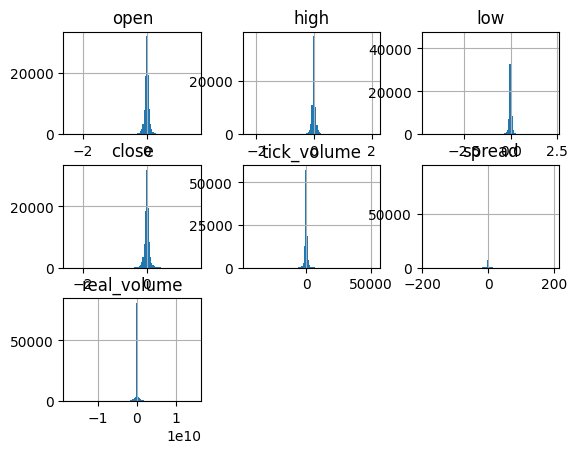

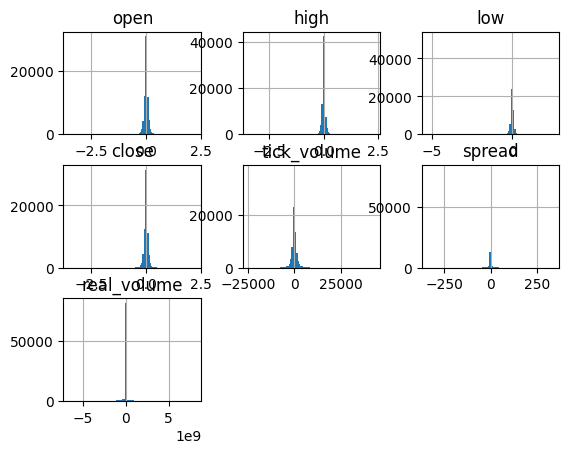

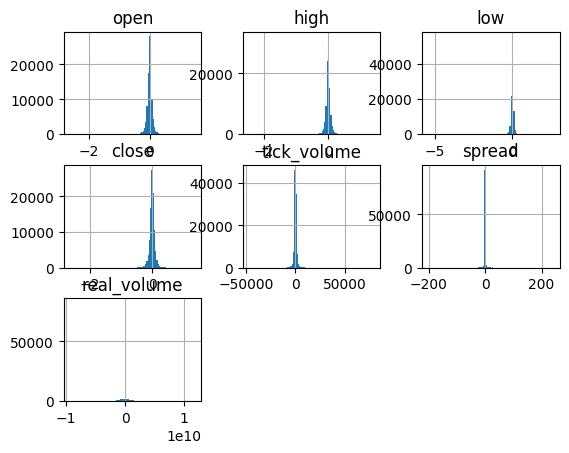

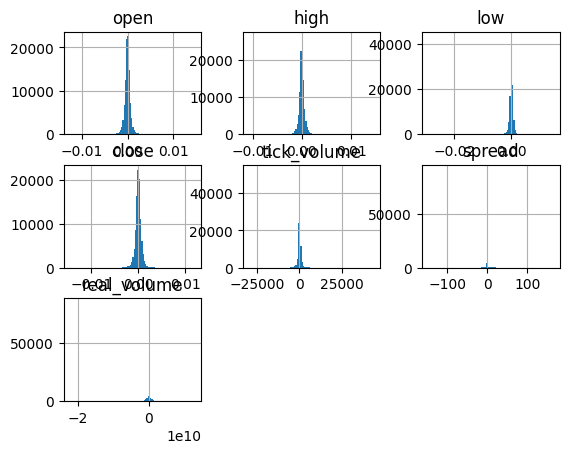

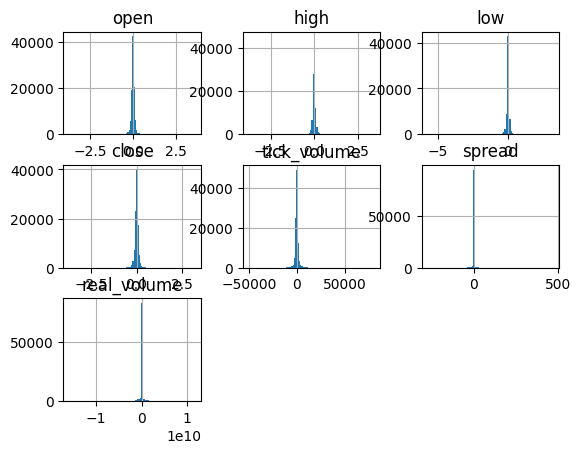

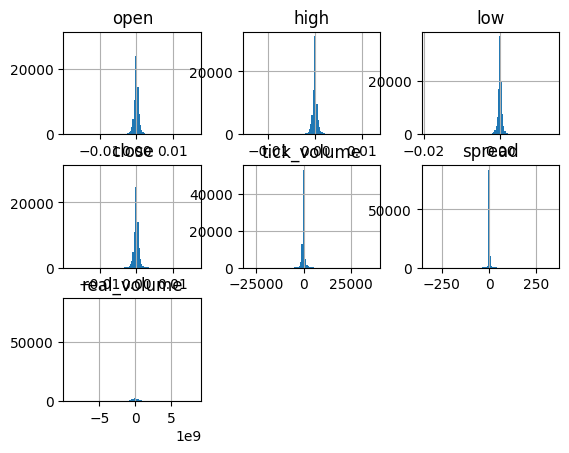

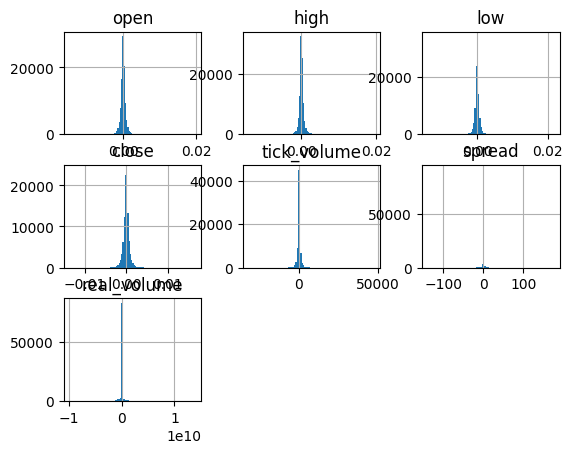

In [ ]:
for rolled_df in DFS:
  rolled_df.diff().hist(bins=100)

In [ ]:
import matplotlib.pyplot as plt
import random

DFS = []
columns = ohlc_column

for file in files:
  src_df = pd.read_csv(file, index_col=0, parse_dates=True)

  diff_p = fprocess.DiffPreProcess(columns=columns)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.MinMaxPreProcess(columns=columns)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = src_df[columns]

  for process in processes:
    src_df = process(src_df)

  indices = random.choices(range(1, len(src_df)), k=3000)
  indices.sort()
  src_df_lim = src_df.iloc[indices].copy()

  cos = nn.CosineSimilarity(dim=1)
  similarities = []
  input2 = torch.tensor(src_df_lim.values)

  for index in range(1, len(src_df_lim)):
    input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
    output = cos(input1, input2)
    similarity = output.cpu().detach().numpy()
    similarities.append(similarity)


  plt.figure(figsize=(12,8))
  plt.pcolormesh(similarities, cmap='viridis')
  plt.xlabel('Ticks')
  plt.xlim((0, len(similarities)))
  plt.ylim((len(similarities),0))
  plt.ylabel('Ticks')
  plt.colorbar()
  plt.show()
  DFS.append(src_df)

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('curt:', src_df.kurtosis().values)

skew: [-4.76680581 -1.08251622 -1.10316985  0.1698781 ]
curt: [212.82098174  41.72337237  41.8575681   46.36204226]
skew: [-4.59276865 -1.27689181 -1.2706615  -0.85325163]
curt: [227.72446264  61.11957426  61.8927234   83.13314138]
skew: [-5.63091632 -1.2958034  -1.28115526 -0.42689441]
curt: [280.72152815  40.8871095   40.52840135  39.45895306]
skew: [-2.15886658 -0.07250304 -0.16262847  0.6027366 ]
curt: [95.92854107 19.55313246 19.62018331 23.98911054]
skew: [-4.43332124 -1.09315609 -1.09990395 -0.30608803]
curt: [207.7852171   63.02260733  58.51823433  80.38622526]
skew: [-0.92563966 -0.2363206  -0.18867572  0.21854575]
curt: [33.70928944 21.73051431 22.18947848 27.15631853]
skew: [-0.22952339  0.16867461  0.11220088  0.9568703 ]
curt: [40.88616986 25.42967896 22.4531892  38.26042539]


array([[<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'open'}>],
       [<Axes: title={'center': 'close'}>,
        <Axes: title={'center': 'high'}>]], dtype=object)

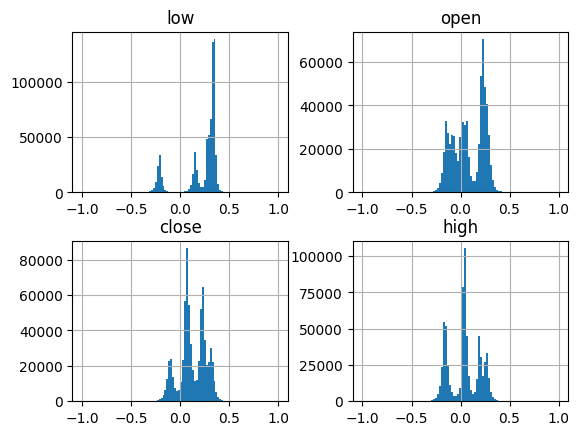

In [ ]:
# It may be not good to handle multiple symbols with min-max standalization
pd.concat(DFS).hist(bins=100)

In [ ]:
import matplotlib.pyplot as plt
import random

DFS = []
columns = ohlc_column

for file in files:
  src_df = pd.read_csv(file, index_col=0, parse_dates=True)

  diff_p = fprocess.DiffPreProcess(columns=columns)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.STDPreProcess(columns=columns, alpha=3)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = src_df[columns]

  for process in processes:
    src_df = process(src_df)

  indices = random.choices(range(1, len(src_df)), k=3000)
  indices.sort()
  src_df_lim = src_df.iloc[indices].copy()

  cos = nn.CosineSimilarity(dim=1)
  similarities = []
  input2 = torch.tensor(src_df_lim.values)

  for index in range(1, len(src_df_lim)):
    input1 = torch.tensor(src_df_lim.iloc[index: index+1].values)
    output = cos(input1, input2)
    similarity = output.cpu().detach().numpy()
    similarities.append(similarity)


  plt.figure(figsize=(12,8))
  plt.pcolormesh(similarities, cmap='viridis')
  plt.xlabel('Ticks')
  plt.xlim((0, len(similarities)))
  plt.ylim((len(similarities),0))
  plt.ylabel('Ticks')
  plt.colorbar()
  plt.show()
  DFS.append(src_df)

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('kurt:', src_df.kurtosis().values)

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.27689181 -0.85325163 -4.59276865 -1.2706615 ]
curt: [ 61.11957426  83.13314138 227.72446264  61.8927234 ]
skew: [-1.2958034  -0.42689441 -5.63091632 -1.28115526]
curt: [ 40.8871095   39.45895306 280.72152815  40.52840135]
skew: [-0.07250304  0.6027366  -2.15886658 -0.16262847]
curt: [19.55313246 23.98911054 95.92854107 19.62018331]
skew: [-1.09315609 -0.30608803 -4.43332124 -1.09990395]
curt: [ 63.02260733  80.38622526 207.7852171   58.51823433]
skew: [-0.2363206   0.21854575 -0.92563966 -0.18867572]
curt: [21.73051431 27.15631853 33.70928944 22.18947848]
skew: [ 0.16867461  0.9568703  -0.22952339  0.11220088]
curt: [25.42967896 38.26042539 40.88616986 22.4531892 ]


In [ ]:
from numpy.lib.shape_base import kron
skews = None
kronurts = None

for src_df in DFS:
  skew = src_df.skew().values
  kronurt = src_df.kurtosis().values
  print('skew:', skew)
  print('kronurt:', kronurt)

  if skews is None:
    skews = skew
    kronurts = kronurt
  else:
    skews = np.vstack((skews, skew))
    kronurts = np.vstack((kronurts, kronurt))

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.27689181 -0.85325163 -4.59276865 -1.2706615 ]
curt: [ 61.11957426  83.13314138 227.72446264  61.8927234 ]
skew: [-1.2958034  -0.42689441 -5.63091632 -1.28115526]
curt: [ 40.8871095   39.45895306 280.72152815  40.52840135]
skew: [-0.07250304  0.6027366  -2.15886658 -0.16262847]
curt: [19.55313246 23.98911054 95.92854107 19.62018331]
skew: [-1.09315609 -0.30608803 -4.43332124 -1.09990395]
curt: [ 63.02260733  80.38622526 207.7852171   58.51823433]
skew: [-0.2363206   0.21854575 -0.92563966 -0.18867572]
curt: [21.73051431 27.15631853 33.70928944 22.18947848]
skew: [ 0.16867461  0.9568703  -0.22952339  0.11220088]
curt: [25.42967896 38.26042539 40.88616986 22.4531892 ]


In [ ]:
print('mean skew:', skews.mean(axis=0))
print('mean kurt:', kronurts.mean(axis=0))

mean skew: [-0.69835951  0.05168524 -3.24826309 -0.71342769]
mean curt: [ 39.06656989  48.39231663 157.08231286  38.15139688]


array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

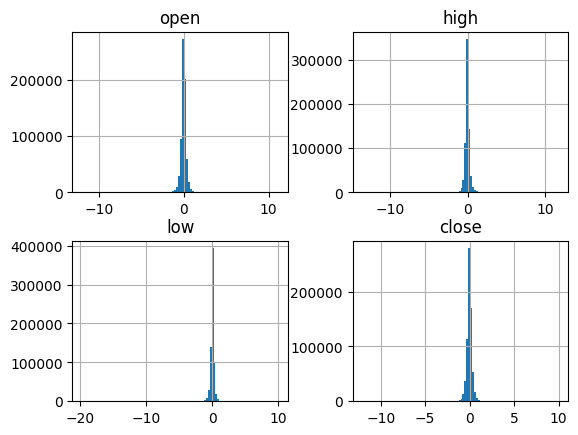

In [ ]:
combined_df = pd.concat(DFS)
combined_df.hist(bins=100)

In [ ]:
print('skew:', combined_df.skew().values)
print('kurt:', combined_df.kurtosis().values)

skew: [-0.69923145  0.05147871 -3.25281005 -0.71433334]
curt: [ 39.07108946  48.37869815 157.28616789  38.15485441]


### Combine different standalization initialized with different alpha

In [ ]:
import os
import pandas as pd

ohlc_column = ['open','high','low','close']
file_name = f"mt5_USDJPY_min30.zip"

file_path = os.path.join(data_folder, file_name)
file_path = os.path.abspath(file_path)
df = pd.read_csv(file_path, parse_dates=True, index_col=0)
df

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
2014-07-07 08:30:00,102.086,102.122,102.081,102.102,738,3,0
2014-07-07 09:00:00,102.102,102.146,102.098,102.113,1036,3,0
2014-07-07 09:30:00,102.113,102.115,102.042,102.044,865,3,0
2014-07-07 10:00:00,102.047,102.052,102.005,102.019,983,3,0
2014-07-07 10:30:00,102.017,102.025,101.918,101.941,1328,3,0
...,...,...,...,...,...,...,...
2022-08-12 21:30:00,133.461,133.506,133.439,133.484,1125,3,0
2022-08-12 22:00:00,133.484,133.530,133.437,133.475,1277,3,0
2022-08-12 22:30:00,133.475,133.486,133.433,133.483,1506,3,0


In [ ]:
DFS = []
ALPHAS = [1, 2, 3]

for alpha in ALPHAS:
  diff_p = fprocess.DiffPreProcess(columns=ohlc_column)
  ohlc_pre_process = [diff_p]

  standalization_p = fprocess.STDPreProcess(columns=ohlc_column, alpha=alpha)
  processes = [*ohlc_pre_process, standalization_p]

  src_df = df[["open", "high", "low", "close"]].copy()

  for process in processes:
    src_df = process(src_df)
  DFS.append(src_df)

In [ ]:
for src_df in DFS:
  print('skew:', src_df.skew().values)
  print('kurt:', src_df.kurtosis().values)

skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]
skew: [-1.08251622  0.1698781  -4.76680581 -1.10316985]
curt: [ 41.72337237  46.36204226 212.82098174  41.8575681 ]


array([[<Axes: title={'center': 'open'}>,
        <Axes: title={'center': 'high'}>],
       [<Axes: title={'center': 'low'}>,
        <Axes: title={'center': 'close'}>]], dtype=object)

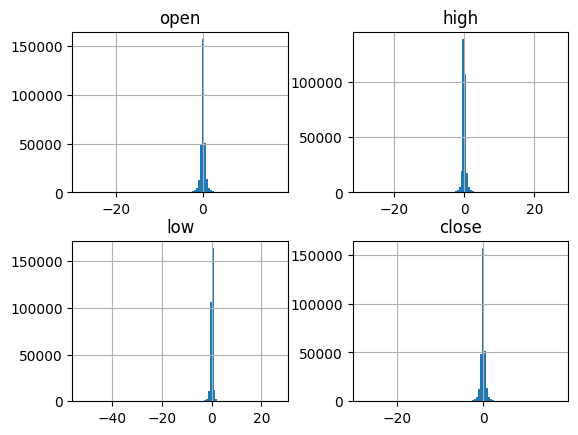

In [ ]:
combined_df = pd.concat(DFS)
combined_df.hist(bins=100)

### Dataset consist of different source

In [256]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

stock_source_files = glob.glob("L:/data/yfinance/yfinance_*_D1.csv")
fx_source_files = glob.glob("L:/data/fx/OANDA-Japan MT5 Live/*d1.csv")

In [ ]:
df = pd.read_csv("L:/data/yfinance/yfinance_2002.T_D1.csv", index_col=0, parse_dates=True)
df

,Open,High,Low,Close,Adj Close,Volume
Datetime,,,,,,
2000-01-04,534.184814,540.195374,529.676941,531.179565,378.375244,183678
2000-01-05,551.465027,574.755798,537.190063,555.221680,395.501160,354046
2000-01-06,534.184814,545.454529,529.676941,537.190063,382.656616,461857
2000-01-07,544.703247,555.972961,537.941406,546.205872,389.078949,351384
2000-01-11,553.718994,559.729492,537.190063,543.951904,387.473419,364694
...,...,...,...,...,...,...
2024-06-04,1762.000000,1781.500000,1758.000000,1781.500000,1781.500000,772700
2024-06-05,1780.000000,1806.500000,1777.500000,1790.000000,1790.000000,1040600
2024-06-06,1792.500000,1803.000000,1781.500000,1792.000000,1792.000000,848600


In [3]:
def get_tick_size(price: float) -> float:
    if price < 1000:
        return 0.1
    elif price < 3000:
        return 0.5
    elif price < 5000:
        return 1
    elif price < 30000:
        return 5
    elif price < 50000:
        return 10
    else:
        return 50

def price_to_ticks(price: float) -> int:
    tick_size = get_tick_size(price)
    ticks = round(price / tick_size)
    return ticks

def ticks_to_price(ticks: int, reference_price: float) -> float:
    tick_size = get_tick_size(reference_price)
    return ticks * tick_size

[]

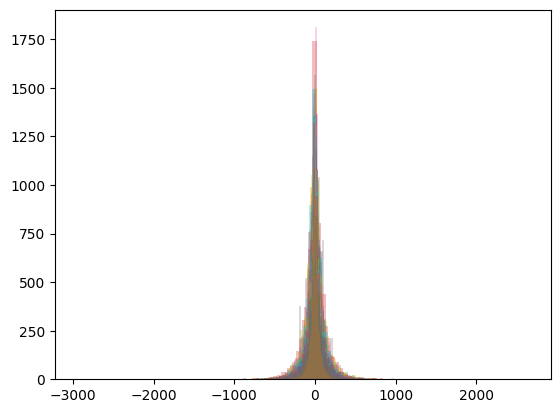

In [ ]:
valid_count = 0
invalid_count = 0

for file in stock_source_files:
  df = pd.read_csv(file, index_col=0, parse_dates=True)
  units = df["Adj Close"].apply(get_tick_size)
  unit_close = (df["Adj Close"].diff() / units ).round()
  std = unit_close.std()
  max_value = unit_close.abs().max()
  if std * 20 < max_value:
    # print(f"file: {file} unit: {unit} std: {std} max: {max_value} ratio: {max_value/std}")
    invalid_count += 1
    continue
  valid_count += 1
  plt.hist(unit_close, bins=100, alpha=0.3)
plt.plot()

In [ ]:
valid_count, invalid_count

[]

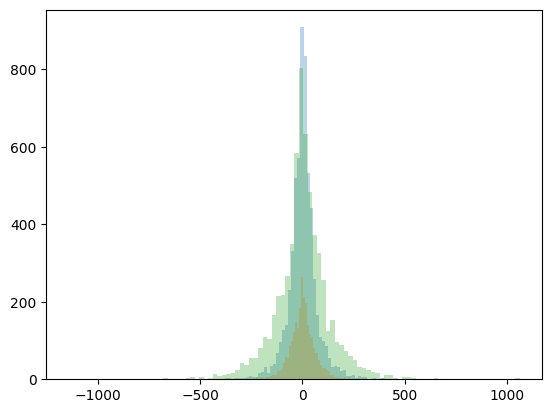

In [ ]:
valid_count = 0
invalid_count = 0

for file in stock_source_files:
  df = pd.read_csv(file, index_col=0, parse_dates=True)
  units = df["Adj Close"].apply(get_tick_size)
  unit_close = (df["Adj Close"].diff() / units ).round()
  std = unit_close.std()
  max_value = unit_close.abs().max()
  if std * 10 < max_value:
    invalid_length = len(unit_close[unit_close.abs() >= (std * 10)])
    invalid_count += 1
    print(f"file: {file} unit: {unit} std: {std} max: {max_value} ratio: {max_value/std}")
    break
  valid_count += 1
  plt.hist(unit_close, bins=100, alpha=0.3)
plt.plot()

In [95]:
unit_close[unit_close.abs() >= (std * 10)]

Datetime
2007-11-05   -1321.0
Name: Adj Close, dtype: float64

In [258]:
df = pd.read_csv(fx_source_files[0], index_col=0, parse_dates=True)
df.head()

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
1993-04-27,0.91090000000000004299,0.91090000000000004299,0.91090000000000004299,0.91090000000000004299,1,200,0
1993-04-28,0.90680000000000005045,0.90680000000000005045,0.90680000000000005045,0.90680000000000005045,1,200,0
1993-04-29,0.90400000000000002576,0.90400000000000002576,0.90400000000000002576,0.90400000000000002576,1,200,0
1993-04-30,0.89900000000000002132,0.89900000000000002132,0.89900000000000002132,0.89900000000000002132,1,200,0
1993-05-03,0.89549999999999996270,0.89549999999999996270,0.89549999999999996270,0.89549999999999996270,1,200,0


In [86]:
pd.options.display.precision = 20

In [260]:
def group_by_close_values(series, atol=1e-12, rtol=1e-9):
    values = np.sort(series[series > 0].values)
    if len(values) == 0:
        return pd.DataFrame(columns=["count", "sigfig_min", "sigfig_max", "sigfig_median"])

    groups = []
    current_group = [values[0]]

    for val in values[1:]:
        if np.isclose(val, current_group[-1], atol=atol, rtol=rtol):
            current_group.append(val)
        else:
            groups.append(current_group)
            current_group = [val]

    if current_group:
        groups.append(current_group)

    # 結果をまとめる
    rows = []
    for group in groups:
        key = np.median(group)
        rows.append({
            "value": key,
            "count": len(group),
        })

    return pd.DataFrame(rows).set_index("value").sort_index()

# 使用例
result_df = group_by_close_values(df["close"].diff().abs().dropna(), atol=1e-12, rtol=1e-9)
print(result_df.head(10))

                        count
value                        
0.00001000000000006551      8
0.00002000000000002000      8
0.00002999999999997449      8
0.00004000000000004000      6
0.00004999999999999449     12
0.00005999999999994898      3
0.00007000000000001450     11
0.00007999999999985796      2
0.00009000000000003450      6
0.00009999999999998899     77


In [261]:
def count_sig_digits_visual(x, tol=1e-12):
    """
    浮動小数点誤差を無視し、人間の目で見たときの有効数字の桁数を推定
    """
    if x == 0 or np.isnan(x):
        return 0

    # 誤差を無視するため丸める（例: tol=1e-12 → 12桁以内に収める）
    rounded = round(x / tol) * tol  # 例: tol=1e-12 の精度で揃える
    # 見た目ベースで桁数を数える（指数表現なし）
    s = format(rounded, '.15g')  # 最大15桁の精度で、人間が見る表現に近づける
    s = s.replace('.', '')
    return len(s) - 1

In [263]:
sf = count_sig_digits_visual(result_df.index[1] - result_df.index[0])
sf

4

In [265]:
unit =  result_df.index[0].round(sf + 1)
unit

np.float64(1e-05)

In [266]:
diff_df = diff_df.round(sf + 1)
id_token_df = (diff_df.dropna() / unit).round().astype('int')
id_token_df

0
2002-08-20    -4000
2002-08-21   -10000
2002-08-22    40000
2002-08-23    -3000
2002-08-25    15000
              ...  
2022-12-26    67000
2022-12-27    67600
2022-12-28    -9200
2022-12-29   -34900
2022-12-30   -49900
Name: close, Length: 6363, dtype: int64

In [267]:
filename = f"../../Data/FX_MT5_ID/{os.path.basename(fx_source_files[0])}"
os.makedirs(os.path.dirname(filename), exist_ok=True)
id_token_df.to_csv(filename, index=True, header=True)

In [288]:
for file in fx_source_files:
    df = pd.read_csv(file, index_col=0, parse_dates=True)
    diff_df = df["close"].diff()
    diff_df_abs = diff_df.abs()
    diff_df_abs = diff_df_abs[diff_df_abs > 0]
    result_df = group_by_close_values(diff_df_abs)
    sf = count_sig_digits_visual(result_df.index[1] - result_df.index[0]) + 1
    unit =  result_df.index[0].round(sf)
    print(f"file:{file}, unit: {unit} sf: {sf}")
    diff_df = diff_df.round(sf)
    id_token_df = (diff_df.dropna() / unit).round().astype('int')

    filename = f"../../Data/FX_MT5_ID/{os.path.basename(file)}"
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    id_token_df.to_csv(filename, index=True, header=True)

file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUDCAD_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUDCHF_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUDJPY_d1.csv, unit: 0.001 sf: 4
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUDNZD_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUDUSD_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_AUS200_d1.csv, unit: 0.1000000000004 sf: 13
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CADCHF_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CADJPY_d1.csv, unit: 0.001 sf: 4
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CHFJPY_d1.csv, unit: 0.001 sf: 4
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CHINA50_d1.csv, unit: 0.1 sf: 2
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CNHJPY_d1.csv, unit: 0.001 sf: 4
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_COPPER_d1.csv, unit: 1e-05 sf: 5
file:L:/data/fx/OANDA-Japan MT5 Live\mt5_CORN_d1.csv, unit: 0.001 sf: 4
file:L:/data/fx/OANDA-Japan MT

[]

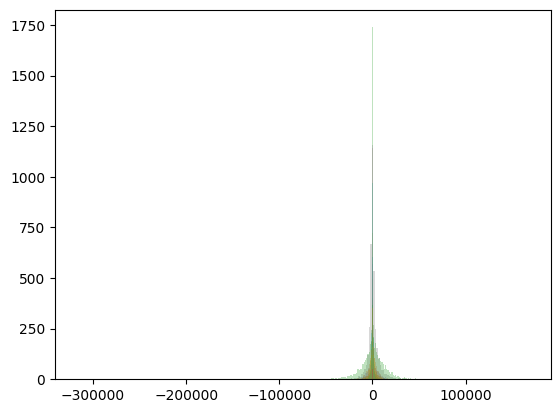

In [289]:
files = glob.glob("../../Data/FX_MT5_ID/*.csv")

for file in files:
    df = pd.read_csv(file, index_col=0, parse_dates=True)
    # df.hist(bins=300)
    plt.hist(df.values, bins=300, alpha=0.3)
plt.plot()

In [291]:
files = glob.glob("../../Data/FX_MT5_ID/*.csv")
invalid_files = []
max_values = []
std_values = []

for file in files:
    df = pd.read_csv(file, index_col=0, parse_dates=True)
    max_value = df.abs().max()
    std = df.diff().std()
    max_values.append(max_value)
    std_values.append(std)
    if (max_value > std * 10).any():
        print(f"file: {file} diff max: {df.diff().abs().max()} diff std: {df.diff().std()}")
        invalid_files.append(file)

file: ../../Data/FX_MT5_ID\mt5_AUDCHF_d1.csv diff max: close    15928.0
dtype: float64 diff std: close    1023.7032611400867381235
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_CHFJPY_d1.csv diff max: close    24759.0
dtype: float64 diff std: close    1030.09972583154126368754
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_EURCHF_d1.csv diff max: close    18253.0
dtype: float64 diff std: close    718.57612465496674758469
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_GBPCHF_d1.csv diff max: close    30570.0
dtype: float64 diff std: close    1583.98000968749829553417
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_GBPUSD_d1.csv diff max: close    14101.0
dtype: float64 diff std: close    1220.03821556488628630177
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_USDJPY_d1.csv diff max: close    25880.0
dtype: float64 diff std: close    1394.2632297943832782039
dtype: float64
file: ../../Data/FX_MT5_ID\mt5_USDTRY_d1.csv diff max: close    389215.0
dtype: float64 diff std: close    15090.83790494

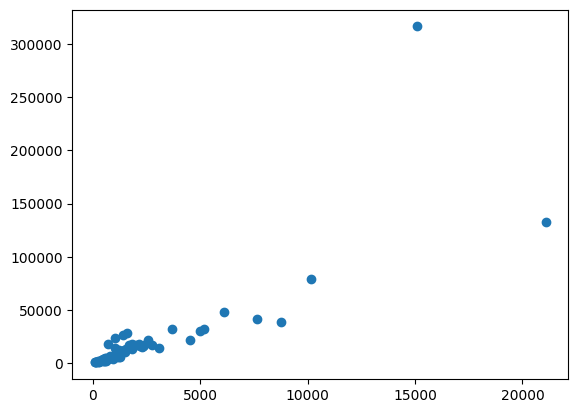

In [293]:
plt.scatter(std_values, max_values)

In [300]:
src_folder = os.path.dirname(fx_source_files[0])
file = invalid_files[-1]
filename = os.path.join(src_folder, os.path.basename(file))
df = pd.read_csv(filename, index_col=0, parse_dates=True)
df.head()

,open,high,low,close,tick_volume,spread,real_volume
time,,,,,,,
2010-05-31,1.57549999999999990052,1.59309999999999996056,1.57230000000000003091,1.58260000000000000675,6751,0,0
2010-06-01,1.58329999999999992966,1.58660000000000001030,1.57570000000000010054,1.57699999999999995737,4555,0,0
2010-06-02,1.56770000000000009344,1.59220000000000005969,1.56669999999999998153,1.58660000000000001030,4383,0,0
2010-06-07,1.59959999999999991083,1.61220000000000007745,1.59840000000000004299,1.59929999999999994387,5355,0,0
2010-06-08,1.59980000000000011084,1.60329999999999994742,1.59349999999999991651,1.60119999999999995666,5826,0,0


In [301]:
diff_df = df["close"].diff()
diff_df_abs = diff_df.abs()
diff_df_abs = diff_df_abs[diff_df_abs > 0]
result_df = group_by_close_values(diff_df_abs)
sf = count_sig_digits_visual(result_df.index[1] - result_df.index[0]) + 1
unit =  result_df.index[0].round(sf)
diff_df = diff_df.round(sf)
id_token_df = (diff_df.dropna() / unit).round().astype('int')

In [305]:
id_token_df[id_token_df > 100000]

time
2021-11-23    138115
2023-06-07    167214
2023-06-22    131132
2025-03-19    107129
Name: close, dtype: int64

<Axes: xlabel='time'>

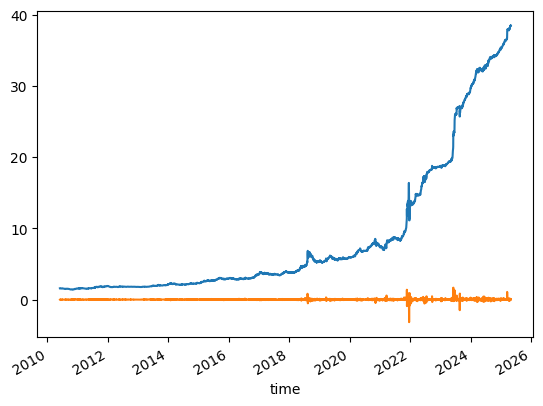

In [307]:
df["close"].plot()
df["close"].diff().plot()

<Axes: >

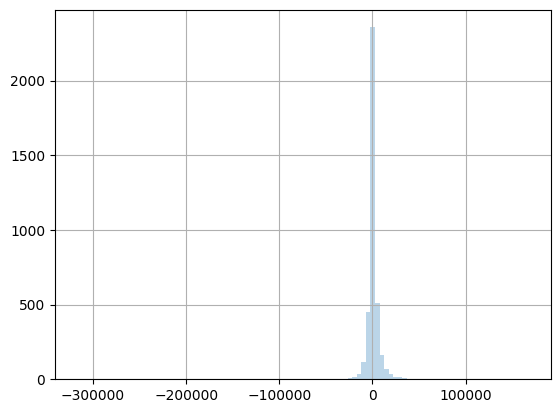

In [308]:
id_token_df.hist(bins=100, alpha=0.3)

## Evaluate with validation data